In [113]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks as cf
import plotly.express as px
import statsmodels.api as sm
import scipy.stats
import sklearn
import plotly.graph_objects as go
from scipy import stats
from functools import reduce
from importlib import reload
import itertools
from itertools import count
import sys
import re
import os
import textwrap
from sklearn.linear_model import LogisticRegression

# from ukbb_parser import UKBBParser

from scipy.stats import pearsonr
from scipy.stats import kstest
from scipy.stats import chisquare
from scipy.stats import ttest_ind
from scipy.stats import levene
from scipy.stats import chisquare
from scipy.stats import zscore

<h1> Read Data </h1>

In [114]:
sex_And_YearofBirth = pd.read_csv('/Users/cw3222/Documents/Imperial/BioBank/Sex_And_YearofBirth_eids.csv')
sex_And_YearofBirth.drop(columns = ['Unnamed: 0'], inplace = True)
sex_And_YearofBirth['Year of Birth'] = sex_And_YearofBirth['Year of Birth'].astype(int)
ethnicity = pd.read_csv('/Users/cw3222/Documents/Imperial/BioBank/ethnicity_data_biobank.csv')
ethnicity.drop(columns = ['Unnamed: 0'], inplace = True)
ethnicity.rename(columns={'Meaning': 'Ethnicity'}, inplace = True)
dead_info = pd.read_csv('./AllDead.csv').drop(columns = {'Unnamed: 0'})
dead_info['Date of Death'] = pd.to_datetime(dead_info['Date of Death'])

demographics = sex_And_YearofBirth.merge(dead_info[['eid', 'Date of Death']], on = 'eid', how = 'left')
demographics

,eid,Sex,Year of Birth,Date of Death
0,1000016,1,1956,NaT
1,1000021,1,1943,NaT
2,1000033,0,1966,NaT
3,1000049,1,1955,NaT
4,1000057,0,1955,NaT
...,...,...,...,...
502183,6024748,1,1947,NaT
502184,6024754,0,1942,NaT
502185,6024761,0,1941,NaT
502186,6024776,0,1963,NaT


In [115]:

icd_10 = pd.read_csv('/Users/cw3222/Documents/Imperial/BioBank/ICD_API_Codes.csv')
icd_10 =icd_10[['Code', 'Title']].drop_duplicates()
icd_10['Code'] = icd_10['Code'].str.replace('.', '')
icd_10.isna().sum()
icd10_dates = pd.read_csv('./ICD10_Date.csv').drop(columns = {'Unnamed: 0'})
icd10_codes = pd.read_csv('./icd_10_codes_eid.csv').drop(columns = {'Unnamed: 0'})
icd10_codes.rename(columns={col: col + '_Phenotype' for col in icd10_codes.columns if col != 'eid'}, inplace=True)
icd_code_date = icd10_codes.merge(icd10_dates, on = 'eid', how = 'outer')
phenotype_cols = [col for col in icd10_codes.columns if '_Phenotype' in col]
dates_cols = [col for col in icd10_dates.columns if col != 'eid']

new_column_order = ['eid']
for p_col, d_col in zip(phenotype_cols, dates_cols):
    new_column_order.append(p_col)
    new_column_order.append(d_col)

icd_code_dates = icd_code_date[new_column_order]
icd_code_dates.dropna(subset = '41270-0.0_Phenotype').head(50)

/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/2937393702.py:5: DtypeWarning:

Columns (103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260) have mixed types. Specify dtype option on import or set low_memory=False.

/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/2937393702.py:6: DtypeWarning:

Columns (103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,

,eid,41270-0.0_Phenotype,41280-0.0,41270-0.1_Phenotype,41280-0.1,41270-0.2_Phenotype,41280-0.2,41270-0.3_Phenotype,41280-0.3,41270-0.4_Phenotype,41280-0.4,41270-0.5_Phenotype,41280-0.5,41270-0.6_Phenotype,41280-0.6,41270-0.7_Phenotype,41280-0.7,41270-0.8_Phenotype,41280-0.8,41270-0.9_Phenotype,41280-0.9,41270-0.10_Phenotype,41280-0.10,41270-0.11_Phenotype,41280-0.11,41270-0.12_Phenotype,41280-0.12,41270-0.13_Phenotype,41280-0.13,41270-0.14_Phenotype,41280-0.14,41270-0.15_Phenotype,41280-0.15,41270-0.16_Phenotype,41280-0.16,41270-0.17_Phenotype,41280-0.17,41270-0.18_Phenotype,41280-0.18,41270-0.19_Phenotype,41280-0.19,41270-0.20_Phenotype,41280-0.20,41270-0.21_Phenotype,41280-0.21,41270-0.22_Phenotype,41280-0.22,41270-0.23_Phenotype,41280-0.23,41270-0.24_Phenotype,41280-0.24,41270-0.25_Phenotype,41280-0.25,41270-0.26_Phenotype,41280-0.26,41270-0.27_Phenotype,41280-0.27,41270-0.28_Phenotype,41280-0.28,41270-0.29_Phenotype,41280-0.29,41270-0.30_Phenotype,41280-0.30,41270-0.31_Phenotype,41280-0.31,41270-0.32_Phenotype,41280-0.32,41270-0.33_Phenotype,41280-0.33,41270-0.34_Phenotype,41280-0.34,41270-0.35_Phenotype,41280-0.35,41270-0.36_Phenotype,41280-0.36,41270-0.37_Phenotype,41280-0.37,41270-0.38_Phenotype,41280-0.38,41270-0.39_Phenotype,41280-0.39,41270-0.40_Phenotype,41280-0.40,41270-0.41_Phenotype,41280-0.41,41270-0.42_Phenotype,41280-0.42,41270-0.43_Phenotype,41280-0.43,41270-0.44_Phenotype,41280-0.44,41270-0.45_Phenotype,41280-0.45,41270-0.46_Phenotype,41280-0.46,41270-0.47_Phenotype,41280-0.47,41270-0.48_Phenotype,41280-0.48,41270-0.49_Phenotype,41280-0.49,41270-0.50_Phenotype,41280-0.50,41270-0.51_Phenotype,41280-0.51,41270-0.52_Phenotype,41280-0.52,41270-0.53_Phenotype,41280-0.53,41270-0.54_Phenotype,41280-0.54,41270-0.55_Phenotype,41280-0.55,41270-0.56_Phenotype,41280-0.56,41270-0.57_Phenotype,41280-0.57,41270-0.58_Phenotype,41280-0.58,41270-0.59_Phenotype,41280-0.59,41270-0.60_Phenotype,41280-0.60,41270-0.61_Phenotype,41280-0.61,41270-0.62_Phenotype,41280-0.62,41270-0.63_Phenotype,41280-0.63,41270-0.64_Phenotype,41280-0.64,41270-0.65_Phenotype,41280-0.65,41270-0.66_Phenotype,41280-0.66,41270-0.67_Phenotype,41280-0.67,41270-0.68_Phenotype,41280-0.68,41270-0.69_Phenotype,41280-0.69,41270-0.70_Phenotype,41280-0.70,41270-0.71_Phenotype,41280-0.71,41270-0.72_Phenotype,41280-0.72,41270-0.73_Phenotype,41280-0.73,41270-0.74_Phenotype,41280-0.74,41270-0.75_Phenotype,41280-0.75,41270-0.76_Phenotype,41280-0.76,41270-0.77_Phenotype,41280-0.77,41270-0.78_Phenotype,41280-0.78,41270-0.79_Phenotype,41280-0.79,41270-0.80_Phenotype,41280-0.80,41270-0.81_Phenotype,41280-0.81,41270-0.82_Phenotype,41280-0.82,41270-0.83_Phenotype,41280-0.83,41270-0.84_Phenotype,41280-0.84,41270-0.85_Phenotype,41280-0.85,41270-0.86_Phenotype,41280-0.86,41270-0.87_Phenotype,41280-0.87,41270-0.88_Phenotype,41280-0.88,41270-0.89_Phenotype,41280-0.89,41270-0.90_Phenotype,41280-0.90,41270-0.91_Phenotype,41280-0.91,41270-0.92_Phenotype,41280-0.92,41270-0.93_Phenotype,41280-0.93,41270-0.94_Phenotype,41280-0.94,41270-0.95_Phenotype,41280-0.95,41270-0.96_Phenotype,41280-0.96,41270-0.97_Phenotype,41280-0.97,41270-0.98_Phenotype,41280-0.98,41270-0.99_Phenotype,41280-0.99,41270-0.100_Phenotype,41280-0.100,41270-0.101_Phenotype,41280-0.101,41270-0.102_Phenotype,41280-0.102,41270-0.103_Phenotype,41280-0.103,41270-0.104_Phenotype,41280-0.104,41270-0.105_Phenotype,41280-0.105,41270-0.106_Phenotype,41280-0.106,41270-0.107_Phenotype,41280-0.107,41270-0.108_Phenotype,41280-0.108,41270-0.109_Phenotype,41280-0.109,41270-0.110_Phenotype,41280-0.110,41270-0.111_Phenotype,41280-0.111,41270-0.112_Phenotype,41280-0.112,41270-0.113_Phenotype,41280-0.113,41270-0.114_Phenotype,41280-0.114,41270-0.115_Phenotype,41280-0.115,41270-0.116_Phenotype,41280-0.116,41270-0.117_Phenotype,41280-0.117,41270-0.118_Phenotype,41280-0.118,41270-0.119_Phenotype,41280-0.119,41270-0.120_Phenotype,41280-0.120,41270-0.121_Phenotype,41280-0.121,41270-0.122_Phenotype,41280-0.122,41270-0.123_Phenotype,41280-0.123

In [116]:
icd10_prefixes = ['41270-']
icd10_phenotypes = icd_code_dates[['eid']].copy()
mapped_values_map = dict(zip(icd_10['Code'].str[:4], icd_10['Title']))

for col in icd_code_dates.columns:
    if col.startswith(tuple(icd10_prefixes)):
        icd10_phenotypes[col + '_Phenotype'] = icd_code_dates[col].astype(str).str[:4].map(mapped_values_map)

icd10_phenotypes = icd10_phenotypes.dropna(subset = '41270-0.0_Phenotype_Phenotype')

/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/357983368.py:7: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/357983368.py:7: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/357983368.py:7: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.conca

<h2> Control Disease: cntrldisease </h2>

<h1> Alter ICD 10 Code HERE for ctrl disease <h1>

In [117]:
any_ctrldis = ['S72'] #

pattern_any = '|'.join(any_ctrldis)
pattern_anymask = icd_code_dates.drop(columns='eid').apply(lambda col: col.str.contains(pattern_any, case=False)).any(axis=1)
any_ctrldis = icd_code_dates[pattern_anymask].reset_index(drop=True)

In [118]:
any_cntrldisease_eids = any_ctrldis['eid']
without_arth = icd_code_dates[~icd_code_dates['eid'].isin(any_cntrldisease_eids)]

In [119]:
any_cntrldisease_eids_clean = any_ctrldis[any_ctrldis['eid'].isin(icd10_phenotypes['eid'])]
clean_cntrldisease_eids = any_cntrldisease_eids_clean['eid']
clean_cntrldisease_eids

0       1000239
1       1000814
2       1001132
3       1001270
4       1001934
         ...   
7314    6019263
7315    6020243
7316    6021589
7317    6022634
7318    6023361
Name: eid, Length: 7293, dtype: int64

In [120]:
cntrldisease_individuals = icd10_phenotypes[icd10_phenotypes['eid'].isin(clean_cntrldisease_eids)]
cntrldisease_individuals

,eid,41270-0.0_Phenotype_Phenotype,41270-0.1_Phenotype_Phenotype,41270-0.2_Phenotype_Phenotype,41270-0.3_Phenotype_Phenotype,41270-0.4_Phenotype_Phenotype,41270-0.5_Phenotype_Phenotype,41270-0.6_Phenotype_Phenotype,41270-0.7_Phenotype_Phenotype,41270-0.8_Phenotype_Phenotype,41270-0.9_Phenotype_Phenotype,41270-0.10_Phenotype_Phenotype,41270-0.11_Phenotype_Phenotype,41270-0.12_Phenotype_Phenotype,41270-0.13_Phenotype_Phenotype,41270-0.14_Phenotype_Phenotype,41270-0.15_Phenotype_Phenotype,41270-0.16_Phenotype_Phenotype,41270-0.17_Phenotype_Phenotype,41270-0.18_Phenotype_Phenotype,41270-0.19_Phenotype_Phenotype,41270-0.20_Phenotype_Phenotype,41270-0.21_Phenotype_Phenotype,41270-0.22_Phenotype_Phenotype,41270-0.23_Phenotype_Phenotype,41270-0.24_Phenotype_Phenotype,41270-0.25_Phenotype_Phenotype,41270-0.26_Phenotype_Phenotype,41270-0.27_Phenotype_Phenotype,41270-0.28_Phenotype_Phenotype,41270-0.29_Phenotype_Phenotype,41270-0.30_Phenotype_Phenotype,41270-0.31_Phenotype_Phenotype,41270-0.32_Phenotype_Phenotype,41270-0.33_Phenotype_Phenotype,41270-0.34_Phenotype_Phenotype,41270-0.35_Phenotype_Phenotype,41270-0.36_Phenotype_Phenotype,41270-0.37_Phenotype_Phenotype,41270-0.38_Phenotype_Phenotype,41270-0.39_Phenotype_Phenotype,41270-0.40_Phenotype_Phenotype,41270-0.41_Phenotype_Phenotype,41270-0.42_Phenotype_Phenotype,41270-0.43_Phenotype_Phenotype,41270-0.44_Phenotype_Phenotype,41270-0.45_Phenotype_Phenotype,41270-0.46_Phenotype_Phenotype,41270-0.47_Phenotype_Phenotype,41270-0.48_Phenotype_Phenotype,41270-0.49_Phenotype_Phenotype,41270-0.50_Phenotype_Phenotype,41270-0.51_Phenotype_Phenotype,41270-0.52_Phenotype_Phenotype,41270-0.53_Phenotype_Phenotype,41270-0.54_Phenotype_Phenotype,41270-0.55_Phenotype_Phenotype,41270-0.56_Phenotype_Phenotype,41270-0.57_Phenotype_Phenotype,41270-0.58_Phenotype_Phenotype,41270-0.59_Phenotype_Phenotype,41270-0.60_Phenotype_Phenotype,41270-0.61_Phenotype_Phenotype,41270-0.62_Phenotype_Phenotype,41270-0.63_Phenotype_Phenotype,41270-0.64_Phenotype_Phenotype,41270-0.65_Phenotype_Phenotype,41270-0.66_Phenotype_Phenotype,41270-0.67_Phenotype_Phenotype,41270-0.68_Phenotype_Phenotype,41270-0.69_Phenotype_Phenotype,41270-0.70_Phenotype_Phenotype,41270-0.71_Phenotype_Phenotype,41270-0.72_Phenotype_Phenotype,41270-0.73_Phenotype_Phenotype,41270-0.74_Phenotype_Phenotype,41270-0.75_Phenotype_Phenotype,41270-0.76_Phenotype_Phenotype,41270-0.77_Phenotype_Phenotype,41270-0.78_Phenotype_Phenotype,41270-0.79_Phenotype_Phenotype,41270-0.80_Phenotype_Phenotype,41270-0.81_Phenotype_Phenotype,41270-0.82_Phenotype_Phenotype,41270-0.83_Phenotype_Phenotype,41270-0.84_Phenotype_Phenotype,41270-0.85_Phenotype_Phenotype,41270-0.86_Phenotype_Phenotype,41270-0.87_Phenotype_Phenotype,41270-0.88_Phenotype_Phenotype,41270-0.89_Phenotype_Phenotype,41270-0.90_Phenotype_Phenotype,41270-0.91_Phenotype_Phenotype,41270-0.92_Phenotype_Phenotype,41270-0.93_Phenotype_Phenotype,41270-0.94_Phenotype_Phenotype,41270-0.95_Phenotype_Phenotype,41270-0.96_Phenotype_Phenotype,41270-0.97_Phenotype_Phenotype,41270-0.98_Phenotype_Phenotype,41270-0.99_Phenotype_Phenotype,41270-0.100_Phenotype_Phenotype,41270-0.101_Phenotype_Phenotype,41270-0.102_Phenotype_Phenotype,41270-0.103_Phenotype_Phenotype,41270-0.104_Phenotype_Phenotype,41270-0.105_Phenotype_Phenotype,41270-0.106_Phenotype_Phenotype,41270-0.107_Phenotype_Phenotype,41270-0.108_Phenotype_Phenotype,41270-0.109_Phenotype_Phenotype,41270-0.110_Phenotype_Phenotype,41270-0.111_Phenotype_Phenotype,41270-0.112_Phenotype_Phenotype,41270-0.113_Phenotype_Phenotype,41270-0.114_Phenotype_Phenotype,41270-0.115_Phenotype_Phenotype,41270-0.116_Phenotype_Phenotype,41270-0.117_Phenotype_Phenotype,41270-0.118_Phenotype_Phenotype,41270-0.119_Phenotype_Phenotype,41270-0.120_Phenotype_Phenotype,41270-0.121_Phenotype_Phenotype,41270-0.122_Phenotype_Phenotype,41270-0.123_Phenotype_Phenotype,41270-0.124_Phenotype_Phenotype,41270-0.125_Phenotype_Phenotype,41270-0.126_Phenotype_Phenotype,41270-0.127_Phenotype_Phenotype,41270-0.1

In [121]:
cntrol_individuals_date = cntrldisease_individuals.merge(icd10_dates, on = 'eid', how = 'left')
phenotype_cols_arth = [col for col in cntrol_individuals_date.columns if '_Phenotype' in col]
dates_cols_arth = [col for col in cntrol_individuals_date.columns if col != 'eid' and not col.endswith('_Phenotype')]

new_column_order_arth = ['eid']
for p_col, d_col in zip(phenotype_cols_arth, dates_cols_arth):
    new_column_order_arth.append(p_col)
    new_column_order_arth.append(d_col)

cntrol_individuals_date = cntrol_individuals_date[new_column_order_arth]
cntrol_individuals_date

,eid,41270-0.0_Phenotype_Phenotype,41280-0.0,41270-0.1_Phenotype_Phenotype,41280-0.1,41270-0.2_Phenotype_Phenotype,41280-0.2,41270-0.3_Phenotype_Phenotype,41280-0.3,41270-0.4_Phenotype_Phenotype,41280-0.4,41270-0.5_Phenotype_Phenotype,41280-0.5,41270-0.6_Phenotype_Phenotype,41280-0.6,41270-0.7_Phenotype_Phenotype,41280-0.7,41270-0.8_Phenotype_Phenotype,41280-0.8,41270-0.9_Phenotype_Phenotype,41280-0.9,41270-0.10_Phenotype_Phenotype,41280-0.10,41270-0.11_Phenotype_Phenotype,41280-0.11,41270-0.12_Phenotype_Phenotype,41280-0.12,41270-0.13_Phenotype_Phenotype,41280-0.13,41270-0.14_Phenotype_Phenotype,41280-0.14,41270-0.15_Phenotype_Phenotype,41280-0.15,41270-0.16_Phenotype_Phenotype,41280-0.16,41270-0.17_Phenotype_Phenotype,41280-0.17,41270-0.18_Phenotype_Phenotype,41280-0.18,41270-0.19_Phenotype_Phenotype,41280-0.19,41270-0.20_Phenotype_Phenotype,41280-0.20,41270-0.21_Phenotype_Phenotype,41280-0.21,41270-0.22_Phenotype_Phenotype,41280-0.22,41270-0.23_Phenotype_Phenotype,41280-0.23,41270-0.24_Phenotype_Phenotype,41280-0.24,41270-0.25_Phenotype_Phenotype,41280-0.25,41270-0.26_Phenotype_Phenotype,41280-0.26,41270-0.27_Phenotype_Phenotype,41280-0.27,41270-0.28_Phenotype_Phenotype,41280-0.28,41270-0.29_Phenotype_Phenotype,41280-0.29,41270-0.30_Phenotype_Phenotype,41280-0.30,41270-0.31_Phenotype_Phenotype,41280-0.31,41270-0.32_Phenotype_Phenotype,41280-0.32,41270-0.33_Phenotype_Phenotype,41280-0.33,41270-0.34_Phenotype_Phenotype,41280-0.34,41270-0.35_Phenotype_Phenotype,41280-0.35,41270-0.36_Phenotype_Phenotype,41280-0.36,41270-0.37_Phenotype_Phenotype,41280-0.37,41270-0.38_Phenotype_Phenotype,41280-0.38,41270-0.39_Phenotype_Phenotype,41280-0.39,41270-0.40_Phenotype_Phenotype,41280-0.40,41270-0.41_Phenotype_Phenotype,41280-0.41,41270-0.42_Phenotype_Phenotype,41280-0.42,41270-0.43_Phenotype_Phenotype,41280-0.43,41270-0.44_Phenotype_Phenotype,41280-0.44,41270-0.45_Phenotype_Phenotype,41280-0.45,41270-0.46_Phenotype_Phenotype,41280-0.46,41270-0.47_Phenotype_Phenotype,41280-0.47,41270-0.48_Phenotype_Phenotype,41280-0.48,41270-0.49_Phenotype_Phenotype,41280-0.49,41270-0.50_Phenotype_Phenotype,41280-0.50,41270-0.51_Phenotype_Phenotype,41280-0.51,41270-0.52_Phenotype_Phenotype,41280-0.52,41270-0.53_Phenotype_Phenotype,41280-0.53,41270-0.54_Phenotype_Phenotype,41280-0.54,41270-0.55_Phenotype_Phenotype,41280-0.55,41270-0.56_Phenotype_Phenotype,41280-0.56,41270-0.57_Phenotype_Phenotype,41280-0.57,41270-0.58_Phenotype_Phenotype,41280-0.58,41270-0.59_Phenotype_Phenotype,41280-0.59,41270-0.60_Phenotype_Phenotype,41280-0.60,41270-0.61_Phenotype_Phenotype,41280-0.61,41270-0.62_Phenotype_Phenotype,41280-0.62,41270-0.63_Phenotype_Phenotype,41280-0.63,41270-0.64_Phenotype_Phenotype,41280-0.64,41270-0.65_Phenotype_Phenotype,41280-0.65,41270-0.66_Phenotype_Phenotype,41280-0.66,41270-0.67_Phenotype_Phenotype,41280-0.67,41270-0.68_Phenotype_Phenotype,41280-0.68,41270-0.69_Phenotype_Phenotype,41280-0.69,41270-0.70_Phenotype_Phenotype,41280-0.70,41270-0.71_Phenotype_Phenotype,41280-0.71,41270-0.72_Phenotype_Phenotype,41280-0.72,41270-0.73_Phenotype_Phenotype,41280-0.73,41270-0.74_Phenotype_Phenotype,41280-0.74,41270-0.75_Phenotype_Phenotype,41280-0.75,41270-0.76_Phenotype_Phenotype,41280-0.76,41270-0.77_Phenotype_Phenotype,41280-0.77,41270-0.78_Phenotype_Phenotype,41280-0.78,41270-0.79_Phenotype_Phenotype,41280-0.79,41270-0.80_Phenotype_Phenotype,41280-0.80,41270-0.81_Phenotype_Phenotype,41280-0.81,41270-0.82_Phenotype_Phenotype,41280-0.82,41270-0.83_Phenotype_Phenotype,41280-0.83,41270-0.84_Phenotype_Phenotype,41280-0.84,41270-0.85_Phenotype_Phenotype,41280-0.85,41270-0.86_Phenotype_Phenotype,41280-0.86,41270-0.87_Phenotype_Phenotype,41280-0.87,41270-0.88_Phenotype_Phenotype,41280-0.88,41270-0.89_Phenotype_Phenotype,41280-0.89,41270-0.90_Phenotype_Phenotype,41280-0.90,41270-0.91_Phenotype_Phenotype,41280-0.91,41270-0.92_Phenotype_Phenotype,41280-0.92,41270-0.93_Phenotype_Phenotype,41280-0.93,41270-0.94_Phenotype_Phenotype,41280-0.94,41270-0.95_Phenotype_Phen

In [122]:
name_diagnoses_cntrldisease = pd.melt(cntrol_individuals_date, id_vars=['eid'], 
                                value_vars=[col for col in cntrol_individuals_date.columns if col.endswith('_Phenotype')], 
                                var_name='diagnosis_column', value_name='diagnosis')

dates_diagnoses = pd.melt(cntrol_individuals_date, id_vars=['eid'], 
                                value_vars=dates_cols_arth, var_name='date_column', value_name='date')

combined_cntrldisease = pd.concat([name_diagnoses_cntrldisease, dates_diagnoses], axis=1)
combined_cntrldisease = combined_cntrldisease.loc[:,~combined_cntrldisease.columns.duplicated()]
combined_cntrldisease = combined_cntrldisease.drop(['diagnosis_column', 'date_column'], axis = 1)
melted_cntrldisease_diagnosis_dates = combined_cntrldisease.dropna()
melted_cntrldisease_diagnosis_dates_ordered = melted_cntrldisease_diagnosis_dates.sort_values(by = ['eid', 'date'], ascending=True).reset_index(drop = True)
melted_cntrldisease_diagnosis_dates_ordered

,eid,diagnosis,date
0,1000239,Localized enlarged lymph nodes,1999-02-08
1,1000239,Personal history of malignant neoplasm of breast,1999-02-08
2,1000239,Hypertrophic scar,2000-08-21
3,1000239,Type 2 diabetes mellitus without complications,2002-12-05
4,1000239,Epiphora,2002-12-05
...,...,...,...
234429,6023361,Other viral pneumonia,2020-12-30
234430,6023361,"Emphysema, unspecified",2020-12-30
234431,6023361,"Respiratory failure, unspecified",2020-12-30
234432,6023361,"Tendency to fall, not elsewhere classified",2020-12-30


In [123]:
without_cntrldisease_eids = without_arth['eid']

without_cntrldisease_eids_clean = without_arth[without_arth['eid'].isin(icd10_phenotypes['eid'])]
clean_without_cntrldisease_eids = without_cntrldisease_eids_clean['eid'].drop_duplicates()
clean_without_cntrldisease_eids #eids without any ctrl disease

0         1000016
1         1000021
2         1000033
3         1000049
4         1000057
           ...   
502181    6024725
502182    6024732
502183    6024748
502184    6024754
502185    6024761
Name: eid, Length: 434411, dtype: int64

In [124]:
without_cntrldisease_individuals = icd10_phenotypes[icd10_phenotypes['eid'].isin(clean_without_cntrldisease_eids)]
without_cntrldisease_individuals

,eid,41270-0.0_Phenotype_Phenotype,41270-0.1_Phenotype_Phenotype,41270-0.2_Phenotype_Phenotype,41270-0.3_Phenotype_Phenotype,41270-0.4_Phenotype_Phenotype,41270-0.5_Phenotype_Phenotype,41270-0.6_Phenotype_Phenotype,41270-0.7_Phenotype_Phenotype,41270-0.8_Phenotype_Phenotype,41270-0.9_Phenotype_Phenotype,41270-0.10_Phenotype_Phenotype,41270-0.11_Phenotype_Phenotype,41270-0.12_Phenotype_Phenotype,41270-0.13_Phenotype_Phenotype,41270-0.14_Phenotype_Phenotype,41270-0.15_Phenotype_Phenotype,41270-0.16_Phenotype_Phenotype,41270-0.17_Phenotype_Phenotype,41270-0.18_Phenotype_Phenotype,41270-0.19_Phenotype_Phenotype,41270-0.20_Phenotype_Phenotype,41270-0.21_Phenotype_Phenotype,41270-0.22_Phenotype_Phenotype,41270-0.23_Phenotype_Phenotype,41270-0.24_Phenotype_Phenotype,41270-0.25_Phenotype_Phenotype,41270-0.26_Phenotype_Phenotype,41270-0.27_Phenotype_Phenotype,41270-0.28_Phenotype_Phenotype,41270-0.29_Phenotype_Phenotype,41270-0.30_Phenotype_Phenotype,41270-0.31_Phenotype_Phenotype,41270-0.32_Phenotype_Phenotype,41270-0.33_Phenotype_Phenotype,41270-0.34_Phenotype_Phenotype,41270-0.35_Phenotype_Phenotype,41270-0.36_Phenotype_Phenotype,41270-0.37_Phenotype_Phenotype,41270-0.38_Phenotype_Phenotype,41270-0.39_Phenotype_Phenotype,41270-0.40_Phenotype_Phenotype,41270-0.41_Phenotype_Phenotype,41270-0.42_Phenotype_Phenotype,41270-0.43_Phenotype_Phenotype,41270-0.44_Phenotype_Phenotype,41270-0.45_Phenotype_Phenotype,41270-0.46_Phenotype_Phenotype,41270-0.47_Phenotype_Phenotype,41270-0.48_Phenotype_Phenotype,41270-0.49_Phenotype_Phenotype,41270-0.50_Phenotype_Phenotype,41270-0.51_Phenotype_Phenotype,41270-0.52_Phenotype_Phenotype,41270-0.53_Phenotype_Phenotype,41270-0.54_Phenotype_Phenotype,41270-0.55_Phenotype_Phenotype,41270-0.56_Phenotype_Phenotype,41270-0.57_Phenotype_Phenotype,41270-0.58_Phenotype_Phenotype,41270-0.59_Phenotype_Phenotype,41270-0.60_Phenotype_Phenotype,41270-0.61_Phenotype_Phenotype,41270-0.62_Phenotype_Phenotype,41270-0.63_Phenotype_Phenotype,41270-0.64_Phenotype_Phenotype,41270-0.65_Phenotype_Phenotype,41270-0.66_Phenotype_Phenotype,41270-0.67_Phenotype_Phenotype,41270-0.68_Phenotype_Phenotype,41270-0.69_Phenotype_Phenotype,41270-0.70_Phenotype_Phenotype,41270-0.71_Phenotype_Phenotype,41270-0.72_Phenotype_Phenotype,41270-0.73_Phenotype_Phenotype,41270-0.74_Phenotype_Phenotype,41270-0.75_Phenotype_Phenotype,41270-0.76_Phenotype_Phenotype,41270-0.77_Phenotype_Phenotype,41270-0.78_Phenotype_Phenotype,41270-0.79_Phenotype_Phenotype,41270-0.80_Phenotype_Phenotype,41270-0.81_Phenotype_Phenotype,41270-0.82_Phenotype_Phenotype,41270-0.83_Phenotype_Phenotype,41270-0.84_Phenotype_Phenotype,41270-0.85_Phenotype_Phenotype,41270-0.86_Phenotype_Phenotype,41270-0.87_Phenotype_Phenotype,41270-0.88_Phenotype_Phenotype,41270-0.89_Phenotype_Phenotype,41270-0.90_Phenotype_Phenotype,41270-0.91_Phenotype_Phenotype,41270-0.92_Phenotype_Phenotype,41270-0.93_Phenotype_Phenotype,41270-0.94_Phenotype_Phenotype,41270-0.95_Phenotype_Phenotype,41270-0.96_Phenotype_Phenotype,41270-0.97_Phenotype_Phenotype,41270-0.98_Phenotype_Phenotype,41270-0.99_Phenotype_Phenotype,41270-0.100_Phenotype_Phenotype,41270-0.101_Phenotype_Phenotype,41270-0.102_Phenotype_Phenotype,41270-0.103_Phenotype_Phenotype,41270-0.104_Phenotype_Phenotype,41270-0.105_Phenotype_Phenotype,41270-0.106_Phenotype_Phenotype,41270-0.107_Phenotype_Phenotype,41270-0.108_Phenotype_Phenotype,41270-0.109_Phenotype_Phenotype,41270-0.110_Phenotype_Phenotype,41270-0.111_Phenotype_Phenotype,41270-0.112_Phenotype_Phenotype,41270-0.113_Phenotype_Phenotype,41270-0.114_Phenotype_Phenotype,41270-0.115_Phenotype_Phenotype,41270-0.116_Phenotype_Phenotype,41270-0.117_Phenotype_Phenotype,41270-0.118_Phenotype_Phenotype,41270-0.119_Phenotype_Phenotype,41270-0.120_Phenotype_Phenotype,41270-0.121_Phenotype_Phenotype,41270-0.122_Phenotype_Phenotype,41270-0.123_Phenotype_Phenotype,41270-0.124_Phenotype_Phenotype,41270-0.125_Phenotype_Phenotype,41270-0.126_Phenotype_Phenotype,41270-0.127_Phenotype_Phenotype,41270-0.1

In [125]:
without_cntrldisease_individuals_date = without_cntrldisease_individuals.merge(icd10_dates, on = 'eid', how = 'left')
phenotype_cols_withoutarth = [col for col in without_cntrldisease_individuals_date.columns if '_Phenotype' in col]
dates_cols_withoutarth = [col for col in without_cntrldisease_individuals_date.columns if col != 'eid' and not col.endswith('_Phenotype')]

new_column_order_withoutarth = ['eid']
for p_col, d_col in zip(phenotype_cols_withoutarth, dates_cols_withoutarth):
    new_column_order_withoutarth.append(p_col)
    new_column_order_withoutarth.append(d_col)

without_cntrldisease_individuals_date = without_cntrldisease_individuals_date[new_column_order_withoutarth]
without_cntrldisease_individuals_date

,eid,41270-0.0_Phenotype_Phenotype,41280-0.0,41270-0.1_Phenotype_Phenotype,41280-0.1,41270-0.2_Phenotype_Phenotype,41280-0.2,41270-0.3_Phenotype_Phenotype,41280-0.3,41270-0.4_Phenotype_Phenotype,41280-0.4,41270-0.5_Phenotype_Phenotype,41280-0.5,41270-0.6_Phenotype_Phenotype,41280-0.6,41270-0.7_Phenotype_Phenotype,41280-0.7,41270-0.8_Phenotype_Phenotype,41280-0.8,41270-0.9_Phenotype_Phenotype,41280-0.9,41270-0.10_Phenotype_Phenotype,41280-0.10,41270-0.11_Phenotype_Phenotype,41280-0.11,41270-0.12_Phenotype_Phenotype,41280-0.12,41270-0.13_Phenotype_Phenotype,41280-0.13,41270-0.14_Phenotype_Phenotype,41280-0.14,41270-0.15_Phenotype_Phenotype,41280-0.15,41270-0.16_Phenotype_Phenotype,41280-0.16,41270-0.17_Phenotype_Phenotype,41280-0.17,41270-0.18_Phenotype_Phenotype,41280-0.18,41270-0.19_Phenotype_Phenotype,41280-0.19,41270-0.20_Phenotype_Phenotype,41280-0.20,41270-0.21_Phenotype_Phenotype,41280-0.21,41270-0.22_Phenotype_Phenotype,41280-0.22,41270-0.23_Phenotype_Phenotype,41280-0.23,41270-0.24_Phenotype_Phenotype,41280-0.24,41270-0.25_Phenotype_Phenotype,41280-0.25,41270-0.26_Phenotype_Phenotype,41280-0.26,41270-0.27_Phenotype_Phenotype,41280-0.27,41270-0.28_Phenotype_Phenotype,41280-0.28,41270-0.29_Phenotype_Phenotype,41280-0.29,41270-0.30_Phenotype_Phenotype,41280-0.30,41270-0.31_Phenotype_Phenotype,41280-0.31,41270-0.32_Phenotype_Phenotype,41280-0.32,41270-0.33_Phenotype_Phenotype,41280-0.33,41270-0.34_Phenotype_Phenotype,41280-0.34,41270-0.35_Phenotype_Phenotype,41280-0.35,41270-0.36_Phenotype_Phenotype,41280-0.36,41270-0.37_Phenotype_Phenotype,41280-0.37,41270-0.38_Phenotype_Phenotype,41280-0.38,41270-0.39_Phenotype_Phenotype,41280-0.39,41270-0.40_Phenotype_Phenotype,41280-0.40,41270-0.41_Phenotype_Phenotype,41280-0.41,41270-0.42_Phenotype_Phenotype,41280-0.42,41270-0.43_Phenotype_Phenotype,41280-0.43,41270-0.44_Phenotype_Phenotype,41280-0.44,41270-0.45_Phenotype_Phenotype,41280-0.45,41270-0.46_Phenotype_Phenotype,41280-0.46,41270-0.47_Phenotype_Phenotype,41280-0.47,41270-0.48_Phenotype_Phenotype,41280-0.48,41270-0.49_Phenotype_Phenotype,41280-0.49,41270-0.50_Phenotype_Phenotype,41280-0.50,41270-0.51_Phenotype_Phenotype,41280-0.51,41270-0.52_Phenotype_Phenotype,41280-0.52,41270-0.53_Phenotype_Phenotype,41280-0.53,41270-0.54_Phenotype_Phenotype,41280-0.54,41270-0.55_Phenotype_Phenotype,41280-0.55,41270-0.56_Phenotype_Phenotype,41280-0.56,41270-0.57_Phenotype_Phenotype,41280-0.57,41270-0.58_Phenotype_Phenotype,41280-0.58,41270-0.59_Phenotype_Phenotype,41280-0.59,41270-0.60_Phenotype_Phenotype,41280-0.60,41270-0.61_Phenotype_Phenotype,41280-0.61,41270-0.62_Phenotype_Phenotype,41280-0.62,41270-0.63_Phenotype_Phenotype,41280-0.63,41270-0.64_Phenotype_Phenotype,41280-0.64,41270-0.65_Phenotype_Phenotype,41280-0.65,41270-0.66_Phenotype_Phenotype,41280-0.66,41270-0.67_Phenotype_Phenotype,41280-0.67,41270-0.68_Phenotype_Phenotype,41280-0.68,41270-0.69_Phenotype_Phenotype,41280-0.69,41270-0.70_Phenotype_Phenotype,41280-0.70,41270-0.71_Phenotype_Phenotype,41280-0.71,41270-0.72_Phenotype_Phenotype,41280-0.72,41270-0.73_Phenotype_Phenotype,41280-0.73,41270-0.74_Phenotype_Phenotype,41280-0.74,41270-0.75_Phenotype_Phenotype,41280-0.75,41270-0.76_Phenotype_Phenotype,41280-0.76,41270-0.77_Phenotype_Phenotype,41280-0.77,41270-0.78_Phenotype_Phenotype,41280-0.78,41270-0.79_Phenotype_Phenotype,41280-0.79,41270-0.80_Phenotype_Phenotype,41280-0.80,41270-0.81_Phenotype_Phenotype,41280-0.81,41270-0.82_Phenotype_Phenotype,41280-0.82,41270-0.83_Phenotype_Phenotype,41280-0.83,41270-0.84_Phenotype_Phenotype,41280-0.84,41270-0.85_Phenotype_Phenotype,41280-0.85,41270-0.86_Phenotype_Phenotype,41280-0.86,41270-0.87_Phenotype_Phenotype,41280-0.87,41270-0.88_Phenotype_Phenotype,41280-0.88,41270-0.89_Phenotype_Phenotype,41280-0.89,41270-0.90_Phenotype_Phenotype,41280-0.90,41270-0.91_Phenotype_Phenotype,41280-0.91,41270-0.92_Phenotype_Phenotype,41280-0.92,41270-0.93_Phenotype_Phenotype,41280-0.93,41270-0.94_Phenotype_Phenotype,41280-0.94,41270-0.95_Phenotype_Phen

In [126]:
name_diagnoses_withoutarthrosis = pd.melt(without_cntrldisease_individuals_date, id_vars=['eid'], 
                                value_vars=[col for col in without_cntrldisease_individuals_date.columns if col.endswith('_Phenotype')], 
                                var_name='diagnosis_column', value_name='diagnosis')

dates_diagnoses_without = pd.melt(without_cntrldisease_individuals_date, id_vars=['eid'], 
                                value_vars=dates_cols_withoutarth, var_name='date_column', value_name='date')

combined_cntrldisease_without = pd.concat([name_diagnoses_withoutarthrosis, dates_diagnoses_without], axis=1)
combined_cntrldisease_without = combined_cntrldisease_without.loc[:,~combined_cntrldisease_without.columns.duplicated()]
combined_cntrldisease_without = combined_cntrldisease_without.drop(['diagnosis_column', 'date_column'], axis = 1)
melted_without_cntrldisease_diagnosis_dates = combined_cntrldisease_without.dropna()
melted_without_cntrldisease_diagnosis_dates_ordered = melted_without_cntrldisease_diagnosis_dates.sort_values(by = ['eid', 'date'], ascending=True).reset_index(drop = True)
melted_without_cntrldisease_diagnosis_dates_ordered

,eid,diagnosis,date
0,1000016,"Cataract, unspecified",2022-04-04
1,1000016,Glaucoma suspect,2022-04-04
2,1000016,Primary open-angle glaucoma,2022-04-04
3,1000016,Myopia,2022-04-04
4,1000016,Visual field defects,2022-04-04
...,...,...,...
6598942,6024761,Tobacco use,2010-12-08
6598943,6024761,"Cataract, unspecified",2017-07-21
6598944,6024761,Essential (primary) hypertension,2017-07-21
6598945,6024761,Nephrotic syndrome : focal and segmental glome...,2017-07-21


In [127]:
dates_cntrldisease_only = icd_code_dates[icd_code_dates['eid'].isin(clean_cntrldisease_eids)]

In [128]:
dates_cols_codes = [col for col in dates_cntrldisease_only.columns if col != 'eid' and not col.endswith('_Phenotype')]

name_diagnoses_codes = pd.melt(dates_cntrldisease_only, id_vars=['eid'], 
                                value_vars=[col for col in dates_cntrldisease_only.columns if col.endswith('_Phenotype')], 
                                var_name='diagnosis_column', value_name='diagnosis')

dates_diagnoses_codes = pd.melt(dates_cntrldisease_only, id_vars=['eid'], 
                                value_vars=dates_cols_codes, var_name='date_column', value_name='date')

combined_codes = pd.concat([name_diagnoses_codes, dates_diagnoses_codes], axis=1)
combined_codes = combined_codes.loc[:,~combined_codes.columns.duplicated()]
combined_codes = combined_codes.drop(['diagnosis_column', 'date_column'], axis = 1)
melted_combined_codes = combined_codes.dropna()
melted_combined_codes_ordered = melted_combined_codes.sort_values(by = ['eid', 'date'], ascending=True).reset_index(drop = True)
melted_combined_codes_ordered

,eid,diagnosis,date
0,1000239,R590,1999-02-08
1,1000239,Z853,1999-02-08
2,1000239,L910,2000-08-21
3,1000239,E119,2002-12-05
4,1000239,H042,2002-12-05
...,...,...,...
246133,6023361,J128,2020-12-30
246134,6023361,J439,2020-12-30
246135,6023361,J9690,2020-12-30
246136,6023361,R296,2020-12-30


<h1> Alter ICD 10 Code HERE for ctrl disease <h1>

In [129]:
cntrldisease_codes_only_melted = melted_combined_codes_ordered[melted_combined_codes_ordered['diagnosis'].str.startswith(('S72'))]
cntrldisease_codes_only_melted_ordered = cntrldisease_codes_only_melted.sort_values(by = ['eid', 'date'], ascending=True).reset_index(drop = True)
cntrldisease_codes_only_melted_first_diagnosis = cntrldisease_codes_only_melted_ordered.groupby('eid')['date'].first().reset_index()

In [130]:
cntrldisease_codes_only_melted_first_diagnosis.rename(columns={'date':'Date of First Diagnosis'}, inplace = True)
cntrldisease_codes_only_melted_first_diagnosis['Date of First Diagnosis'] = pd.to_datetime(cntrldisease_codes_only_melted_first_diagnosis['Date of First Diagnosis'])
cntrldisease_codes_only_melted_first_diagnosis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7293 entries, 0 to 7292
Data columns (total 2 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   eid                      7293 non-null   int64         
 1   Date of First Diagnosis  7293 non-null   datetime64[ns]
dtypes: datetime64[ns](1), int64(1)
memory usage: 114.1 KB


<h3> Mapping first Diagnosis Codes to their names </h3>

In [131]:
cntrldisease_codes_only_melted_first_diagnosis_withdate = cntrldisease_codes_only_melted_ordered.groupby('eid')[['diagnosis', 'date']].first().reset_index()
cntrldisease_codes_only_melted_first_diagnosis_withdate

,eid,diagnosis,date
0,1000239,S7210,2013-08-29
1,1000814,S7200,2017-01-04
2,1001132,S7210,2017-06-12
3,1001270,S7200,2003-12-13
4,1001934,S7221,2013-10-27
...,...,...,...
7288,6019263,S720,1999-07-06
7289,6020243,S7200,2012-12-05
7290,6021589,S7210,2022-07-22
7291,6022634,S7200,2019-02-24


<h2> Selecting Age and Sex Matched Controls to Dementia Cohort  - for the control disease first. Then control for control disease (without control disease) <h2>

In [132]:
ctrl_disease_population = demographics.loc[demographics['eid'].isin(clean_cntrldisease_eids)]
ctrl_disease_pop_firstdate = ctrl_disease_population.merge(
    cntrldisease_codes_only_melted_first_diagnosis_withdate[['eid', 'date']], on = 'eid', how = 'left').dropna(
        subset = 'date').rename(
            columns={'date':'Date of First Diagnosis'})
ctrl_disease_pop_firstdate['Date of First Diagnosis'] = pd.to_datetime(ctrl_disease_pop_firstdate['Date of First Diagnosis']).dt.year
ctrl_disease_pop_firstdate['Age at First Diagnosis'] = (ctrl_disease_pop_firstdate['Date of First Diagnosis']) - (ctrl_disease_pop_firstdate['Year of Birth'])
ctrl_disease_pop_firstdate

,eid,Sex,Year of Birth,Date of Death,Date of First Diagnosis,Age at First Diagnosis
0,1000239,0,1945,2021-11-11,2013,68
1,1000814,1,1940,2017-08-16,2017,77
2,1001132,0,1944,NaT,2017,73
3,1001270,0,1954,NaT,2003,49
4,1001934,1,1965,NaT,2013,48
...,...,...,...,...,...,...
7288,6019263,1,1952,NaT,1999,47
7289,6020243,1,1946,NaT,2012,66
7290,6021589,1,1948,NaT,2022,74
7291,6022634,0,1941,NaT,2019,78


In [133]:
dementia_cohorts = pd.read_csv('/Users/cw3222/Documents/Imperial/BioBank/Demographics_with_Age_Table_Dementia_Control_cohort.csv')
dementia_age_diag = pd.read_csv('/Users/cw3222/Documents/Imperial/BioBank/Dementia_Age_at_Diagnosis.csv').drop(columns = {'Unnamed: 0'})

dem_only = dementia_cohorts.loc[dementia_cohorts['Group'] == 'Dementia Cohort']
dem_onlyeids = dem_only[['eid', 'Sex','Year_of_Birth', 'Date_of_Death']]
dem_demo_agediag = dem_onlyeids.merge(dementia_age_diag, on = 'eid', how = 'left')

In [134]:
dementia_eids = set(dem_demo_agediag['eid'])
ctrl_disease_notindem = ctrl_disease_pop_firstdate[~ctrl_disease_pop_firstdate['eid'].isin(dementia_eids)]

ctrl_disease_notindem_with_data = ctrl_disease_notindem.dropna(how='all')
ctrl_disease_notindem_with_data[['Age at First Diagnosis']].value_counts()

#This is the cohort of control disease that are not crossed with the dementia cohort. 
#Want to find the equivalent number of this cohort, that are matched with Age and Sex for Dementia cohort. Also check they died after Dementia cohort.
#Then we will find the control set for this ctrl disease - that do not have the control disease but are of the same Sex and Age. 
#Check that the distribution of age at diagnosis is for Older Adults (60/70 and above ideally to match dementia)

Age at First Diagnosis
76                        342
74                        336
75                        330
73                        322
78                        319
71                        309
72                        291
77                        279
70                        275
79                        262
68                        258
69                        236
65                        213
80                        212
67                        207
81                        201
64                        200
66                        189
63                        166
60                        163
62                        148
59                        144
61                        138
82                        135
58                        127
55                        100
57                         96
56                         85
53                         74
54                         73
52                         70
83                         63
50               

In [135]:
dem_demo_agediag['Date_of_Death'] = pd.to_datetime(dem_demo_agediag['Date_of_Death'])
ctrl_disease_notindem_with_data['Date of Death'] = pd.to_datetime(ctrl_disease_notindem_with_data['Date of Death'])

In [136]:
print(ctrl_disease_notindem_with_data.columns)
print(dem_demo_agediag.columns)

Index(['eid', 'Sex', 'Year of Birth', 'Date of Death',
       'Date of First Diagnosis', 'Age at First Diagnosis'],
      dtype='object')
Index(['eid', 'Sex', 'Year_of_Birth', 'Date_of_Death', 'Age_at_Diagnosis'], dtype='object')


In [137]:
random_seed = 42
np.random.seed(random_seed)
dementia_cohort_eids = set(dem_demo_agediag['eid'])

if 'Date of Death' not in ctrl_disease_notindem_with_data.columns:
    ctrl_disease_notindem_with_data['Date of Death'] = pd.NaT  # Assign missing value if not present

matched_ctrlDistoDem = []
used_control_eids = set()

for (sex, age_at_diagnosis), cntrldisease_group in dem_demo_agediag.groupby(['Sex', 'Age_at_Diagnosis']):
    for _, cntrldisease_case in cntrldisease_group.iterrows():
        matching_controls = ctrl_disease_notindem_with_data[
            (ctrl_disease_notindem_with_data['Sex'] == sex) & 
            (ctrl_disease_notindem_with_data['Age at First Diagnosis'] == age_at_diagnosis)
        ]
        print(f"Matching Ctrl Disease for Sex={sex}, Age at First Diagnosis={age_at_diagnosis}: {len(matching_controls)} found")
        available_controls = matching_controls[~matching_controls['eid'].isin(used_control_eids)]
        print(f"Available ctrl disease matches after filtering used ones: {len(available_controls)}")  
        valid_controls = available_controls[
            (pd.isna(available_controls['Date of Death'])) |
            (pd.isna(cntrldisease_case['Date_of_Death'])) |
            (available_controls['Date of Death'] > cntrldisease_case['Date_of_Death'])
        ]
        print(f"Valid ctrl disease matches after date of death condition: {len(valid_controls)}")
        if len(valid_controls) >= 1:
            sampled_control = valid_controls.sample(n=1, replace=False, random_state=random_seed)
            sampled_control['dementiaeid_matchedto_ctrleid'] = cntrldisease_case['eid']
            matched_ctrlDistoDem.append(sampled_control)
            used_control_eids.add(sampled_control['eid'].values[0])
        else:
            print(f"Not enough valid controls for dementia case: EID={cntrldisease_case['eid']} (Sex={sex}, Age at First Diagnosis={age_at_diagnosis})")
matched_ctrldisease_eids_to_dem_age_sex = pd.concat(matched_ctrlDistoDem).reset_index(drop=True)

Matching Ctrl Disease for Sex=0, Age at First Diagnosis=46: 5 found
Available ctrl disease matches after filtering used ones: 5
Valid ctrl disease matches after date of death condition: 5
Matching Ctrl Disease for Sex=0, Age at First Diagnosis=48: 7 found
Available ctrl disease matches after filtering used ones: 7
Valid ctrl disease matches after date of death condition: 7
Matching Ctrl Disease for Sex=0, Age at First Diagnosis=52: 38 found
Available ctrl disease matches after filtering used ones: 38
Valid ctrl disease matches after date of death condition: 34
Matching Ctrl Disease for Sex=0, Age at First Diagnosis=53: 39 found
Available ctrl disease matches after filtering used ones: 39
Valid ctrl disease matches after date of death condition: 39
Matching Ctrl Disease for Sex=0, Age at First Diagnosis=54: 39 found
Available ctrl disease matches after filtering used ones: 39
Valid ctrl disease matches after date of death condition: 36
Matching Ctrl Disease for Sex=0, Age at First Diagn

In [138]:
assert matched_ctrldisease_eids_to_dem_age_sex['eid'].nunique() == len(matched_ctrldisease_eids_to_dem_age_sex), "Duplicates detected in matched controls"
assert not matched_ctrldisease_eids_to_dem_age_sex['eid'].isin(dem_demo_agediag['eid']).any(), "Overlap detected in matched controls"

if len(matched_ctrldisease_eids_to_dem_age_sex) < len(dem_demo_agediag):
    print(f"Warning: Not all ctrl disease cases have been matched to dementia eid. Matched {len(matched_ctrldisease_eids_to_dem_age_sex)} cases out of {len(ctrl_disease_notindem_with_data)} ctrl disease cases.")
    matched_dementia_eids = matched_ctrldisease_eids_to_dem_age_sex['dementiaeid_matchedto_ctrleid'].unique()
    dem_df_matched = dem_demo_agediag[dem_demo_agediag['eid'].isin(matched_dementia_eids)]
else:
    dem_df_matched = dem_demo_agediag

matched_data_ctrl_eid_to_dementia_eid_age_sex = matched_ctrldisease_eids_to_dem_age_sex.merge(
    dem_demo_agediag[['eid', 'Sex', 'Year_of_Birth']],
    left_on='dementiaeid_matchedto_ctrleid',
    right_on='eid',
    suffixes=('_ctrl', '_dementia')
)

matched_data_ctrl_eid_to_dementia_eid_age_sex.rename(
    columns={'eid_ctrl': 'ctrldisease_eid_matched', 'eid_dementia': 'eid'}, 
    inplace=True
)
assert matched_data_ctrl_eid_to_dementia_eid_age_sex['ctrldisease_eid_matched'].nunique() == len(matched_data_ctrl_eid_to_dementia_eid_age_sex), "Duplicates detected in matched dementia cases"
matched_data_ctrl_eid_to_dementia_eid_age_sex

,ctrldisease_eid_matched,Sex_ctrl,Year of Birth,Date of Death,Date of First Diagnosis,Age at First Diagnosis,dementiaeid_matchedto_ctrleid,eid,Sex_dementia,Year_of_Birth
0,1954045,0,1960,NaT,2006,46,5120736,5120736,0,1963
1,1882680,0,1949,NaT,1997,48,1283911,1283911,0,1949
2,2851711,0,1948,NaT,2000,52,5632745,5632745,0,1964
3,5498984,0,1955,NaT,2008,53,3385316,3385316,0,1956
4,5597185,0,1956,NaT,2010,54,2238045,2238045,0,1957
...,...,...,...,...,...,...,...,...,...,...
4024,4479069,1,1938,NaT,2022,84,1438375,1438375,1,1938
4025,4474215,1,1937,NaT,2021,84,2007110,2007110,1,1938
4026,4939394,1,1938,NaT,2022,84,2529301,2529301,1,1938
4027,4676247,1,1938,NaT,2022,84,2664120,2664120,1,1938


In [139]:
ctrl_disease_pop_firstdate.loc[ctrl_disease_pop_firstdate['eid'] == 1954045 ]

#Check that the columns were labelled correctly. 

,eid,Sex,Year of Birth,Date of Death,Date of First Diagnosis,Age at First Diagnosis
1422,1954045,0,1960,NaT,2006,46


In [140]:
dem_eid_list_ = matched_data_ctrl_eid_to_dementia_eid_age_sex['eid'].astype(int)
ctrldisease_matched_eid_list_ = matched_data_ctrl_eid_to_dementia_eid_age_sex['ctrldisease_eid_matched'].astype(int)

<h2> Type of ctrl disease diagnosis <h2>

In [141]:
cntrldisease_codes_only_melted_first_diagnosis_withdate_phenotypes = cntrldisease_codes_only_melted_first_diagnosis_withdate.loc[cntrldisease_codes_only_melted_first_diagnosis_withdate['eid'].isin(ctrldisease_matched_eid_list_)]

def map_icd10_to_phenotype_onecol(df, column, icd_10):
    mapped_values_map = dict(zip(icd_10['Code'].str[:4], icd_10['Title']))
    df[column + '_Phenotype'] = df[column].astype(str).str[:4].map(mapped_values_map)
    return df
    
cntrldisease_first_code_mapped = map_icd10_to_phenotype_onecol(
    cntrldisease_codes_only_melted_first_diagnosis_withdate_phenotypes, 
    'diagnosis', 
    icd_10
)
cntrldisease_first_code_mapped

,eid,diagnosis,date,diagnosis_Phenotype
1,1000814,S7200,2017-01-04,Fracture of neck of femur
6,1005072,S7240,2021-11-01,Fracture of lower end of femur
7,1005464,S7200,2020-03-09,Fracture of neck of femur
8,1006416,S7200,2021-10-04,Fracture of neck of femur
9,1006551,S7200,2018-11-09,Fracture of neck of femur
...,...,...,...,...
7274,6008374,S7200,2022-02-04,Fracture of neck of femur
7286,6018445,S7210,2012-06-20,Pertrochanteric fracture
7287,6018895,S7200,2021-11-16,Fracture of neck of femur
7290,6021589,S7210,2022-07-22,Pertrochanteric fracture


In [142]:
cntrldisease_first_code_mapped['diagnosis_Phenotype'].nunique()

8

<h1> Mapping Codes to Conditions </h1>

In [143]:
chapter_mapping = {
    'A': 'Chapter 1: Certain infectious and parasitic diseases (A00-B99)',
    'B': 'Chapter 1: Certain infectious and parasitic diseases (A00-B99)',
    'C': 'Chapter 2: Neoplasms (C00-D49)',
    'D': 'Chapter 3: Diseases of the blood and blood-forming organs and certain disorders involving the immune mechanism (D50-D89)',
    'E': 'Chapter 4: Endocrine, nutritional and metabolic diseases (E00-E89)',
    'F': 'Chapter 5: Mental and behavioural disorders (F01-F99)',
    'G': 'Chapter 6: Diseases of the nervous system (G00-G99)',
    'H': 'Chapter 7: Diseases of the eye and adnexa (H00-H59)',
    'I': 'Chapter 9: Diseases of the circulatory system (I00-I99)',
    'J': 'Chapter 10: Diseases of the respiratory system (J00-J99)',
    'K': 'Chapter 11: Diseases of the digestive system (K00-K95)',
    'L': 'Chapter 12: Diseases of the skin and subcutaneous tissue (L00-L99)',
    'M': 'Chapter 13: Diseases of the musculoskeletal system and connective tissue (M00-M99)',
    'N': 'Chapter 14: Diseases of the genitourinary system (N00-N99)',
    'O': 'Chapter 15: Pregnancy, childbirth and the puerperium (O00-O9A)',
    'P': 'Chapter 16: Certain conditions originating in the perinatal period (P00-P96)',
    'Q': 'Chapter 17: Congenital malformations, deformations and chromosomal abnormalities (Q00-Q99)',
    'R': 'Chapter 18: Symptoms, signs and abnormal clinical and laboratory findings, not elsewhere classified (R00-R99)',
    'S': 'Chapter 19: Injury, poisoning and certain other consequences of external causes (S00-T88)',
    'T': 'Chapter 19: Injury, poisoning and certain other consequences of external causes (S00-T88)',
    'V': 'Chapter 20: External causes of morbidity and mortality (V00-Y99)',
    'W': 'Chapter 20: External causes of morbidity and mortality (V00-Y99)',
    'X': 'Chapter 20: External causes of morbidity and mortality (V00-Y99)',
    'Y': 'Chapter 20: External causes of morbidity and mortality (V00-Y99)',
    'Z': 'Chapter 21: Factors influencing health status and contact with health services (Z00-Z99)',
    'U': 'Chapter 22: Codes for special purposes (U00-U85)'
}

In [144]:
block_mapping = {
    'A00-A09': 'Intestinal infectious diseases',
    'A15-A19': 'Tuberculosis',
    'A20-A28': 'Certain zoonotic bacterial diseases',
    'A30-A49': 'Other bacterial diseases',
    'A50-A64': 'Infections with a predominantly sexual mode of transmission',
    'A65-A69': 'Other spirochaetal diseases',
    'A70-A74': 'Other diseases caused by chlamydiae',
    'A75-A79': 'Rickettsioses',
    'A80-A89': 'Viral infections of the central nervous system',
    'A90-A99': 'Arthropod-borne viral fevers and viral haemorrhagic fevers',
    'B00-B09': 'Viral infections characterized by skin and mucous membrane lesions',
    'B10-B10': 'Other human herpesviruses',
    'B15-B19': 'Viral hepatitis',
    'B20-B24': 'Human immunodeficiency virus [HIV] disease',
    'B25-B34': 'Other viral diseases',
    'B35-B49': 'Mycoses',
    'B50-B64': 'Protozoal diseases',
    'B65-B83': 'Helminthiases',
    'B85-B89': 'Pediculosis, acariasis and other infestations',
    'B90-B94': 'Sequelae of infectious and parasitic diseases',
    'B95-B97': 'Bacterial and viral infectious agents',
    'B99-B99': 'Other infectious diseases',
    'C00-C14': 'Malignant neoplasms of lip, oral cavity and pharynx',
    'C15-C26': 'Malignant neoplasms of digestive organs',
    'C30-C39': 'Malignant neoplasms of respiratory and intrathoracic organs',
    'C40-C41': 'Malignant neoplasms of bone and articular cartilage',
    'C43-C44': 'Melanoma and other malignant neoplasms of skin',
    'C45-C49': 'Malignant neoplasms of mesothelial and soft tissue',
    'C50-C50': 'Malignant neoplasm of breast',
    'C51-C58': 'Malignant neoplasms of female genital organs',
    'C60-C63': 'Malignant neoplasms of male genital organs',
    'C64-C68': 'Malignant neoplasms of urinary tract',
    'C69-C72': 'Malignant neoplasms of eye, brain and other parts of central nervous system',
    'C73-C75': 'Malignant neoplasms of thyroid and other endocrine glands',
    'C76-C80': 'Malignant neoplasms of ill-defined, secondary and unspecified sites',
    'C81-C96': 'Malignant neoplasms of lymphoid, haematopoietic and related tissue',
    'C97-C97': 'Malignant neoplasms of independent (primary) multiple sites',
    'D00-D09': 'In situ neoplasms',
    'D10-D36': 'Benign neoplasms',
    'D37-D48': 'Neoplasms of uncertain or unknown behaviour',
    'D50-D53': 'Nutritional anaemias',
    'D55-D59': 'Haemolytic anaemias',
    'D60-D64': 'Aplastic and other anaemias',
    'D65-D69': 'Coagulation defects, purpura and other haemorrhagic conditions',
    'D70-D77': 'Other diseases of blood and blood-forming organs',
    'D80-D89': 'Certain disorders involving the immune mechanism',
    'E00-E07': 'Disorders of thyroid gland',
    'E10-E14': 'Diabetes mellitus',
    'E15-E16': 'Other disorders of glucose regulation and pancreatic internal secretion',
    'E20-E35': 'Disorders of other endocrine glands',
    'E40-E46': 'Malnutrition',
    'E50-E64': 'Other nutritional deficiencies',
    'E65-E68': 'Overweight, obesity and other hyperalimentation',
    'E70-E88': 'Metabolic disorders',
    'E89-E89': 'Postprocedural endocrine and metabolic complications and disorders, not elsewhere classified',
    'F01-F09': 'Organic, including symptomatic, mental disorders',
    'F10-F19': 'Mental and behavioural disorders due to psychoactive substance use',
    'F20-F29': 'Schizophrenia, schizotypal and delusional disorders',
    'F30-F39': 'Mood [affective] disorders',
    'F40-F48': 'Neurotic, stress-related and somatoform disorders',
    'F50-F59': 'Behavioural syndromes associated with physiological disturbances and physical factors',
    'F60-F69': 'Disorders of adult personality and behaviour',
    'F70-F79': 'Mental retardation',
    'F80-F89': 'Disorders of psychological development',
    'F90-F98': 'Behavioural and emotional disorders with onset usually occurring in childhood and adolescence',
    'F99-F99': 'Unspecified mental disorder',
    'G00-G09': 'Inflammatory diseases of the central nervous system',
    'G10-G13': 'Systemic atrophies primarily affecting the central nervous system',
    'G20-G26': 'Extrapyramidal and movement disorders',
    'G30-G32': 'Other degenerative diseases of the nervous system',
    'G35-G37': 'Demyelinating diseases of the central nervous system',
    'G40-G47': 'Episodic and paroxysmal disorders',
    'G50-G59': 'Nerve, nerve root and plexus disorders',
    'G60-G64': 'Polyneuropathies and other disorders of the peripheral nervous system',
    'G70-G73': 'Diseases of myoneural junction and muscle',
    'G80-G83': 'Cerebral palsy and other paralytic syndromes',
    'G90-G99': 'Other disorders of the nervous system',
    'H00-H06': 'Disorders of eyelid, lacrimal system and orbit',
    'H10-H13': 'Disorders of conjunctiva',
    'H15-H22': 'Disorders of sclera, cornea, iris and ciliary body',
    'H25-H28': 'Disorders of lens',
    'H30-H36': 'Disorders of choroid and retina',
    'H40-H42': 'Glaucoma',
    'H43-H45': 'Disorders of vitreous body and globe',
    'H46-H48': 'Disorders of optic nerve and visual pathways',
    'H49-H52': 'Disorders of ocular muscles, binocular movement, accommodation and refraction',
    'H53-H54': 'Visual disturbances and blindness',
    'H55-H59': 'Other disorders of eye and adnexa',
    'H60-H62': 'Diseases of external ear',
    'H65-H75': 'Diseases of middle ear and mastoid',
    'H80-H83': 'Diseases of inner ear',
    'H90-H95': 'Other disorders of ear',
    'I00-I02': 'Acute rheumatic fever',
    'I05-I09': 'Chronic rheumatic heart diseases',
    'I10-I15': 'Hypertensive diseases',
    'I20-I25': 'Ischaemic heart diseases',
    'I26-I28': 'Pulmonary heart disease and diseases of pulmonary circulation',
    'I30-I52': 'Other forms of heart disease',
    'I60-I69': 'Cerebrovascular diseases',
    'I70-I79': 'Diseases of arteries, arterioles and capillaries',
    'I80-I89': 'Diseases of veins, lymphatic vessels and lymph nodes, not elsewhere classified',
    'I95-I99': 'Other and unspecified disorders of the circulatory system',
    'J00-J06': 'Acute upper respiratory infections',
    'J09-J18': 'Influenza and pneumonia',
    'J20-J22': 'Other acute lower respiratory infections',
    'J30-J39': 'Other diseases of upper respiratory tract',
    'J40-J47': 'Chronic lower respiratory diseases',
    'J60-J70': 'Lung diseases due to external agents',
    'J80-J84': 'Other respiratory diseases principally affecting the interstitium',
    'J85-J86': 'Suppurative and necrotic conditions of lower respiratory tract',
    'J90-J94': 'Other diseases of pleura',
    'J95-J99': 'Other disorders of respiratory system',
    'K00-K14': 'Diseases of oral cavity, salivary glands and jaws',
    'K20-K31': 'Diseases of oesophagus, stomach and duodenum',
    'K35-K38': 'Diseases of appendix',
    'K40-K46': 'Hernia',
    'K50-K52': 'Noninfective enteritis and colitis',
    'K55-K64': 'Other diseases of intestines',
    'K65-K67': 'Diseases of peritoneum',
    'K70-K77': 'Diseases of liver',
    'K80-K87': 'Disorders of gallbladder, biliary tract and pancreas',
    'K90-K93': 'Other diseases of digestive system',
    'L00-L08': 'Infections of the skin and subcutaneous tissue',
    'L10-L14': 'Bullous disorders',
    'L20-L30': 'Dermatitis and eczema',
    'L40-L45': 'Papulosquamous disorders',
    'L46-L54': 'Other disorders of skin and subcutaneous tissue',
    'L55-L59': 'Disorders of skin related to radiation',
    'L60-L75': 'Disorders of nails and hair',
    'L76-L79': 'Other disorders of skin',
    'L80-L99': 'Other disorders of skin and subcutaneous tissue',
    'M00-M25': 'Arthropathies',
    'M26-M27': 'Other disorders of joints',
    'M30-M36': 'Systemic connective tissue disorders',
    'M40-M43': 'Deforming dorsopathies',
    'M44-M49': 'Spondylopathies',
    'M50-M54': 'Other dorsopathies',
    'M60-M63': 'Disorders of muscles',
    'M65-M68': 'Disorders of synovium and tendon',
    'M70-M79': 'Other soft tissue disorders',
    'M80-M85': 'Disorders of bone density and structure',
    'M86-M90': 'Osteopathies',
    'M91-M94': 'Other disorders of bone',
    'M95-M99': 'Other disorders of musculoskeletal system and connective tissue',
    'N00-N08': 'Glomerular diseases',
    'N10-N16': 'Renal tubulo-interstitial diseases',
    'N17-N19': 'Acute and chronic renal failure',
    'N20-N23': 'Urolithiasis',
    'N25-N29': 'Other disorders of kidney and ureter',
    'N30-N39': 'Other diseases of the urinary system',
    'N40-N51': 'Diseases of male genital organs',
    'N60-N64': 'Diseases of breast',
    'N70-N77': 'Inflammatory diseases of female pelvic organs',
    'N80-N84': 'Noninflammatory disorders of female genital tract',
    'N85-N99': 'Other disorders of female genital organs',
    'O00-O99': 'Complications of pregnancy, childbirth and other obstetric conditions',
    'P00-P99': 'Certain conditions originating in the perinatal period',
    'Q00-Q07': 'Congenital malformations of the nervous system',
    'Q10-Q18': 'Congenital malformations of the eye, ear, face and neck',
    'Q20-Q28': 'Congenital malformations of the circulatory system',
    'Q30-Q34': 'Congenital malformations of the respiratory system',
    'Q35-Q37': 'Congenital malformations of the palate and lips',
    'Q38-Q45': 'Congenital malformations of the digestive system',
    'Q50-Q56': 'Congenital malformations of the genital organs',
    'Q60-Q64': 'Congenital malformations of the urinary system',
    'Q65-Q79': 'Congenital deformities of the musculoskeletal system',
    'Q80-Q84': 'Other congenital malformations',
    'Q85-Q89': 'Congenital malformations of other systems',
    'Q90-Q99': 'Chromosomal abnormalities, not elsewhere classified',
    'R00-R09': 'Symptoms, signs and abnormal clinical and laboratory findings, not elsewhere classified',
    'R10-R19': 'Symptoms and signs involving the digestive system and abdomen',
    'R20-R23': 'Symptoms and signs involving the skin and subcutaneous tissue',
    'R25-R29': 'Symptoms and signs involving the nervous and musculoskeletal systems',
    'R30-R39': 'Symptoms and signs involving the genitourinary system',
    'R40-R46': 'Symptoms and signs involving cognition, perception, emotional state and behavior',
    'R47-R49': 'Symptoms and signs involving speech and voice',
    'R50-R69': 'General symptoms and signs',
    'R70-R79': 'Abnormal findings on examination of blood, without diagnosis',
    'R80-R82': 'Abnormal findings on examination of urine, without diagnosis',
    'R83-R89': 'Abnormal findings on examination of other body fluids, without diagnosis',
    'R90-R94': 'Abnormal findings on examination of other systems, not elsewhere classified',
    'R95-R99': 'Other symptoms and signs',
    'S00-S09': 'Injuries to the head',
    'S10-S19': 'Injuries to the neck',
    'S20-S29': 'Injuries to the thorax',
    'S30-S39': 'Injuries to the abdomen, lower back, lumbar spine and pelvis',
    'S40-S49': 'Injuries to the shoulder and upper arm',
    'S50-S59': 'Injuries to the elbow and forearm',
    'S60-S69': 'Injuries to the wrist, hand and fingers',
    'S70-S79': 'Injuries to the hip and thigh',
    'S80-S89': 'Injuries to the knee and lower leg',
    'S90-S99': 'Injuries to the ankle and foot',
    'T00-T07': 'Injuries involving multiple body regions',
    'T08-T14': 'Injuries to unspecified body regions',
    'T15-T19': 'Effects of foreign body entering through natural orifice',
    'T20-T32': 'Burns and corrosions',
    'T33-T34': 'Frostbite',
    'T35-T50': 'Trauma to blood vessels',
    'T51-T65': 'Trauma to organs',
    'T66-T78': 'Effects of heat and cold',
    'T79-T79': 'Other traumatic complications and disorders',
    'T80-T88': 'Complications of surgical and medical care',
    'T89-T90': 'Complications of surgical and medical care',
    'T91-T95': 'Complications of surgical and medical care',
    'T96-T98': 'Complications of surgical and medical care',
    'T99-T99': 'Complications of surgical and medical care',
    'U00-U85': 'Special purpose codes',
    'U86-U89': 'Codes for special purposes',
    'U90-U99': 'Codes for special purposes',
    'V00-V99': 'External causes of morbidity',
    'W00-W99': 'External causes of injury',
    'X00-X99': 'External causes of poisoning',
    'Y00-Y99': 'External causes of morbidity and mortality',
    'Z00-Z99': 'Factors influencing health status and contact with health services',
}

In [145]:
def map_to_chapter(code):
    if pd.isna(code) or not isinstance(code, str):
        return 'Unknown'
    return chapter_mapping.get(code[0].upper(), 'Unknown')

# Function to map ICD-10 code to block
def map_to_block(code):
    if pd.isna(code) or not isinstance(code, str):
        return 'Unknown'
    
    # Extract the first three characters of the code
    prefix = code[:3].upper()
    
    # Iterate through the block mapping to find the matching block
    for block, description in block_mapping.items():
        start, end = block.split('-')
        if start <= prefix <= end:
            return description
            
    return 'Unknown'

In [146]:
chapter_icd10 = icd10_codes.copy()
block_icd10 = icd10_codes.copy()

# Apply the updated mappings
for col in icd10_codes.columns:
    if col != 'eid':
        chapter_icd10[col] = icd10_codes[col].apply(map_to_chapter)
        block_icd10[col] = icd10_codes[col].apply(map_to_block)

In [147]:
ctrldisease_matched_eid_list_

0       1954045
1       1882680
2       2851711
3       5498984
4       5597185
         ...   
4024    4479069
4025    4474215
4026    4939394
4027    4676247
4028    2550690
Name: ctrldisease_eid_matched, Length: 4029, dtype: int64

In [148]:
cntrldis_Chapter = chapter_icd10[chapter_icd10['eid'].isin(ctrldisease_matched_eid_list_)]
cntrldis_Blocks = block_icd10[block_icd10['eid'].isin(ctrldisease_matched_eid_list_)]
chapter_phenotype_cols = [col for col in cntrldis_Chapter.columns if col.endswith('_Phenotype')]
blocks_phenotype_cols = [col for col in cntrldis_Blocks.columns if col.endswith('_Phenotype')]

In [149]:
HC_Chapters = chapter_icd10[chapter_icd10['eid'].isin(without_cntrldisease_eids)]
HC_Blocks = block_icd10[block_icd10['eid'].isin(without_cntrldisease_eids)]

In [150]:
cntrldisease_demographics = demographics[demographics['eid'].isin(ctrldisease_matched_eid_list_)]
without_cntrldisease_demographics = demographics[demographics['eid'].isin(clean_without_cntrldisease_eids)]

In [151]:
cntrldisease_demographics_firstdate = cntrldisease_demographics.merge(cntrldisease_codes_only_melted_first_diagnosis, on = 'eid', how = 'left')
cntrldisease_demographics_firstdate['Age at First Diagnosis'] = (cntrldisease_demographics_firstdate['Date of First Diagnosis'].dt.year) - cntrldisease_demographics_firstdate['Year of Birth']
cntrldisease_demographics_firstdate['Year of First Diagnosis'] = cntrldisease_demographics_firstdate['Date of First Diagnosis'].dt.year
cntrldisease_demographics_firstdate

,eid,Sex,Year of Birth,Date of Death,Date of First Diagnosis,Age at First Diagnosis,Year of First Diagnosis
0,1000814,1,1940,2017-08-16,2017-01-04,77,2017
1,1005072,0,1946,NaT,2021-11-01,75,2021
2,1005464,0,1938,NaT,2020-03-09,82,2020
3,1006416,1,1946,NaT,2021-10-04,75,2021
4,1006551,0,1944,NaT,2018-11-09,74,2018
...,...,...,...,...,...,...,...
4024,6008374,0,1944,NaT,2022-02-04,78,2022
4025,6018445,1,1941,NaT,2012-06-20,71,2012
4026,6018895,0,1939,NaT,2021-11-16,82,2021
4027,6021589,1,1948,NaT,2022-07-22,74,2022


In [152]:
random_seed = 42
np.random.seed(random_seed)
cntrldisease_eids = set(cntrldisease_demographics_firstdate['eid'])
potential_controls = without_cntrldisease_demographics[~without_cntrldisease_demographics['eid'].isin(cntrldisease_eids)]

if 'Date of Death' not in potential_controls.columns:
    potential_controls['Date of Death'] = pd.NaT  # Assign missing value if not present

matched_controls_noctrldisease = []
used_control_eids_noctrldisease = set()

for (sex, age_at_diagnosis), cntrldisease_group in cntrldisease_demographics_firstdate.groupby(['Sex', 'Age at First Diagnosis']):
    for _, cntrldisease_case in cntrldisease_group.iterrows():
        cntrldisease_diagnosis_year = cntrldisease_case['Year of First Diagnosis']
        potential_controls['Calculated Age at First Diagnosis'] = (
            cntrldisease_diagnosis_year - potential_controls['Year of Birth']
        )
        matching_controls = potential_controls[
            (potential_controls['Sex'] == sex) & 
            (potential_controls['Calculated Age at First Diagnosis'] == age_at_diagnosis)
        ]
        print(f"Matching controls for Sex={sex}, Age at First Diagnosis={age_at_diagnosis}: {len(matching_controls)} found")
        available_controls = matching_controls[~matching_controls['eid'].isin(used_control_eids_noctrldisease)]
        print(f"Available controls after filtering used ones: {len(available_controls)}")  
        valid_controls = available_controls[
            (pd.isna(available_controls['Date of Death'])) |
            (pd.isna(cntrldisease_case['Date of Death'])) |
            (available_controls['Date of Death'] > cntrldisease_case['Date of Death'])
        ]
        print(f"Valid controls after date of death condition: {len(valid_controls)}")
        if len(valid_controls) >= 1:
            sampled_control = valid_controls.sample(n=1, replace=False, random_state=random_seed)
            sampled_control['matched_cntrldisease_eid'] = cntrldisease_case['eid']
            matched_controls_noctrldisease.append(sampled_control)
            used_control_eids_noctrldisease.add(sampled_control['eid'].values[0])
        else:
            print(f"Not enough valid controls for arthrosis case: EID={cntrldisease_case['eid']} (Sex={sex}, Age at First Diagnosis={age_at_diagnosis})")
matched_controls_df_age = pd.concat(matched_controls_noctrldisease).reset_index(drop=True)

Matching controls for Sex=0, Age at First Diagnosis=46: 6407 found
Available controls after filtering used ones: 6407
Valid controls after date of death condition: 6407
Matching controls for Sex=0, Age at First Diagnosis=48: 10238 found
Available controls after filtering used ones: 10238
Valid controls after date of death condition: 10238
Matching controls for Sex=0, Age at First Diagnosis=52: 11470 found
Available controls after filtering used ones: 11470
Valid controls after date of death condition: 11470
Matching controls for Sex=0, Age at First Diagnosis=53: 7363 found
Available controls after filtering used ones: 7363
Valid controls after date of death condition: 7363
Matching controls for Sex=0, Age at First Diagnosis=54: 13536 found
Available controls after filtering used ones: 13536
Valid controls after date of death condition: 13536
Matching controls for Sex=0, Age at First Diagnosis=54: 7261 found
Available controls after filtering used ones: 7261
Valid controls after date of

In [153]:
date_mismatch_cases_age = []
for _, match in matched_controls_df_age.iterrows():
    cntrldisease_eid = match['matched_cntrldisease_eid']
    control_eid = match['eid']
    cntrldisease_case = cntrldisease_demographics_firstdate[cntrldisease_demographics_firstdate['eid'] == cntrldisease_eid].iloc[0]
    control = without_cntrldisease_demographics[without_cntrldisease_demographics['eid'] == control_eid].iloc[0]
    if not (
        pd.isna(control['Date of Death']) or
        pd.isna(cntrldisease_case['Date of Death']) or
        control['Date of Death'] > cntrldisease_case['Date of Death']
    ):
        date_mismatch_cases_age.append({
            'cntrldisease_eid': cntrldisease_eid,
            'control_eid': control_eid,
            'cntrldisease_date_of_death': cntrldisease_case['Date of Death'],
            'control_date_of_death': control['Date of Death']
        })
date_mismatch_df_age = pd.DataFrame(date_mismatch_cases_age)
if date_mismatch_df_age.empty:
    print("All matched controls have passed the date of death filtering check.")
else:
    print(f"{len(date_mismatch_df_age)} mismatches found:")
    print(date_mismatch_df_age)

All matched controls have passed the date of death filtering check.


In [154]:
assert matched_controls_df_age['eid'].nunique() == len(matched_controls_df_age), "Duplicates detected in matched controls"
assert not matched_controls_df_age['eid'].isin(cntrldisease_eids).any(), "Overlap detected in matched controls"
if len(matched_controls_df_age) < len(cntrldisease_demographics_firstdate):
    print(f"Warning: Not all dementia cases have been matched. Matched {len(matched_controls_df_age)} cases out of {len(cntrldisease_demographics_firstdate)} dementia cases.")
    matched_cntrldisease_eids = matched_controls_df_age['matched_cntrldisease_eid'].unique()
    cntrldisease_df_matched = cntrldisease_demographics_firstdate[cntrldisease_demographics_firstdate['eid'].isin(matched_cntrldisease_eids)]
else:
    cntrldisease_df_matched = cntrldisease_demographics_firstdate
matched_data_age = cntrldisease_df_matched[['eid', 'Sex', 'Year of Birth']].copy()
matched_data_age['matched_control'] = matched_controls_df_age['eid'].values
assert matched_data_age['matched_control'].nunique() == len(matched_data_age), "Duplicates detected in matched controls"
matched_data_age

,eid,Sex,Year of Birth,matched_control
0,1000814,1,1940,2981760
1,1005072,0,1946,3504952
2,1005464,0,1938,1388891
3,1006416,1,1946,5290893
4,1006551,0,1944,1780661
...,...,...,...,...
4024,6008374,0,1944,3874120
4025,6018445,1,1941,5281726
4026,6018895,0,1939,3840072
4027,6021589,1,1948,5826788


In [155]:
cntrldisease_eid_list = matched_data_age['eid'].astype(int)
hc_eid_list = matched_data_age['matched_control'].astype(int)

<h1> Selecting Data from Individuals and their Matched Age and Sex Controls <h1>

In [156]:
eids_controls_demographics_datefirstdiag = cntrldisease_demographics_firstdate.merge(matched_data_age, on = ['eid', 'Sex', 'Year of Birth'], how = 'left')
eids_controls_demographics_datefirstdiag.columns

Index(['eid', 'Sex', 'Year of Birth', 'Date of Death',
       'Date of First Diagnosis', 'Age at First Diagnosis',
       'Year of First Diagnosis', 'matched_control'],
      dtype='object')

In [157]:
hc_demographcis_datefirstdiag = eids_controls_demographics_datefirstdiag[['matched_control', 'Sex', 'Year of Birth', 'Date of Death',
        'Date of First Diagnosis', 'Age at First Diagnosis',
        'Year of First Diagnosis']].rename(columns={'matched_control':'eid'})

In [158]:
final_cntrldisease_selection_phenotypes = melted_cntrldisease_diagnosis_dates_ordered[melted_cntrldisease_diagnosis_dates_ordered['eid'].isin(cntrldisease_eid_list)]
final_hc_cntrldisease_selection_phenotypes = melted_without_cntrldisease_diagnosis_dates_ordered[melted_without_cntrldisease_diagnosis_dates_ordered['eid'].isin(hc_eid_list)]

In [159]:
cntrldisease_expanded = final_cntrldisease_selection_phenotypes.merge(cntrldisease_demographics_firstdate, on = 'eid', how = 'left')
hc_cntrldisease_expanded = final_hc_cntrldisease_selection_phenotypes.merge(hc_demographcis_datefirstdiag, on= 'eid', how = 'left')
cntrldisease_expanded['Group'] = 'CtrlDisease'
hc_cntrldisease_expanded['Group'] = 'Control'

In [160]:
cntrldisease_expanded['date'] = pd.to_datetime(cntrldisease_expanded['date'])
cntrldisease_expanded['Date of First Diagnosis'] = pd.to_datetime(cntrldisease_expanded['Date of First Diagnosis'])
cntrldisease_expanded['Days Relative to CntrlDisease Onset'] = (cntrldisease_expanded['date'] - cntrldisease_expanded['Date of First Diagnosis']).dt.days

hc_cntrldisease_expanded['date'] = pd.to_datetime(hc_cntrldisease_expanded['date'])
hc_cntrldisease_expanded['Date of First Diagnosis'] = pd.to_datetime(hc_cntrldisease_expanded['Date of First Diagnosis'])
hc_cntrldisease_expanded['Days Relative to CntrlDisease Onset'] = (hc_cntrldisease_expanded['date'] - hc_cntrldisease_expanded['Date of First Diagnosis']).dt.days

In [161]:
cntrldisease_expanded['Diagnosis Status'] = cntrldisease_expanded.apply(
        lambda row: 'Before CntrlDisease' if row['date'] < row['Date of First Diagnosis'] else 'After CntrlDisease', axis=1 #Same day as the diagnosis and onwards = AFTER
    )

hc_cntrldisease_expanded['Diagnosis Status'] = hc_cntrldisease_expanded.apply(
        lambda row: 'Before CntrlDisease' if row['date'] < row['Date of First Diagnosis'] else 'After CntrlDisease', axis=1 #Same day as the diagnosis and onwards = AFTER
    )

In [162]:
cntrldisease_expanded['Dead'] = cntrldisease_expanded['Date of Death'].notna().astype(float)
hc_cntrldisease_expanded['Dead'] = hc_cntrldisease_expanded['Date of Death'].notna().astype(float)

In [163]:

timeframes_before = {
    "20+ years before": lambda days: days <= -7300.0,
    "20-15 years before": lambda days: -7300.0 <= days <= -5475.0,
    "20-10 years before": lambda days: -7300.0 <= days <= -3650.0,
    "20-7 years before": lambda days: -7300.0 <= days <= -2555.0,
    "20-5 years before": lambda days:  -7300.0 <= days <= -1825.0,
    "20-2 years before": lambda days: -7300.0 <= days <= -730.0,
    "20 years before to diagnosis": lambda days: -7300.0 <= days <= -1.0
}

# This timeframe categorises the conditions into finite times instead of all of the conditions prior, inclusive. 
# timeframes_before = {
#     "20+ years before": lambda days: days <= -7300.0,
#     "20-15 years before": lambda days: -7300.0 <= days < -5475.0,
#     "15-10 years before": lambda days: -5475.0 <= days < -3650.0,
#     "10-7 years before": lambda days: -3650.0 <= days < -2555.0,
#     "7-5 years before": lambda days:  -2555.0 <= days < -1825.0,
#     "5-2 years before": lambda days: -1825.0 <= days < -730.0,
#     "2 years before to diagnosis": lambda days: -730.0 <= days < 0
# }

timeframes_after = {
    "0-2 years after": lambda days: 0.0 <= days <= 730.0,
    "0-4 years after": lambda days: 0.0 <= days <= 1460.0,
    "0-6 years after": lambda days: 0.0 <= days <= 2190.0,
    "0-8 years after": lambda days: 0.0 <= days <= 2920.0,
    "0-10 years after": lambda days: 0.0 <= days <= 3650.0
}

# This timeframe categorises the conditions into finite times instead of all of the conditions prior, inclusive. 
# timeframes_after = {
#     "0-2 years after": lambda days: 0.0 < days <= 730.0,
#     "2-4 years after": lambda days: 730.0 < days <= 1460.0,
#     "4-6 years after": lambda days: 1460.0 < days <= 2190.0,
#     "6-8 years after": lambda days: 2190.0 < days <= 2920.0,
#     "8-10 years after": lambda days: 2920.0 < days <= 3650.0
# }

# def map_to_timeframe(days, diagnosis_status):
#     # Select the appropriate timeframes based on the diagnosis status
#     timeframes = timeframes_after if diagnosis_status == 'After Dementia' else timeframes_before
    
#     for label, condition in timeframes.items():
#         if condition(days):
#             return label
#     return None  # Handle cases where no category matches (if needed)

def map_to_timeframe(days, diagnosis_status):
    # Select the appropriate timeframes based on the diagnosis status
    timeframes = timeframes_after if diagnosis_status == 'After CntrlDisease' else timeframes_before
    
    matched_labels = []  # Initialize an empty list to store matched timeframes
    
    for label, condition in timeframes.items():
        if condition(days):
            matched_labels.append(label)  # Append the label if the condition matches
    
    return matched_labels  # Return the list of matched labels

def expand_conditions_by_timeframe(df):
    # Apply map_to_timeframe to each row and expand the results
    expanded_rows = []
    
    for _, row in df.iterrows():
        timeframes = map_to_timeframe(row['Days Relative to CntrlDisease Onset'], row['Diagnosis Status'])
        
        # If there are multiple timeframes, create a new row for each
        if timeframes:
            for timeframe in timeframes:
                expanded_row = row.copy()  # Create a copy of the row
                expanded_row['Timeframe'] = timeframe  # Assign the current timeframe
                expanded_rows.append(expanded_row)  # Add the row to the list
    
    # Convert the list of rows back to a DataFrame
    expanded_df = pd.DataFrame(expanded_rows)
    return expanded_df

In [164]:
ctrlcondition_expanded_ = expand_conditions_by_timeframe(cntrldisease_expanded)
hc_expanded_ = expand_conditions_by_timeframe(hc_cntrldisease_expanded)

In [165]:
ctrlcondition_expanded_['Diagnosis Status'].value_counts()

Diagnosis Status
After CntrlDisease     273320
Before CntrlDisease    194770
Name: count, dtype: int64

In [166]:
combined_for_CPHRatio = pd.concat([ctrlcondition_expanded_, hc_expanded_])
combined_for_CPHRatio.rename(columns= {'Group':'Event'}, inplace = True)
combined_for_CPHRatio['Timeframe'].value_counts()

Timeframe
20 years before to diagnosis    114226
20-2 years before                85887
0-10 years after                 84581
0-8 years after                  80822
0-6 years after                  75297
0-4 years after                  65809
20-5 years before                57659
0-2 years after                  50393
20-7 years before                43904
20-10 years before               27660
20-15 years before                9806
20+ years before                  4487
Name: count, dtype: int64

In [167]:
diagnosis_transformed_percol = pd.get_dummies(combined_for_CPHRatio[['eid', 'diagnosis']], columns=['diagnosis'])
diagnosis_transformed_percol = diagnosis_transformed_percol.groupby('eid').max().reset_index()

sex_age_df = combined_for_CPHRatio.groupby('eid').agg({
    'Sex': 'first',  # Assuming each participant has one consistent "Sex"
    'Age at First Diagnosis': 'min'  # Use the earliest age for the diagnosis
}).reset_index()

final_df = pd.merge(diagnosis_transformed_percol, sex_age_df, on='eid')
final_df = final_df.astype(int)
event_df = combined_for_CPHRatio.groupby('eid')['Event'].max().reset_index()
transformed_diagnoses_individual_hc_dem = pd.merge(final_df, event_df, on='eid')

<h2> Mann Whitney U Testing for differences across Control Disease group and control cohort </h2>

In [168]:
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

diagnosis_columns = [col for col in transformed_diagnoses_individual_hc_dem.columns if col.startswith('diagnosis_')]  # Identify diagnosis columns
group_event_1 = transformed_diagnoses_individual_hc_dem[transformed_diagnoses_individual_hc_dem['Event'] == 'CtrlDisease']
group_event_0 = transformed_diagnoses_individual_hc_dem[transformed_diagnoses_individual_hc_dem['Event'] == 'Control']

results_mwhu_ind = []
for diagnosis in diagnosis_columns:
    data_1 = group_event_1[diagnosis]  # Data for Event = 1
    data_0 = group_event_0[diagnosis]  # Data for Event = 0
    
    u_stat, p_value = mannwhitneyu(data_1, data_0, alternative='two-sided')
    
    results_mwhu_ind.append({
        'diagnosis': diagnosis,
        'U-Statistic': u_stat,
        'P-Value': p_value
    })

mann_whit_results_ind = pd.DataFrame(results_mwhu_ind)
mann_whit_results_ind['Adjusted P-Value'] = multipletests(mann_whit_results_ind['P-Value'], method='bonferroni')[1]
mann_whit_results_ind_sorted = mann_whit_results_ind.sort_values(by='Adjusted P-Value', ascending=True)

In [169]:
mann_whit_individual_sigonly = mann_whit_results_ind_sorted.loc[mann_whit_results_ind_sorted['Adjusted P-Value'] < 0.05]
mann_whit_individual_sigonly["diagnosis"] = mann_whit_individual_sigonly["diagnosis"].str.replace("^diagnosis_", "", regex=True)
mann_whit_individual_sigonly

,diagnosis,U-Statistic,P-Value,Adjusted P-Value
1459,Fracture of neck of femur,13636424.0,0.000000e+00,0.000000e+00
3023,Other physical therapy,10528048.0,2.545068e-228,1.160806e-224
3523,Pertrochanteric fracture,9894820.0,3.804466e-224,1.735217e-220
2600,Occupational therapy and vocational rehabilita...,9956811.5,4.382942e-177,1.999060e-173
2687,"Osteoporosis, unspecified",10067921.5,4.895566e-174,2.232868e-170
...,...,...,...,...
1929,Isolation,8153937.0,9.662087e-06,4.406878e-02
3803,Raynaud syndrome,8163848.5,9.784377e-06,4.462654e-02
867,Contusion of hip,8116133.0,9.934047e-06,4.530919e-02
3496,Personal history of irradiation,8236694.5,1.012600e-05,4.618467e-02


In [170]:
sig_onlydem_melted_diag_withall_demo_time = ctrlcondition_expanded_.loc[ctrlcondition_expanded_['diagnosis'].isin(mann_whit_individual_sigonly['diagnosis'])]
sig_onlyhc_melted_diag_withall_demo_time = hc_expanded_.loc[hc_expanded_['diagnosis'].isin(mann_whit_individual_sigonly['diagnosis'])]

In [230]:
top_20_sig_adjust_pval = mann_whit_individual_sigonly.sort_values(by='Adjusted P-Value', ascending=True).head(20)

<H2> Counts of each significant condition - as determined by MWU </h2>

In [171]:
diagnosis_counts_dem_group_ind = sig_onlydem_melted_diag_withall_demo_time.groupby(['Group','diagnosis']).size().reset_index(name='count')
diagnosis_counts_hc_group_ind = sig_onlyhc_melted_diag_withall_demo_time.groupby(['Group','diagnosis']).size().reset_index(name='count')

diagnosis_counts_dem_and_hc_all_ind = pd.concat([sig_onlydem_melted_diag_withall_demo_time, sig_onlyhc_melted_diag_withall_demo_time])
final_count_perdiag_hc_and_dem_ind = diagnosis_counts_dem_and_hc_all_ind.groupby(['diagnosis']).size().reset_index(name='count')

In [172]:
diagnosis_counts_dem_group_ind['Group'] = 'Control Disease'
diagnosis_counts_hc_group_ind['Group'] = 'Healthy Control'

In [173]:
final_count_perdiag_hc_and_dem = final_count_perdiag_hc_and_dem_ind.rename(columns={'count': 'total_count'})

diagnosis_counts_dem_ind_sigonly = diagnosis_counts_dem_group_ind.rename(columns={'count': 'dem_count'})
df_dem = pd.merge(diagnosis_counts_dem_ind_sigonly, final_count_perdiag_hc_and_dem, on='diagnosis')
diagnosis_counts_hc_ind_sigonly = diagnosis_counts_hc_group_ind.rename(columns={'count': 'hc_count'})
df_hc = pd.merge(diagnosis_counts_hc_ind_sigonly, final_count_perdiag_hc_and_dem, on='diagnosis')

# Step 3: Combine both dataframes (dem and hc)
counts_forboth = pd.merge(df_dem[['diagnosis', 'dem_count', 'total_count']], df_hc[['diagnosis', 'hc_count', 'total_count']], on=['diagnosis', 'total_count'], how='outer')

# Step 4: Calculate the percentage for each group
counts_forboth['dem_percentage'] = (counts_forboth['dem_count'] / counts_forboth['total_count']) * 100
counts_forboth['hc_percentage'] = (counts_forboth['hc_count'] / counts_forboth['total_count']) * 100
counts_forboth

,diagnosis,dem_count,total_count,hc_count,dem_percentage,hc_percentage
0,Abnormal findings on diagnostic imaging of lung,612,864,252.0,70.833333,29.166667
1,Abnormal results of liver function studies,936,1284,348.0,72.897196,27.102804
2,Abnormal weight loss,1030,1627,597.0,63.306699,36.693301
3,Acidosis,343,495,152.0,69.292929,30.707071
4,"Acute renal failure, unspecified",2767,3665,898.0,75.497954,24.502046
...,...,...,...,...,...,...
282,Unspecified urinary incontinence,1032,1361,329.0,75.826598,24.173402
283,Urinary catheterization,234,298,64.0,78.523490,21.476510
284,"Urinary tract infection, site not specified",3402,4619,1217.0,73.652306,26.347694
285,"Vitamin D deficiency, unspecified",1823,2021,198.0,90.202870,9.797130


In [174]:
significant_conditions_table = counts_forboth.copy()
significant_conditions_table["diagnosis"] = significant_conditions_table["diagnosis"].str.replace(r",\s*unspecified\b", "", regex=True).str.strip()

/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/3969509677.py:39: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



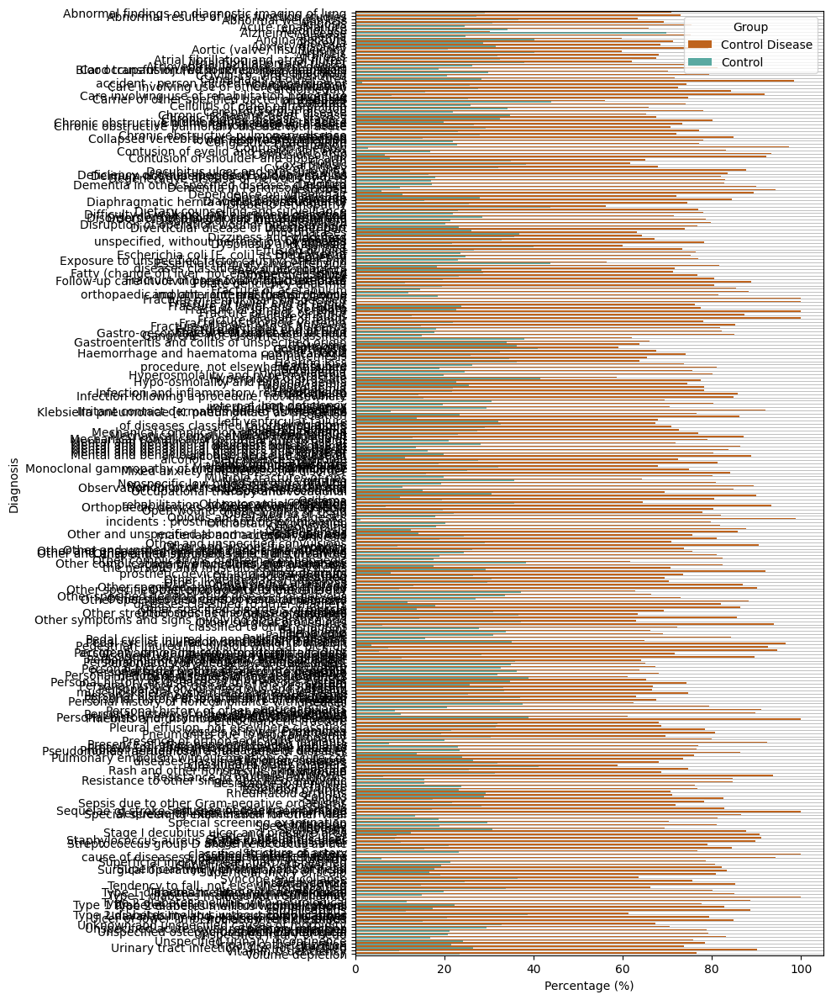

In [175]:
import matplotlib.pyplot as plt
import seaborn as sns
import textwrap
import pandas as pd

# Define color palette
group_palette_1 = {
    "Control": "#4DB6AC",  # Muted teal for Control
    "Control Disease": "#D95F02"  # Muted orange-red for Dementia
}

def wrap_labels(labels, width=50):
    return [textwrap.fill(label, width) for label in labels]

# Order diagnoses
diagnosis_order = significant_conditions_table["diagnosis"].tolist()

# Melt data for plotting
df_plot = significant_conditions_table[['diagnosis', 'dem_percentage', 'hc_percentage']].melt(
    id_vars='diagnosis', 
    var_name='Group', 
    value_name='Percentage'
)
# df_plot['diagnosis'] = pd.Categorical(df_plot['diagnosis'], categories=diagnosis_order, ordered=True)
df_plot['Group'] = df_plot['Group'].replace({
    'dem_percentage': 'Control Disease',
    'hc_percentage': 'Control'
})

# Create figure
fig, ax = plt.subplots(figsize=(10, 12))

# Create barplot
sns.barplot(data=df_plot, x='Percentage', y='diagnosis', hue='Group', palette=group_palette_1, errorbar=None, dodge=True, ax=ax)

# Format labels
ax.set_xlabel('Percentage (%)')
ax.set_ylabel('Diagnosis')
ax.set_yticklabels(wrap_labels(diagnosis_order, width=50), fontsize=10)
ax.axvline(x=0, color='grey', linestyle='--')
ax.grid(axis='y', linestyle='-', linewidth=0.5, color='grey', alpha=0.7)

# Adjust layout and show plot
plt.tight_layout()
plt.show()


In [232]:
top_20_for_graph = significant_conditions_table.loc[significant_conditions_table['diagnosis'].isin(top_20_sig_adjust_pval['diagnosis'])]

/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/1682172910.py:22: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



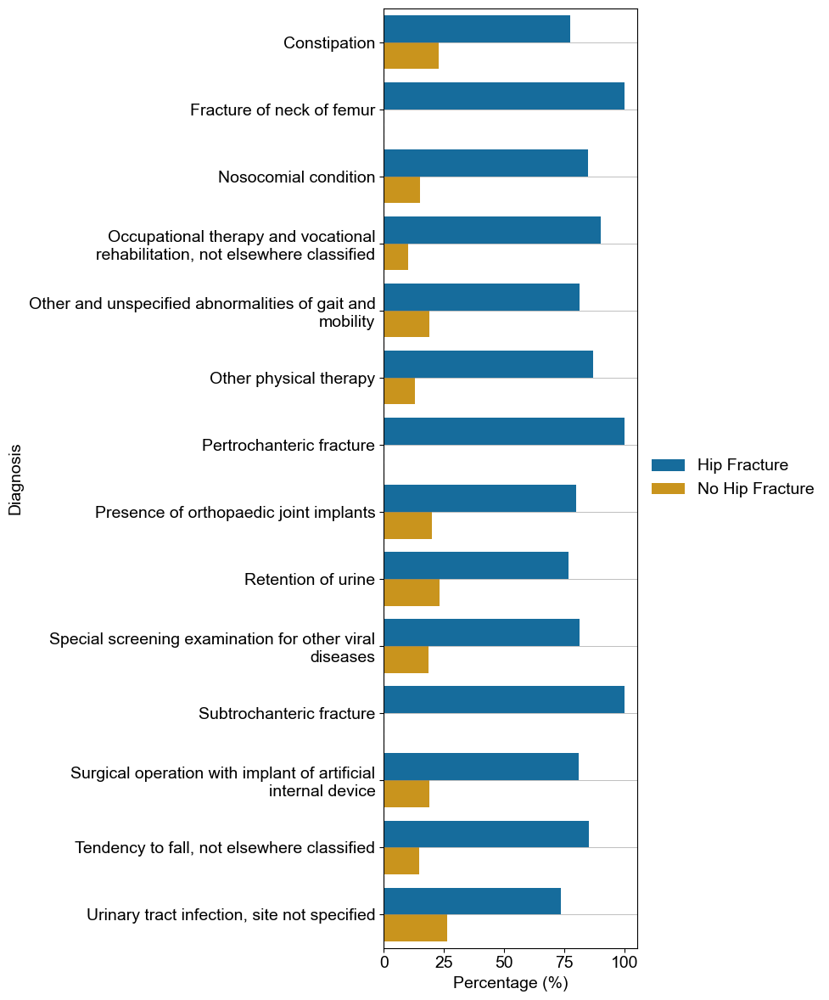

In [297]:
group_palette_1 = {
    "No Hip Fracture": "#E69F00", 
    "Hip Fracture": "#0072B2"
}

diagnosis_order = top_20_for_graph["diagnosis"].tolist()
df_plot = top_20_for_graph[['diagnosis', 'dem_percentage', 'hc_percentage']].melt(
    id_vars='diagnosis', 
    var_name='Group', 
    value_name='Percentage'
)

df_plot['Group'] = df_plot['Group'].replace({
    'dem_percentage': 'Hip Fracture',
    'hc_percentage': 'No Hip Fracture'
})

fig, ax = plt.subplots(figsize=(10, 12))
sns.barplot(data=df_plot, x='Percentage', y='diagnosis', hue='Group', palette=group_palette_1, errorbar=None, dodge=True, ax=ax)
ax.set_xlabel('Percentage (%)')
ax.set_ylabel('Diagnosis', fontsize=14)
ax.set_yticklabels(wrap_labels(diagnosis_order, width=50), fontsize=14)
ax.axvline(x=0, color='grey', linestyle='--')
ax.grid(axis='y', linestyle='-', linewidth=0.5, color='grey', alpha=0.7)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)

plt.tight_layout()
plt.show()

In [244]:
diagnosis_list = [
    "Acute renal failure",
    "Care involving use of rehabilitation procedure",
    "Cerebrovascular disease",
    "Decubitus ulcer and pressure area",
    "Degenerative disease of nervous system",
    "Delirium",
    "Depressive episode",
    "Disorder of urinary system",
    "Functional intestinal disorder",
    "Other and unspecified abnormalities of gait and mobility",
    "Other and unspecified symptoms and signs involving cognitive functions and awareness",
    "Other and unspecified symptoms and signs involving the nervous and musculoskeletal systems",
    "Other disorders of electrolyte and fluid balance, not elsewhere classified",
    "Personal history of diseases of the circulatory system",
    "Pneumonia",
    "Senility",
    "Unspecified fall",
    "Unspecified problem related to medical facility",
    "Unspecified urinary incontinence",
    "Volume depletion"
]

#This is the top 20 signfiicant conditions found in the dementia cohort. Want to see what is the prevalence for the Hip Fractures cohort compared to their controls 

dementia_cohort_top20_conditions_in_hipfracture_cohort = significant_conditions_table.loc[significant_conditions_table['diagnosis'].isin(diagnosis_list)]

/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/157867740.py:23: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



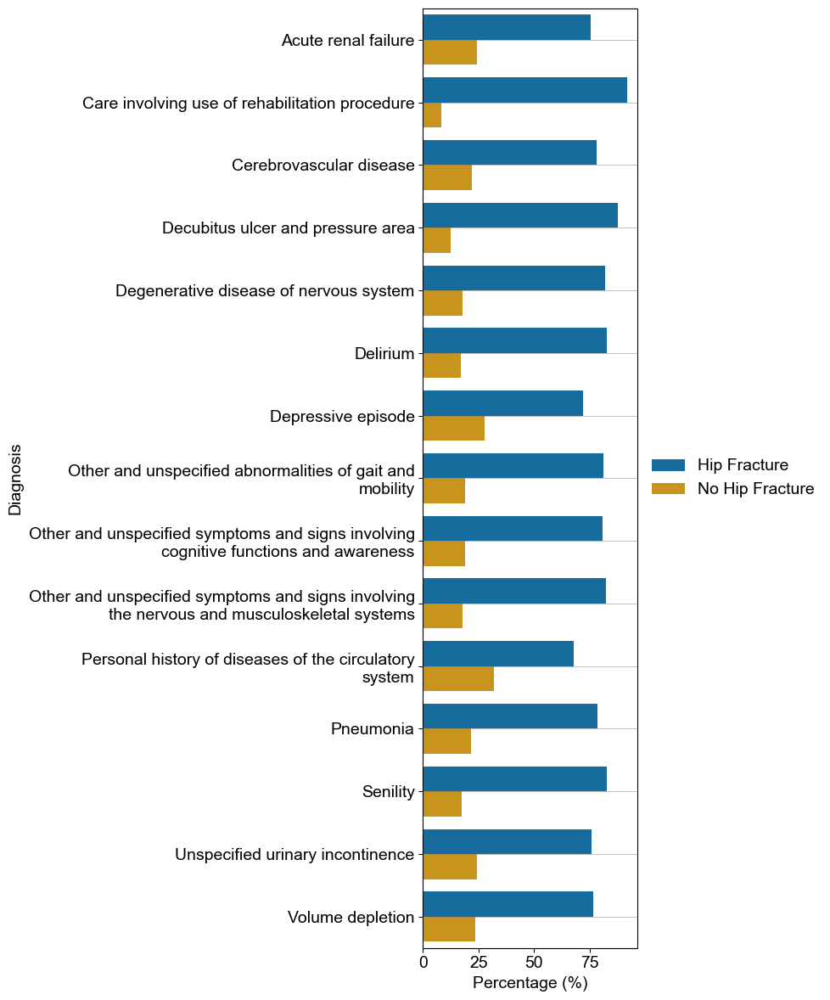

In [298]:
group_palette_1 = {
    "No Hip Fracture": "#E69F00", 
    "Hip Fracture": "#0072B2"
}

diagnosis_order = dementia_cohort_top20_conditions_in_hipfracture_cohort["diagnosis"].tolist()
df_plot = dementia_cohort_top20_conditions_in_hipfracture_cohort[['diagnosis', 'dem_percentage', 'hc_percentage']].melt(
    id_vars='diagnosis', 
    var_name='Group', 
    value_name='Percentage'
)

df_plot['Group'] = df_plot['Group'].replace({
    'dem_percentage': 'Hip Fracture',
    'hc_percentage': 'No Hip Fracture'
})

fig, ax = plt.subplots(figsize=(10, 12))
sns.barplot(data=df_plot, x='Percentage', y='diagnosis', hue='Group', palette=group_palette_1, errorbar=None, dodge=True, ax=ax)
ax.set_xlabel('Percentage (%)')
ax.set_ylabel('Diagnosis')
ax.set_yticklabels(wrap_labels(diagnosis_order, width=50), fontsize=14)
ax.axvline(x=0, color='grey', linestyle='--')
ax.grid(axis='y', linestyle='-', linewidth=0.5, color='grey', alpha=0.7)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False, fontsize=14)

plt.tight_layout()
plt.show()

<h2> ICD-10 Colour Mappings </h2>

In [176]:
df_mapping = icd_10[['Code', 'Title']]
color_map = {
    'A': '#4D79A7',  # Blue
    'B': '#A0CBE8',  # Light Blue
    'C': '#FF7F0E',  # Orange
    'D': '#2CA02C',  # Green
    'E': '#FFBB78',  # Light Orange
    'F': '#1F77B4',  # Dark Blue
    'G': '#98DF8A',  # Light Green
    'H': '#FF9896',  # Light Red
    'I': '#D62728',  # Red
    'J': '#9467BD',  # Purple
    'K': '#8C564B',  # Brown
    'L': '#E377C2',  # Pink
    'M': '#F7B6D2',  # Light Pink
    'N': '#C5B0D5',  # Light Purple
    'O': '#C49C94',  # Light Brown
    'P': '#C7C7C7',  # Light Gray
    'Q': '#17BECF',  # Cyan
    'R': '#9EDAE5',  # Light Cyan
    'S': '#7F7F7F',  # Gray
    'T': '#BCBD22',  # Yellow
    'U': '#393B79',  # Dark Blue
    'V': '#6B6ECF',  # Dark Purple
    'W': '#9C9EDE',  # Light Purple
    'X': '#D6616B',  # Dark Pink
    'Y': '#AD494A',  # Dark Red
    'Z': '#8C6D31'   # Dark Yellow
}

In [177]:
def generate_color(icd10):
    code_letter = icd10[0]  # Extract the first letter of the ICD10 code
    return color_map.get(code_letter, 'gray')  # Return the color for the code letter, default to gray

# Create a new column in df_mapping to store the colors
df_mapping['Colour'] = df_mapping['Code'].apply(generate_color)
import networkx as nx
# Create a dictionary to map ICD10 codes to colors
icd10_color_map = dict(zip(df_mapping['Title'], df_mapping['Colour']))

In [178]:
def generate_color(icd10):
    code_letter = icd10[0]  # Extract the first letter of the ICD10 code
    return color_map.get(code_letter, 'gray')  # Return the color for the code letter, default to gray
df_mapping['Colour'] = df_mapping['Code'].apply(generate_color)
import networkx as nx
icd10_color_map = dict(zip(df_mapping['Title'], df_mapping['Colour']))

In [179]:
ind_diagnosis_per_eid = sig_onlydem_melted_diag_withall_demo_time.sort_values(by = ['eid', 'date'], ascending = True)
ind_diagnosis_per_eid['Timeframe'].value_counts()

Timeframe
0-10 years after                42719
0-8 years after                 41563
0-6 years after                 39768
0-4 years after                 36448
20 years before to diagnosis    33231
0-2 years after                 30631
20-2 years before               22164
20-5 years before               13525
20-7 years before                9836
20-10 years before               5794
20-15 years before               1762
20+ years before                  728
Name: count, dtype: int64

<h1>Network Analysis </h1>

<h2> Individual Diagnoses - Sequences </h2>

In [180]:
sig_onlydem_melted_diag_withall_demo_time = sig_onlydem_melted_diag_withall_demo_time.sort_values(by = ['eid', 'date'], ascending=True)
sig_onlyhc_melted_diag_withall_demo_time = sig_onlyhc_melted_diag_withall_demo_time.sort_values(by = ['eid', 'date'], ascending=True)

In [181]:
before_dementia = sig_onlydem_melted_diag_withall_demo_time[sig_onlydem_melted_diag_withall_demo_time['Diagnosis Status'] == 'Before Control Disease']
after_dementia = sig_onlydem_melted_diag_withall_demo_time[sig_onlydem_melted_diag_withall_demo_time['Diagnosis Status'] == 'After Control Disease']
before_dementia_hc = sig_onlyhc_melted_diag_withall_demo_time[sig_onlyhc_melted_diag_withall_demo_time['Diagnosis Status'] == 'Before Control Disease']
after_dementia_hc = sig_onlyhc_melted_diag_withall_demo_time[sig_onlyhc_melted_diag_withall_demo_time['Diagnosis Status'] == 'After Control Disease']

In [182]:
# Convert data into transactional format
def create_transactions(data):
    transactions = []
    for eid, group in data.groupby('eid'):
        transactions.append(list(group['diagnosis']))
    return transactions

# Convert data into transactional format for 'before dementia' and 'after dementia' groups
transactions_before_dem_ind = create_transactions(before_dementia)
transactions_after_dem_ind = create_transactions(after_dementia)

transactions_before_hc_ind = create_transactions(before_dementia_hc)
transactions_after_hc_ind = create_transactions(after_dementia_hc)

<h2> By Timeframe - Individual Diagnosis </h2>

In [183]:
# Function to create transactions by timeframe
def create_transactions_by_timeframe(data):
    transactions_by_timeframe = {}
    for timeframe, timeframe_group in data.groupby('Timeframe'):
        transactions = []
        for eid, group in timeframe_group.groupby('eid'):
            transactions.append(list(group['diagnosis']))
        transactions_by_timeframe[timeframe] = transactions
    return transactions_by_timeframe

# Create transactions by timeframe for the entire dataset
transactions_by_timeframe_dem_ind = create_transactions_by_timeframe(sig_onlydem_melted_diag_withall_demo_time)
transactions_by_timeframe_hc_ind = create_transactions_by_timeframe(sig_onlyhc_melted_diag_withall_demo_time)

<h1>  Sequence and Transactions </h1>

In [184]:
import pyfpgrowth
import pandas as pd

# Function to create transactions from the diagnosis column
def create_transactions(data):
    transactions = []
    for eid, group in data.groupby('eid'):
        transactions.append(list(group['diagnosis']))
    return transactions

# Function to calculate a custom threshold based on total records (conditions) across all transactions
def custom_threshold_cal(transactions, percentage=0.005):
    total_records = sum(len(transaction) for transaction in transactions)  # Total number of conditions in all transactions
    
    custom_threshold = int(total_records * percentage)  # Fixed percentage of total records
    return custom_threshold

# Function to process patterns in the data
def process_patterns(df, min_sup):
    transactions = create_transactions(df)
    patterns = pyfpgrowth.find_frequent_patterns(transactions, min_sup)
    print("Frequent patterns:", patterns)  # Inspect the raw patterns dictionary
    
    patterns_df = pd.DataFrame(list(patterns.items()), columns=['Pattern', 'Support'])
    if 'Support' not in patterns_df.columns:
        print("Error: 'Support' column missing in patterns_df")
        return pd.DataFrame()  # Return empty DataFrame if missing
    top_patterns = pd.concat(
        [patterns_df[patterns_df['Pattern'].apply(lambda x: len(x) == i)].nlargest(1000, 'Support') for i in range(1, 11)]
    )
    return top_patterns

# Function to process the data based on assigned timeframes
def process_dem_data_by_diagnosis_and_timeframe(df):
    top_patterns_dict = {}
    for diagnosis, diag_group in df.groupby('Group'):
        print(f"Processing Group: {diagnosis}")
        top_patterns_dict[diagnosis] = {}
        for timeframe, count in diag_group['Timeframe'].value_counts().items():
            timeframe_df = diag_group[diag_group['Timeframe'] == timeframe]
            print(f"  Processing {diagnosis} - {timeframe} with {len(timeframe_df)} records")
            if not timeframe_df.empty:
                transactions = create_transactions(timeframe_df)
                # Calculate the custom threshold
                min_sup = custom_threshold_cal(transactions, percentage=0.005)  # Pass the actual transactions
                print(f"  Calculated min_sup={min_sup} for {diagnosis} - {timeframe}")
                top_patterns_dict[diagnosis][timeframe] = process_patterns(timeframe_df, min_sup)
                print(f"  Completed processing {diagnosis} - {timeframe}")
            else:
                print(f"  No data to process for {diagnosis} - {timeframe}")
    return top_patterns_dict

# Process the dementia data and get patterns
top_patterns_dict_dem_sig = process_dem_data_by_diagnosis_and_timeframe(sig_onlydem_melted_diag_withall_demo_time)

# Output the results
def output_patterns(top_patterns_dict, group_label="Dementia"):
    for diagnosis, timeframes in top_patterns_dict.items():
        print(f"Patterns for {group_label} - {diagnosis}:")
        for timeframe, top_patterns in timeframes.items():
            print(f"  Timeframe: {timeframe}\n", top_patterns)

# Output the patterns for Dementia group
output_patterns(top_patterns_dict_dem_sig)

Processing Group: CtrlDisease
  Processing CtrlDisease - 0-10 years after with 42719 records
  Calculated min_sup=213 for CtrlDisease - 0-10 years after
Frequent patterns: {('Iron deficiency anaemia, unspecified',): 216, ('Hypokalaemia',): 218, ('Unspecified acute lower respiratory infection',): 219, ('Personal history of other specified conditions',): 225, ('Pleural effusion, not elsewhere classified',): 225, ('Gonarthrosis, unspecified',): 231, ('Senility',): 232, ('Personal history of diseases of the digestive system',): 234, ('Personal history of diseases of the nervous system and sense organs',): 234, ('Personal history of allergy to other drugs, medicaments and biological substances',): 235, ('Orthostatic hypotension',): 235, ('Coxarthrosis, unspecified',): 235, ('Delirium, unspecified',): 236, ('Chronic ischaemic heart disease, unspecified',): 236, ('Palliative care',): 237, ('Volume depletion',): 243, ('Arthritis, unspecified',): 246, ('Other specified disorders of bone density

In [185]:
top_patterns_dict_hc_sig = process_dem_data_by_diagnosis_and_timeframe(sig_onlyhc_melted_diag_withall_demo_time)

# Output the results
def output_patterns(top_patterns_dict, group_label="Control"):
    for diagnosis, timeframes in top_patterns_dict.items():
        print(f"Patterns for {group_label} - {diagnosis}:")
        for timeframe, top_patterns in timeframes.items():
            print(f"  Timeframe: {timeframe}\n", top_patterns)

# Run the process
output_patterns(top_patterns_dict_hc_sig)

Processing Group: Control
  Processing Control - 20 years before to diagnosis with 20103 records
  Calculated min_sup=100 for Control - 20 years before to diagnosis
Frequent patterns: {('Personal history of diseases of the genitourinary system',): 100, ('Chronic kidney disease, stage 3',): 101, ('Dysphagia',): 101, ('Tendency to fall, not elsewhere classified',): 105, ('Personal history of allergy to analgesic agent',): 107, ('Anxiety disorder, unspecified',): 112, ('Alcohol use',): 114, ('Other spondylosis',): 114, ('Other specified soft tissue disorders',): 116, ('Pain in limb',): 117, ('Rheumatoid arthritis, unspecified',): 118, ('Gastroenteritis and colitis of unspecified origin',): 119, ('Abnormal weight loss',): 119, ('Surgical operation with implant of artificial internal device',): 120, ('Dyspnoea',): 121, ('Iron deficiency anaemia, unspecified',): 122, ('Personal history of allergy to other drugs, medicaments and biological substances',): 124, ('Pleural effusion, not elsewhere

<h1>  Models to determine condition/timeframe predictibility </h1>

In [186]:
combined_sig_conditions_withalldemo_frame = pd.concat([
    sig_onlydem_melted_diag_withall_demo_time,
    sig_onlyhc_melted_diag_withall_demo_time], axis = 0)

In [187]:
table_for_log_reg = combined_sig_conditions_withalldemo_frame[['eid', 'diagnosis', 'Sex', 'Age at First Diagnosis', 'Group', 'Timeframe']].reset_index(drop=True)
table_for_log_reg['Group'] = table_for_log_reg['Group'].map({'Control': 0, 'CtrlDisease': 1})

In [188]:
co_20_plus_years_before = table_for_log_reg[table_for_log_reg['Timeframe'] == '20+ years before'].copy()
co_20_15_years_before = table_for_log_reg[table_for_log_reg['Timeframe'] == '20-15 years before'].copy()
co_20_10_years_before = table_for_log_reg[table_for_log_reg['Timeframe'] == '20-10 years before'].copy()
co_20_7_years_before = table_for_log_reg[table_for_log_reg['Timeframe'] == '20-7 years before'].copy()
co_20_5_years_before = table_for_log_reg[table_for_log_reg['Timeframe'] == '20-5 years before'].copy()
co_20_2_years_before = table_for_log_reg[table_for_log_reg['Timeframe'] == '20-2 years before'].copy()
co_20_diag_years_before = table_for_log_reg[table_for_log_reg['Timeframe'] == '20 years before to diagnosis'].copy()

In [189]:
def transform_conditions(df_list):
    transformed_dfs = []
    
    for df in df_list:
        if 'eid' in df.columns and 'diagnosis' in df.columns:
            df_transformed = pd.get_dummies(df[['eid', 'diagnosis']], columns=['diagnosis']).astype(int)
            df_transformed = df_transformed.groupby('eid').sum().reset_index()
            transformed_dfs.append(df_transformed)
    return transformed_dfs

ad_timeframes_list_dfs = [co_20_plus_years_before, co_20_15_years_before, co_20_10_years_before, co_20_7_years_before, co_20_5_years_before, co_20_2_years_before, co_20_diag_years_before]  # List of dataframes
transformed_dfs_ad = transform_conditions(ad_timeframes_list_dfs)

In [190]:
co_20_plus_years_before_transformed = transformed_dfs_ad[0]
co_20_15_years_before_transformed = transformed_dfs_ad[1]
co_20_10_years_before_transformed = transformed_dfs_ad[2]
co_20_7_years_before_transformed = transformed_dfs_ad[3]
co_20_5_years_before_transformed = transformed_dfs_ad[4]
co_20_2_years_before_transformed = transformed_dfs_ad[5]
co_20_diag_years_before_transformed = transformed_dfs_ad[6]

In [191]:
sex_age_formodel = table_for_log_reg[['eid', 'Sex', 'Age at First Diagnosis', 'Group']].drop_duplicates().reset_index(drop=True)

co_20_plus_years_before_transformed_formodel = co_20_plus_years_before_transformed.merge(sex_age_formodel, on = ['eid'], how = 'left')
co_20_15_years_before_transformed_formodel = co_20_15_years_before_transformed.merge(sex_age_formodel, on = ['eid'], how = 'left')
co_20_10_years_before_transformed_formodel = co_20_10_years_before_transformed.merge(sex_age_formodel, on = ['eid'], how = 'left')
co_20_7_years_before_transformed_formodel = co_20_7_years_before_transformed.merge(sex_age_formodel, on = ['eid'], how = 'left')
co_20_5_years_before_transformed_formodel = co_20_5_years_before_transformed.merge(sex_age_formodel, on = ['eid'], how = 'left')
co_20_2_years_before_transformed_formodel = co_20_2_years_before_transformed.merge(sex_age_formodel, on = ['eid'], how = 'left')
co_20_diag_years_before_transformed_formodel = co_20_diag_years_before_transformed.merge(sex_age_formodel, on = ['eid'], how = 'left')

In [192]:
time_dfs = [co_20_plus_years_before_transformed_formodel, co_20_15_years_before_transformed_formodel, co_20_10_years_before_transformed_formodel, co_20_7_years_before_transformed_formodel, co_20_5_years_before_transformed_formodel, co_20_2_years_before_transformed_formodel, co_20_diag_years_before_transformed_formodel]

In [193]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, f1_score, roc_auc_score

def preprocess_data(df):
    df = df.copy()
    X = df.drop(columns=['Group'])
    y = df['Group']
    X.columns = X.columns.astype(str).str.replace('[\[\]<>]', '', regex=True)
    return X, y

def train_and_evaluate_models(X, y, model_name=""):
    results = {}
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    logreg_l1 = LogisticRegression(penalty='l1', solver='liblinear')
    logreg_l2 = LogisticRegression(penalty='l2', solver='lbfgs', max_iter=1000)
    rf = RandomForestClassifier(random_state=42)
    xgb = XGBClassifier(
        n_estimators=100,
        max_depth=5,
        learning_rate=0.1,
        reg_alpha=0.01,  # L1 regularization
        reg_lambda=1.0   # L2 regularization
    )
    models = {'Logistic Regression (L1)': logreg_l1, 
                'Logistic Regression (L2)': logreg_l2, 
                'Random Forest': rf, 
                'XGBoost': xgb}
    for name, model in models.items():
        print(f"Training {name} on {model_name}...")
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_pred_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        sensitivity = tp / (tp + fn)
        specificity = tn / (tn + fp)
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        auc = roc_auc_score(y_test, y_pred_proba) if y_pred_proba is not None else None
        results[name] = {
            'Sensitivity': sensitivity, 
            'Specificity': specificity,
            'Accuracy': accuracy,
            'Precision': precision,
            'F1-Score': f1,
            'AUC': auc
        }
        print(f"{name} Results on {model_name}:")
        print(f"  Sensitivity: {sensitivity:.4f}")
        print(f"  Specificity: {specificity:.4f}")
        print(f"  Accuracy: {accuracy:.4f}")
        print(f"  Precision: {precision:.4f}")
        print(f"  F1-Score: {f1:.4f}")
        if auc is not None:
            print(f"  AUC: {auc:.4f}")
        print("-" * 40)
    return results

all_results = {}
for i, df in enumerate(time_dfs):
    X, y = preprocess_data(df)
    model_name = f"Timeframe {i+1}"
    all_results[model_name] = train_and_evaluate_models(X, y, model_name=model_name)

Training Logistic Regression (L1) on Timeframe 1...
Logistic Regression (L1) Results on Timeframe 1:
  Sensitivity: 0.7600
  Specificity: 0.2105
  Accuracy: 0.5227
  Precision: 0.5588
  F1-Score: 0.6441
  AUC: 0.5366
----------------------------------------
Training Logistic Regression (L2) on Timeframe 1...
Logistic Regression (L2) Results on Timeframe 1:
  Sensitivity: 1.0000
  Specificity: 0.0000
  Accuracy: 0.5682
  Precision: 0.5682
  F1-Score: 0.7246
  AUC: 0.5046
----------------------------------------
Training Random Forest on Timeframe 1...
Random Forest Results on Timeframe 1:
  Sensitivity: 0.5467
  Specificity: 0.4211
  Accuracy: 0.4924
  Precision: 0.5541
  F1-Score: 0.5503
  AUC: 0.5213
----------------------------------------
Training XGBoost on Timeframe 1...
XGBoost Results on Timeframe 1:
  Sensitivity: 0.6533
  Specificity: 0.3333
  Accuracy: 0.5152
  Precision: 0.5632
  F1-Score: 0.6049
  AUC: 0.5473
----------------------------------------
Training Logistic Regres

In [194]:
from collections import Counter
best_models = {}
for timeframe, results in all_results.items():
    best_model = max(results, key=lambda model: results[model]['AUC'] if results[model]['AUC'] is not None else 0)
    best_models[timeframe] = best_model
model_counts = Counter(best_models.values())
print("Best Model Per Timeframe:")
for timeframe, model in best_models.items():
    print(f"{timeframe}: {model}")
print("\nModel Selection Summary:")
for model, count in model_counts.items():
    print(f"{model}: Best in {count} timeframes")

best_overall_model_vd = max(model_counts, key=model_counts.get)
print(f"\nRecommended Model: {best_overall_model_vd}")

Best Model Per Timeframe:
Timeframe 1: XGBoost
Timeframe 2: XGBoost
Timeframe 3: XGBoost
Timeframe 4: XGBoost
Timeframe 5: Random Forest
Timeframe 6: Random Forest
Timeframe 7: XGBoost

Model Selection Summary:
XGBoost: Best in 5 timeframes
Random Forest: Best in 2 timeframes

Recommended Model: XGBoost


In [195]:
timeframe_mapping = {
    "Timeframe 1": "20+ years before",
    "Timeframe 2": "20-15 years before",
    "Timeframe 3": "20-10 years before",
    "Timeframe 4": "20-7 years before",
    "Timeframe 5": "20-5 years before",
    "Timeframe 6": "20-2 years before",
    "Timeframe 7": "2 years before to diagnosis"
}
flattened_results_ = {}

for model, timeframes in all_results.items():
    for timeframe, metrics in timeframes.items():
        flattened_results_[(model, timeframe)] = metrics

results_summary= pd.DataFrame(flattened_results_).T

pd.set_option('display.max_columns', None)  # Show all columns
pd.set_option('display.expand_frame_repr', False)  # Prevent line wrapping

<h2> Running Logistic Regression Model - with L1 regularisation </h2>

In [196]:
co_20_plus_years_before_transformed_formodel.columns

Index(['eid', 'diagnosis_Abnormal results of liver function studies',
       'diagnosis_Abnormal weight loss',
       'diagnosis_Acute renal failure, unspecified', 'diagnosis_Alcohol use',
       'diagnosis_Anaemia, unspecified',
       'diagnosis_Angina pectoris, unspecified', 'diagnosis_Anorexia',
       'diagnosis_Anxiety disorder, unspecified',
       'diagnosis_Aortic (valve) insufficiency',
       ...
       'diagnosis_Ulcer of lower limb, not elsewhere classified',
       'diagnosis_Unknown and unspecified causes of morbidity',
       'diagnosis_Unspecified acute lower respiratory infection',
       'diagnosis_Unspecified injury of head',
       'diagnosis_Unspecified urinary incontinence',
       'diagnosis_Urinary tract infection, site not specified',
       'diagnosis_Volume depletion', 'Sex', 'Age at First Diagnosis', 'Group'],
      dtype='object', length=175)

In [197]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from scipy.stats import norm

def preprocess_data(df):
    df = df.copy()
    if df["Sex"].dtype == 'object' or df["Sex"].dtype.name == 'category':
        df["Sex"] = df["Sex"].astype('category').cat.codes
    df['Age at First Diagnosis^2'] = df['Age at First Diagnosis'] ** 2
    df['Age at First Diagnosis_Sex'] = df['Age at First Diagnosis'] * df['Sex']
    X = df.drop(columns=['Group'])  
    y = df['Group']  
    X.columns = X.columns.astype(str).str.replace('[\[\]<>]', '', regex=True)
    X = X.loc[:, X.nunique() > 1]
    corr_matrix = X.corr().abs()
    upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
    X.drop(columns=to_drop, inplace=True)
    print(f"Class distribution:\n{y.value_counts()}")
    print(f"Dropping {len(to_drop)} highly correlated features.")
    return X, y

def compute_odds_ratios(X_train, y_train):
    """Train L1 Logistic Regression and compute ORs, CIs, and p-values."""
    model = LogisticRegression(penalty='l1', solver='liblinear', max_iter=1000)
    model.fit(X_train, y_train)
    coef = model.coef_.flatten()
    odds_ratios = np.exp(coef)
    num_bootstraps = 1000
    coef_bootstraps = np.zeros((num_bootstraps, len(coef)))
    for i in range(num_bootstraps):
        sample_idx = np.random.choice(len(X_train), len(X_train), replace=True)
        X_sample, y_sample = X_train.iloc[sample_idx], y_train.iloc[sample_idx]
        # Avoid errors if only one class exists in bootstrap sample
        if len(np.unique(y_sample)) < 2:
            continue  
        model.fit(X_sample, y_sample)
        coef_bootstraps[i, :] = model.coef_
    se = coef_bootstraps.std(axis=0)
    ci_lower = np.exp(coef - 1.96 * se)
    ci_upper = np.exp(coef + 1.96 * se)
    z_scores = coef / se
    p_values = 2 * (1 - norm.cdf(np.abs(z_scores)))
    results_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Odds Ratio': odds_ratios,
        'CI Lower': ci_lower,
        'CI Upper': ci_upper,
        'P-Value': p_values
    })
    return results_df

def train_logistic_regression(X, y, model_name=""):
    """Train Logistic Regression and extract ORs, CIs, and p-values."""
    if len(np.unique(y)) < 2:
        print(f"Skipping {model_name}: Only one class present in 'Group'.")
        return None
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y if len(np.unique(y)) > 1 else None
    )
    results_df = compute_odds_ratios(X_train, y_train)
    return results_df

final_odds_ratios = {}
for i, df in enumerate(time_dfs):
    X, y = preprocess_data(df)
    model_name = f"Timeframe {i+1}"
    print(f"Running L1 Logistic Regression for {model_name}...")
    results = train_logistic_regression(X, y, model_name=model_name)
    if results is not None:  
        final_odds_ratios[model_name] = results
for timeframe, df in final_odds_ratios.items():
    print(f"\nResults for {timeframe}:")
    print(df)

Class distribution:
Group
1    376
0    284
Name: count, dtype: int64
Dropping 3 highly correlated features.
Running L1 Logistic Regression for Timeframe 1...


/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/4221894556.py:44: RuntimeWarning:

invalid value encountered in divide



Class distribution:
Group
1    782
0    692
Name: count, dtype: int64
Dropping 2 highly correlated features.
Running L1 Logistic Regression for Timeframe 2...


/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank

Class distribution:
Group
1    1731
0    1552
Name: count, dtype: int64
Dropping 2 highly correlated features.
Running L1 Logistic Regression for Timeframe 3...


/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/4221894556.py:44: RuntimeWarning:

invalid value encountered in divide



Class distribution:
Group
1    2251
0    2100
Name: count, dtype: int64
Dropping 2 highly correlated features.
Running L1 Logistic Regression for Timeframe 4...


/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank

Class distribution:
Group
1    2553
0    2409
Name: count, dtype: int64
Dropping 2 highly correlated features.
Running L1 Logistic Regression for Timeframe 5...


/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank

Class distribution:
Group
1    2997
0    2855
Name: count, dtype: int64
Dropping 2 highly correlated features.
Running L1 Logistic Regression for Timeframe 6...


/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank

Class distribution:
Group
1    3279
0    3094
Name: count, dtype: int64
Dropping 2 highly correlated features.
Running L1 Logistic Regression for Timeframe 7...


/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank/biobank/lib/python3.10/site-packages/sklearn/svm/_base.py:1243: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/Users/cw3222/Documents/Imperial/BioBank


Results for Timeframe 1:
                                               Feature  Odds Ratio  CI Lower  CI Upper   P-Value
0                                                  eid     1.00000  1.000000  1.000000  0.287862
1    diagnosis_Abnormal results of liver function s...     1.00000  0.406082  2.462558  1.000000
2                       diagnosis_Abnormal weight loss     1.00000  0.552571  1.809723  1.000000
3           diagnosis_Acute renal failure, unspecified     1.00000  0.613975  1.628731  1.000000
4                                diagnosis_Alcohol use     1.00000  0.775784  1.289019  1.000000
..                                                 ...         ...       ...       ...       ...
168         diagnosis_Unspecified urinary incontinence     1.00000  0.476734  2.097608  1.000000
169  diagnosis_Urinary tract infection, site not sp...     0.88475  0.410114  1.908697  0.754927
170                         diagnosis_Volume depletion     1.00000  0.674470  1.482645  1.000000
171 

In [198]:
final_results_list = []
for i, (timeframe, df) in enumerate(final_odds_ratios.items()):
    # Get the original dataset for this timeframe
    original_df = time_dfs[i]  # Assuming order matches
    group_label = original_df["Group"].mode()[0]  # Most frequent value
    df["Timeframe"] = timeframe
    df["Group"] = "Cntrl Disease" if group_label == 1 else "Control"  # Assuming Group = 1 means disease and 0 means control
    df.rename(columns={"Feature": "Condition"}, inplace=True)  # Rename Feature to Condition
    final_results_list.append(df)
timeframe_mapping = {
    "Timeframe 1": "20+ years before",
    "Timeframe 2": "20-15 years before",
    "Timeframe 3": "20-10 years before",
    "Timeframe 4": "20-7 years before",
    "Timeframe 5": "20-5 years before",
    "Timeframe 6": "20-2 years before",
    "Timeframe 7": "2 years before to diagnosis"
}
combined_sig_conditions_withalldemo_frame_results_OR = pd.concat(final_results_list, ignore_index=True)
combined_sig_conditions_withalldemo_frame_results_OR["Timeframe"] = combined_sig_conditions_withalldemo_frame_results_OR["Timeframe"].map(timeframe_mapping)
# Remove 'Condition_' prefix from all condition names
combined_sig_conditions_withalldemo_frame_results_OR["Condition"] = (
    combined_sig_conditions_withalldemo_frame_results_OR["Condition"].str.replace(r"^Condition_", "", regex=True)
)
combined_sig_conditions_withalldemo_frame_results_OR = combined_sig_conditions_withalldemo_frame_results_OR[["Timeframe", "Group", "Condition", "Odds Ratio", "CI Lower", "CI Upper", "P-Value"]].reset_index(drop=True)
combined_sig_conditions_withalldemo_frame_results_OR.sort_values(by=['Timeframe', 'Group', "P-Value"], ascending=True).dropna(inplace = True)

In [199]:
combined_sig_conditions_withalldemo_frame_results_OR.rename(columns = {'Dementia Type':'Group'}, inplace = True)
combined_sig_conditions_withalldemo_frame_results_OR

,Timeframe,Group,Condition,Odds Ratio,CI Lower,CI Upper,P-Value
0,20+ years before,Cntrl Disease,eid,1.000000,1.000000,1.000000,0.287862
1,20+ years before,Cntrl Disease,diagnosis_Abnormal results of liver function s...,1.000000,0.406082,2.462558,1.000000
2,20+ years before,Cntrl Disease,diagnosis_Abnormal weight loss,1.000000,0.552571,1.809723,1.000000
3,20+ years before,Cntrl Disease,"diagnosis_Acute renal failure, unspecified",1.000000,0.613975,1.628731,1.000000
4,20+ years before,Cntrl Disease,diagnosis_Alcohol use,1.000000,0.775784,1.289019,1.000000
...,...,...,...,...,...,...,...
1740,2 years before to diagnosis,Cntrl Disease,"diagnosis_Urinary tract infection, site not sp...",1.131419,0.875112,1.462793,0.346135
1741,2 years before to diagnosis,Cntrl Disease,"diagnosis_Vitamin D deficiency, unspecified",0.644355,0.326484,1.271714,0.205137
1742,2 years before to diagnosis,Cntrl Disease,diagnosis_Volume depletion,0.835229,0.541680,1.287860,0.415105
1743,2 years before to diagnosis,Cntrl Disease,Sex,1.037006,0.914779,1.175565,0.570095


In [200]:
combined_sig_conditions_withalldemo_frame_results_OR_AD_sigpvalue = combined_sig_conditions_withalldemo_frame_results_OR[
    combined_sig_conditions_withalldemo_frame_results_OR["P-Value"] < 0.05
].sort_values(by=["Group", "Timeframe", "P-Value"], ascending=True)
combined_sig_conditions_withalldemo_frame_results_OR_AD_sigpvalue

,Timeframe,Group,Condition,Odds Ratio,CI Lower,CI Upper,P-Value
1648,2 years before to diagnosis,Cntrl Disease,diagnosis_Parkinson disease,3.250156,2.078447,5.082406,2.373544e-07
1647,2 years before to diagnosis,Cntrl Disease,diagnosis_Palliative care,0.228117,0.124521,0.417900,1.711072e-06
1686,2 years before to diagnosis,Cntrl Disease,diagnosis_Pure hypercholesterolaemia,0.743504,0.627014,0.881636,6.520587e-04
1616,2 years before to diagnosis,Cntrl Disease,"diagnosis_Osteoporosis, unspecified",1.400537,1.150374,1.705102,7.925272e-04
1549,2 years before to diagnosis,Cntrl Disease,diagnosis_Fracture of lower end of radius,1.774579,1.243810,2.531843,1.559958e-03
...,...,...,...,...,...,...,...
815,20-7 years before,Cntrl Disease,diagnosis_Parkinson disease,3.473667,1.504998,8.017528,3.523633e-03
681,20-7 years before,Cntrl Disease,"diagnosis_Coxarthrosis, unspecified",0.562243,0.344609,0.917322,2.113727e-02
720,20-7 years before,Cntrl Disease,diagnosis_Fracture of lower end of radius,1.781614,1.087339,2.919188,2.188447e-02
729,20-7 years before,Cntrl Disease,diagnosis_Gastroenteritis and colitis of unspe...,2.374052,1.071988,5.257638,3.305914e-02


<h1> Code to pull centrality </h1>

In [201]:
def compute_centrality_measures(G):
    # Compute various centrality measures
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G)
    closeness_centrality = nx.closeness_centrality(G)
    # Combine all centrality measures into a single dictionary
    centrality_data = {}
    for node in G.nodes():
        centrality_data[node] = {
            'degree': degree_centrality.get(node, 0),
            'betweenness': betweenness_centrality.get(node, 0),
            'closeness': closeness_centrality.get(node, 0)
        }
    return centrality_data
def extract_edge_support(G):
    # Extract edge weights (support values) from the graph
    edge_support = []
    for u, v, data in G.edges(data=True):
        weight = data.get('weight', 0)
        edge_support.append((u, v, weight))
    return edge_support
def extract_node_colors(G, icd10_color_map):
    # Get the color assigned to each node based on ICD-10 codes
    node_colors = {}
    for node in G.nodes():
        node_colors[node] = icd10_color_map.get(str(node), 'gray')  # Default to 'gray' if not in the map
    return node_colors

<h1> Plotting Networks </h1>


In [202]:
import os

def plot_network_graph_withmeasures_dem(data, title, min_support=0.01, icd10_color_map=None, save_path='/Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs'):
    G = nx.Graph()
    
    # Filter combinations with support >= min_support
    data = data[data['Support'] >= min_support]
    for pattern, support in data[['Pattern', 'Support']].values:
        for i in range(len(pattern)):
            for j in range(i + 1, len(pattern)):
                G.add_edge(pattern[i], pattern[j], weight=support)
    # Only plot and save if there are nodes in the graph
    if len(G.nodes()) > 0:
        # Adjust the layout and positioning to prevent labels from falling off
        pos = nx.spring_layout(G, k=10, seed=42)  # Seed ensures reproducibility of layout
        plt.figure(figsize=(12, 6))
        
        # Define global fixed scaling range for all edge widths
        min_width = 1
        max_width = 250
        global_min_support = 1000
        global_max_support = 100000
        edge_weights = [support for _, _, support in G.edges(data='weight')]
        if edge_weights:
            scaled_edge_weights = [
                min_width + (max_width - min_width) * (weight - global_min_support) / (global_max_support - global_min_support)
                for weight in edge_weights
            ]
            scaled_edge_weights = [max(min_width, min(width, max_width)) for width in scaled_edge_weights]
        else:
            scaled_edge_weights = []
        node_colors = [icd10_color_map.get(str(node), 'gray') for node in G.nodes()]
        
        # Ensure the labels stay within the plot by adjusting plot limits and margins
        ax = plt.gca()
        ax.margins(0.3)  # Add some padding around the plot to prevent clipping
        plt.subplots_adjust(left=0.1, right=1.5, top=1.2, bottom=0.1)  # Adjust margins
        nx.draw(G, pos, with_labels=False, node_size=800, node_color=node_colors, 
                font_size=9, font_weight="regular", edge_color="lightgray", width=scaled_edge_weights)
        labels = {node: str(node) for node in G.nodes()}
        nx.draw_networkx_labels(G, pos, labels=labels, font_size=9, font_weight='bold')
        plt.title(title, fontsize=12)
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        filename = f"{title.replace(' ', '_').replace('-', '_').replace('/', '_')}.png"
        save_filepath = os.path.join(save_path, filename)
        plt.savefig(save_filepath, format='png', bbox_inches='tight')
        print(f"Graph saved as {save_filepath}")
        plt.show()
        # Return computed values for analysis
        centrality_data = compute_centrality_measures(G)
        edge_support = extract_edge_support(G)
        node_color_data = extract_node_colors(G, icd10_color_map)
        return centrality_data, edge_support, node_color_data
    else:
        print(f"No nodes or edges in graph for {title}. Skipping save.")
        return None, None, None


Plotting Network Graph for CtrlDisease Cohort - 0-10 years after with 104 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___0_10_years_after.png


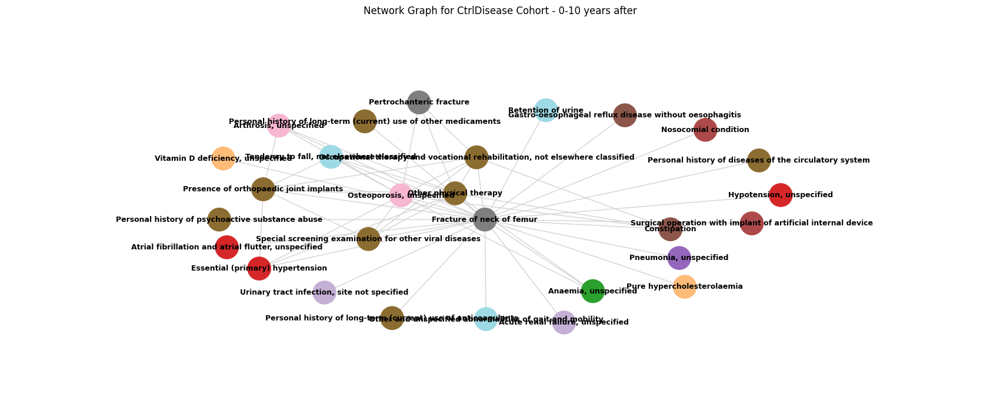

Plotting Network Graph for CtrlDisease Cohort - 0-8 years after with 103 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___0_8_years_after.png


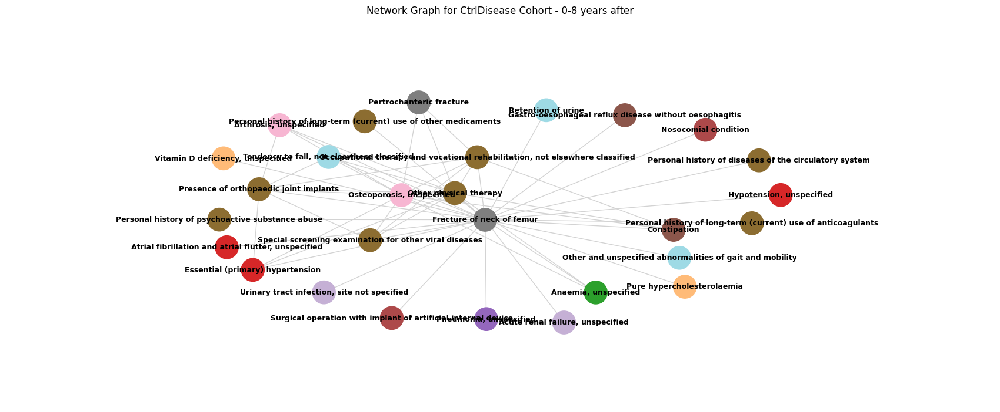

Plotting Network Graph for CtrlDisease Cohort - 0-6 years after with 96 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___0_6_years_after.png


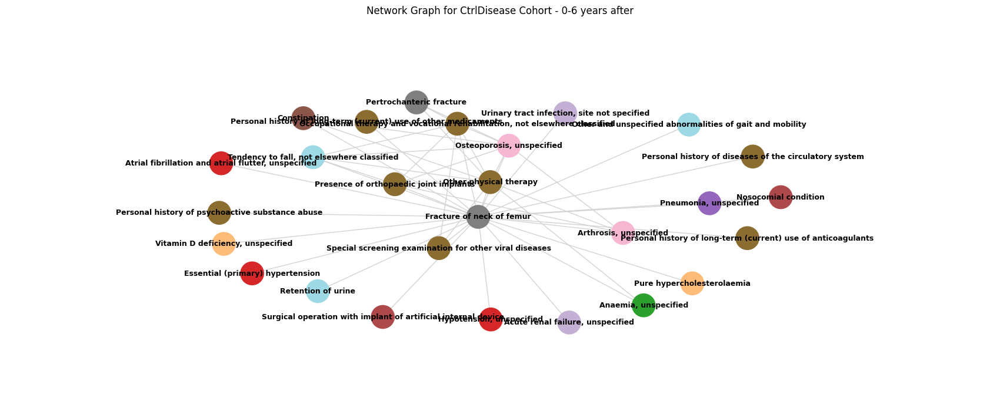

Plotting Network Graph for CtrlDisease Cohort - 0-4 years after with 89 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___0_4_years_after.png


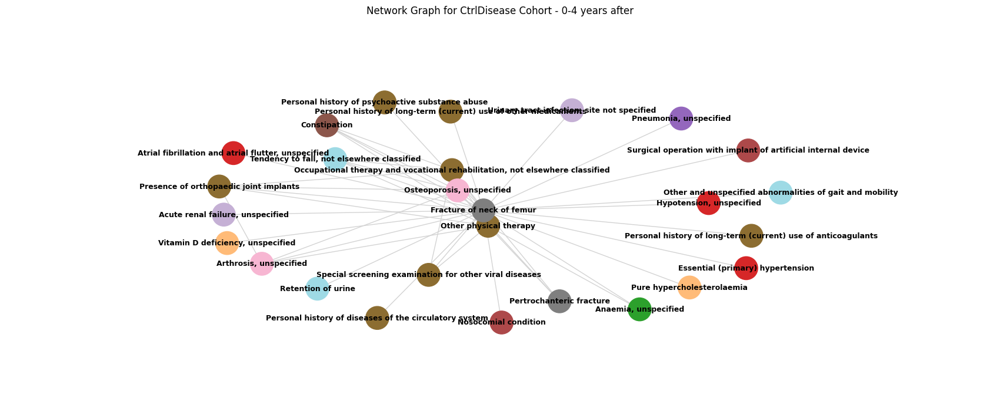

Plotting Network Graph for CtrlDisease Cohort - 20 years before to diagnosis with 124 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___20_years_before_to_diagnosis.png


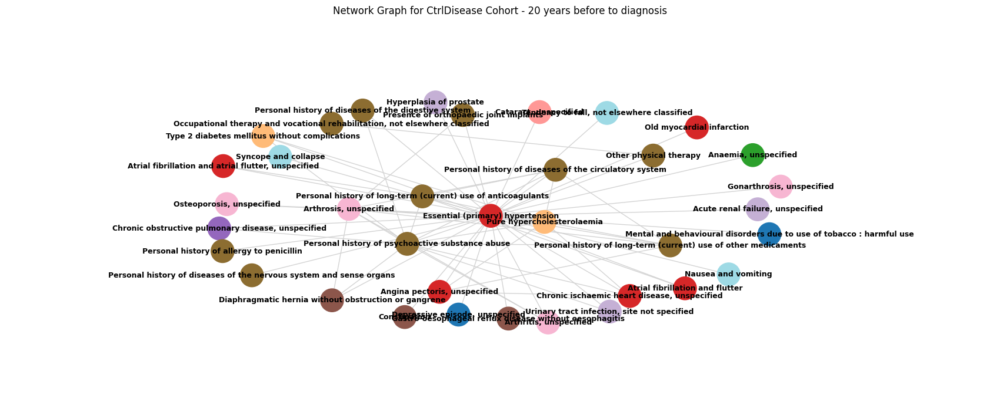

Plotting Network Graph for CtrlDisease Cohort - 0-2 years after with 79 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___0_2_years_after.png


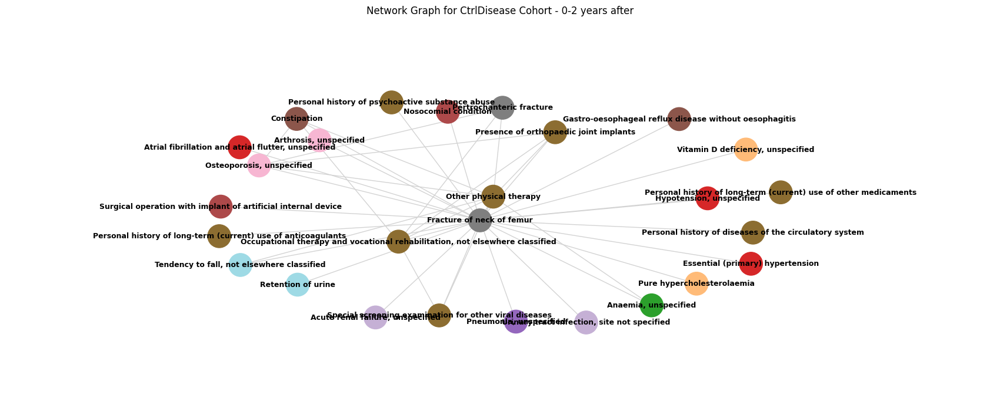

Plotting Network Graph for CtrlDisease Cohort - 20-2 years before with 115 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___20_2_years_before.png


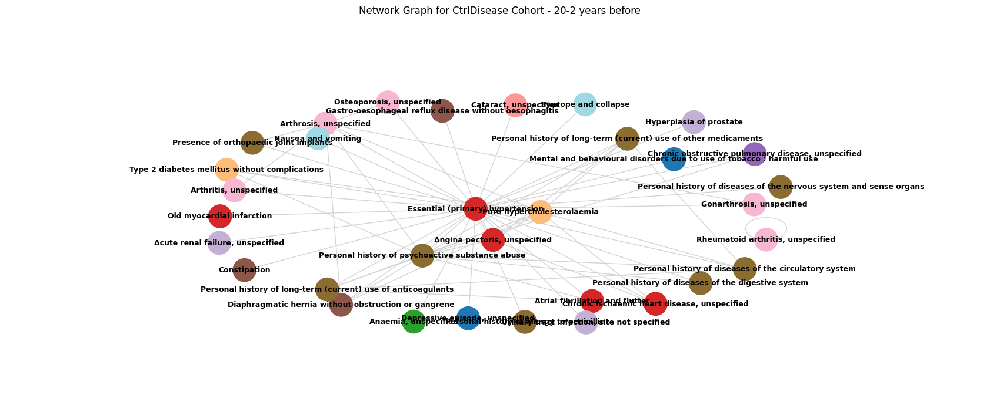

Plotting Network Graph for CtrlDisease Cohort - 20-5 years before with 96 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___20_5_years_before.png


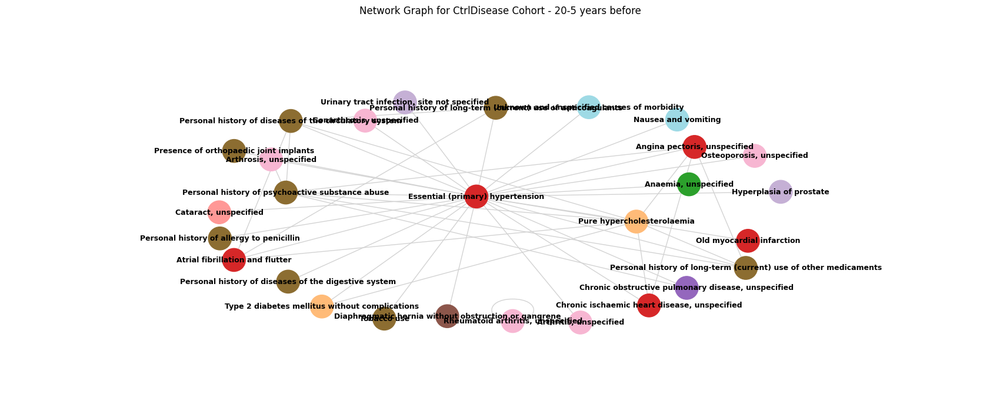

Plotting Network Graph for CtrlDisease Cohort - 20-7 years before with 80 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___20_7_years_before.png


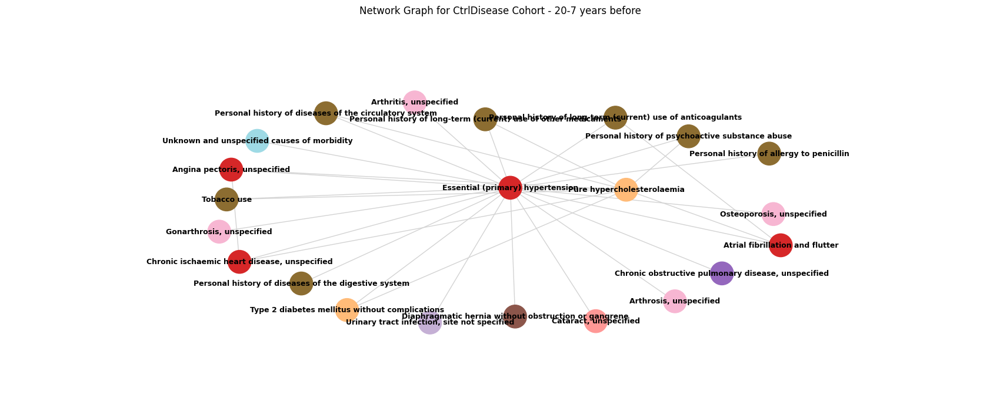

Plotting Network Graph for CtrlDisease Cohort - 20-10 years before with 75 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___20_10_years_before.png


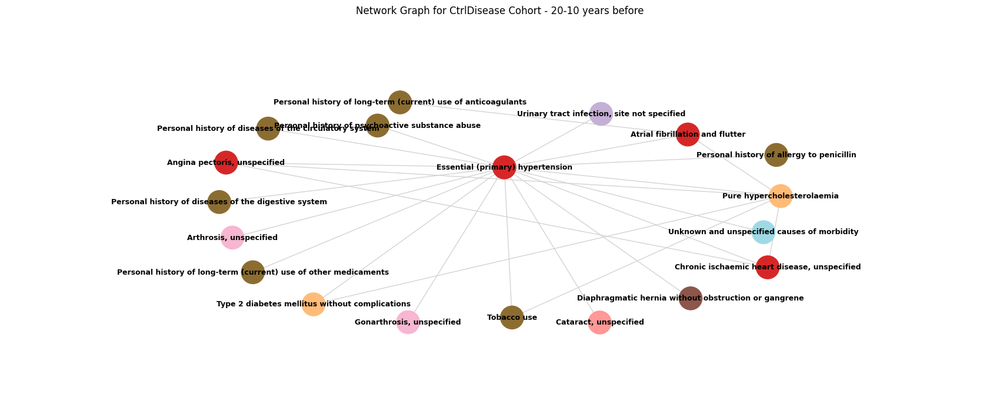

Plotting Network Graph for CtrlDisease Cohort - 20-15 years before with 74 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___20_15_years_before.png


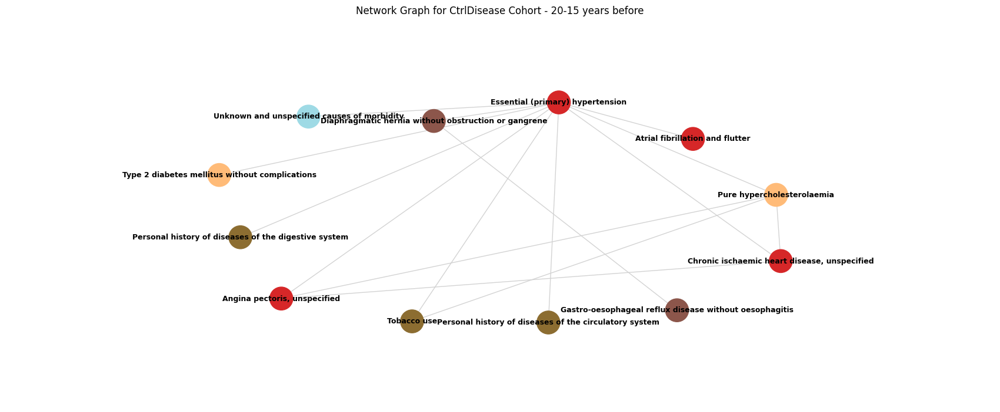

Plotting Network Graph for CtrlDisease Cohort - 20+ years before with 104 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_CtrlDisease_Cohort___20+_years_before.png


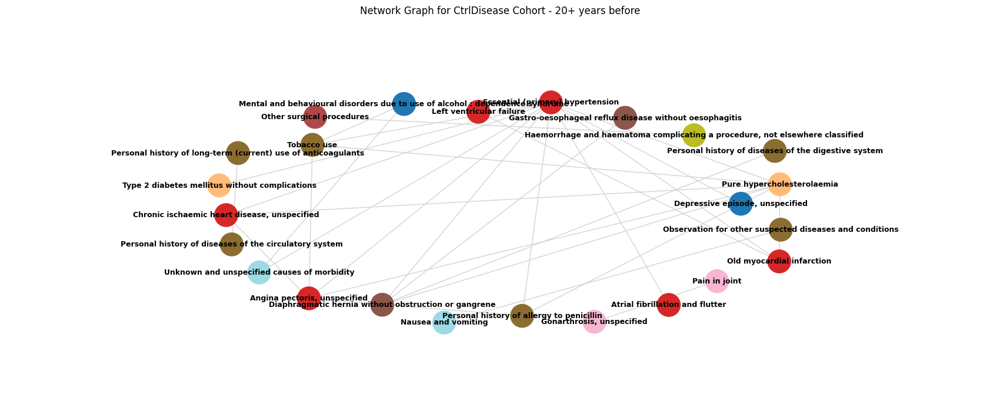

In [203]:
def plot_all_graphs_dem(top_patterns_dict, icd10_color_map=None, min_support=0.01, save_path='/Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs'):
    results = {}  # Dictionary to store all computed results
    for diagnosis, timeframes in top_patterns_dict.items():
        for timeframe, data in timeframes.items():
            title = f"Network Graph for {diagnosis} Cohort - {timeframe}"
            print(f"Plotting {title} with {len(data)} patterns")
            # Get the centrality data, edge support, and node colors
            centrality_data, edge_support, node_color_data = plot_network_graph_withmeasures_dem(
                data, title, min_support=min_support, icd10_color_map=icd10_color_map, save_path=save_path
            )
            # Store the results for this diagnosis and timeframe if the graph was not empty
            if centrality_data is not None:
                results[(diagnosis, timeframe)] = {
                    'centrality': centrality_data,
                    'edges': edge_support,
                    'node_colors': node_color_data
                }
    
    return results
results_networks_dem = plot_all_graphs_dem(top_patterns_dict_dem_sig, icd10_color_map=icd10_color_map, min_support=0.01)

Plotting Network Graph for Healthy Controls Matched to Control - 20 years before to diagnosis with 110 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___20_years_before_to_diagnosis.png


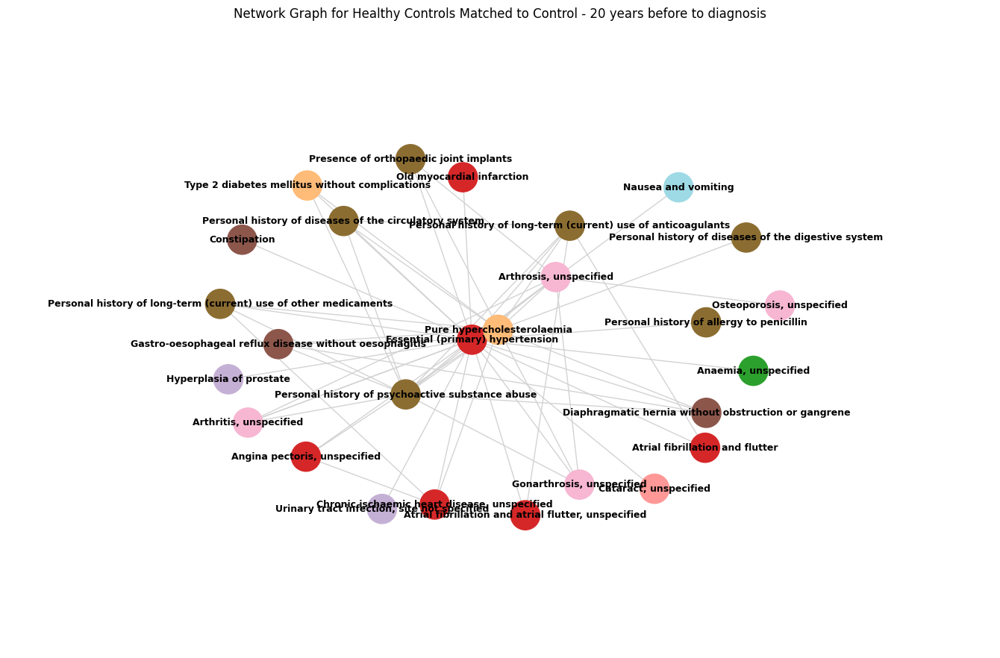

Plotting Network Graph for Healthy Controls Matched to Control - 20-2 years before with 95 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___20_2_years_before.png


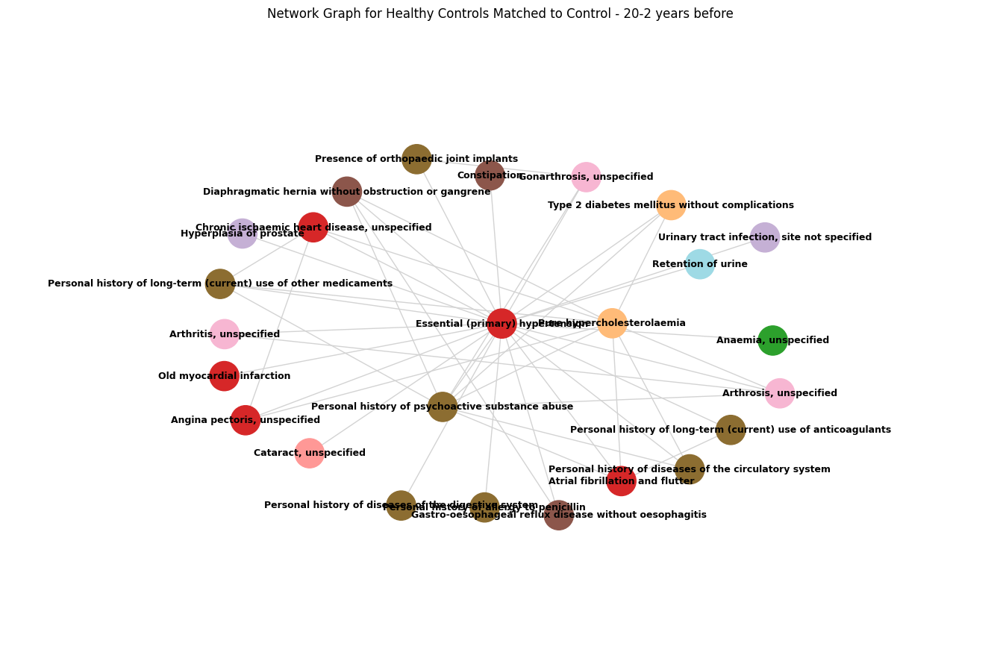

Plotting Network Graph for Healthy Controls Matched to Control - 0-10 years after with 80 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___0_10_years_after.png


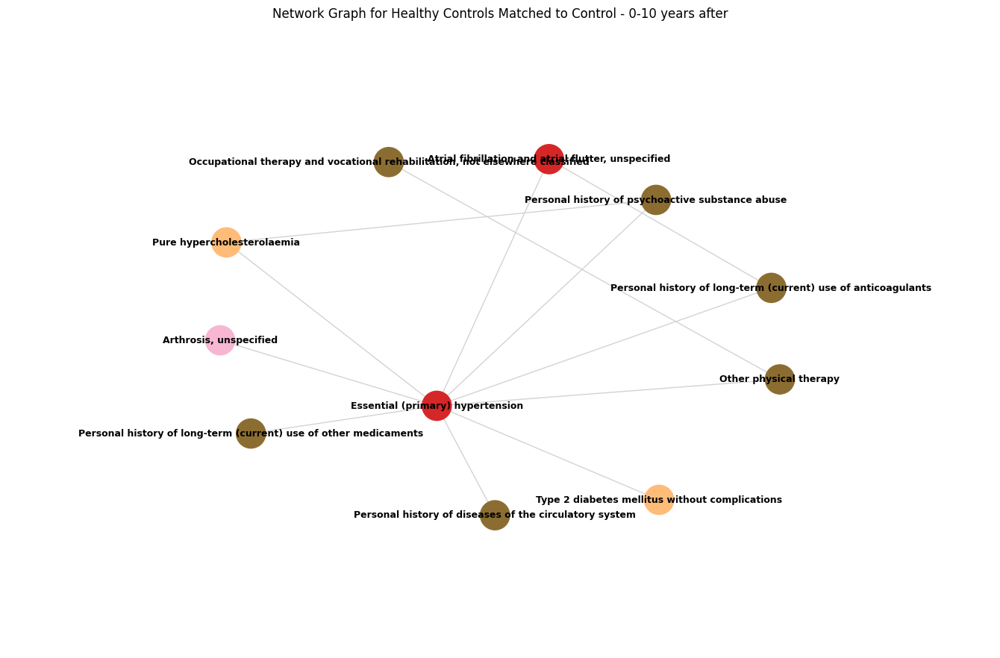

Plotting Network Graph for Healthy Controls Matched to Control - 0-8 years after with 74 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___0_8_years_after.png


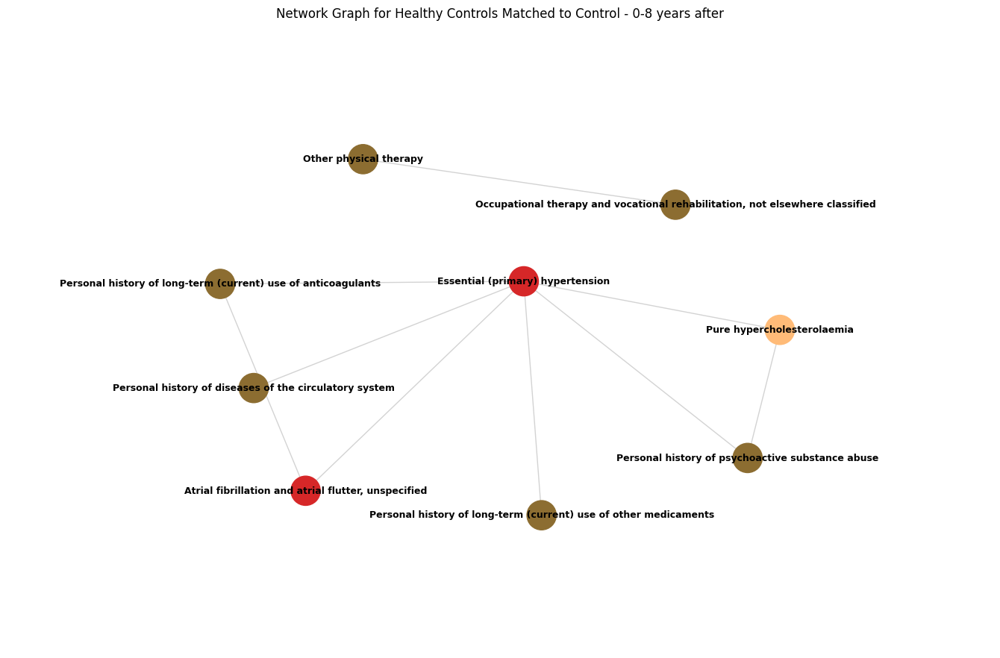

Plotting Network Graph for Healthy Controls Matched to Control - 20-5 years before with 95 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___20_5_years_before.png


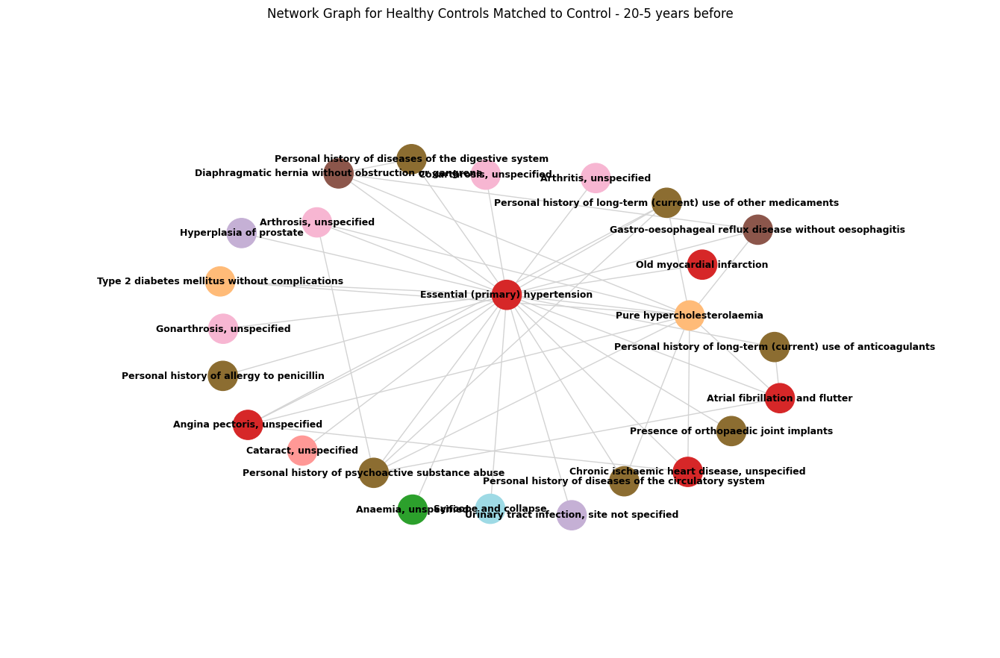

Plotting Network Graph for Healthy Controls Matched to Control - 0-6 years after with 73 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___0_6_years_after.png


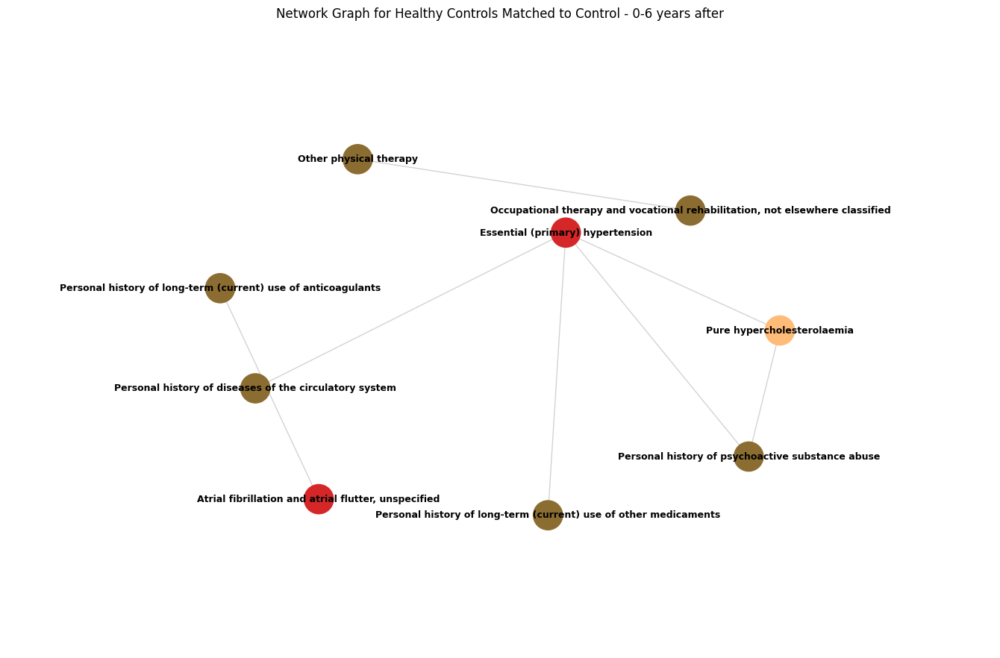

Plotting Network Graph for Healthy Controls Matched to Control - 20-7 years before with 85 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___20_7_years_before.png


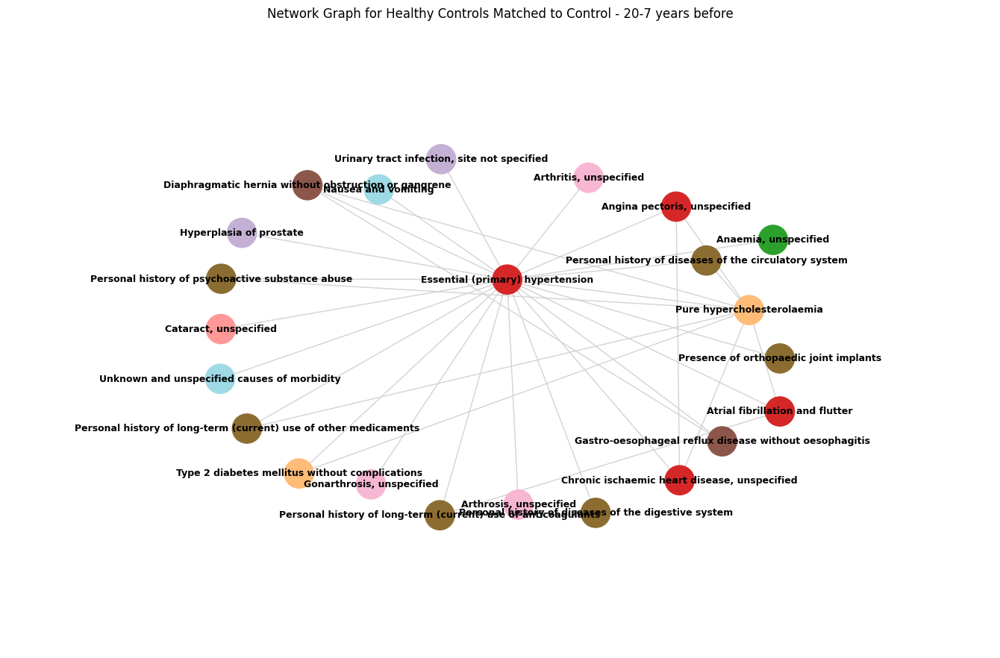

Plotting Network Graph for Healthy Controls Matched to Control - 0-4 years after with 74 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___0_4_years_after.png


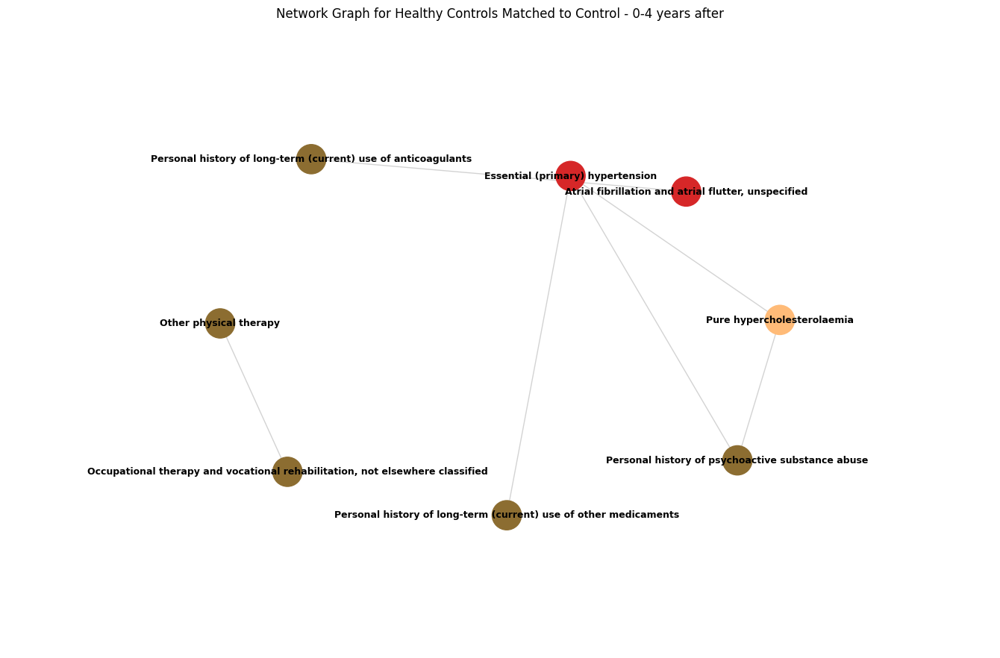

Plotting Network Graph for Healthy Controls Matched to Control - 0-2 years after with 78 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___0_2_years_after.png


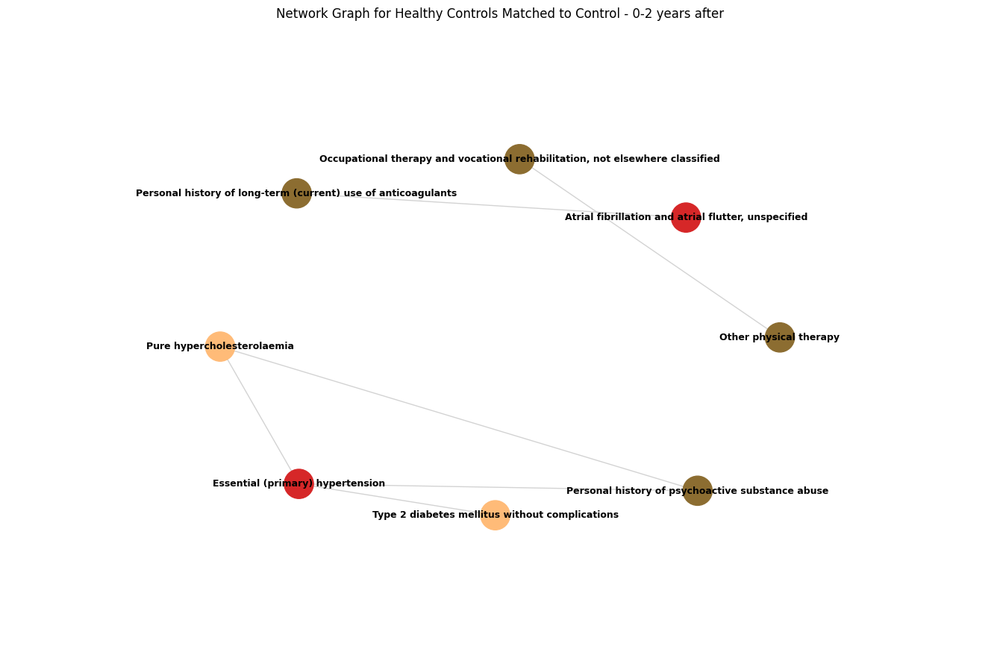

Plotting Network Graph for Healthy Controls Matched to Control - 20-10 years before with 79 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___20_10_years_before.png


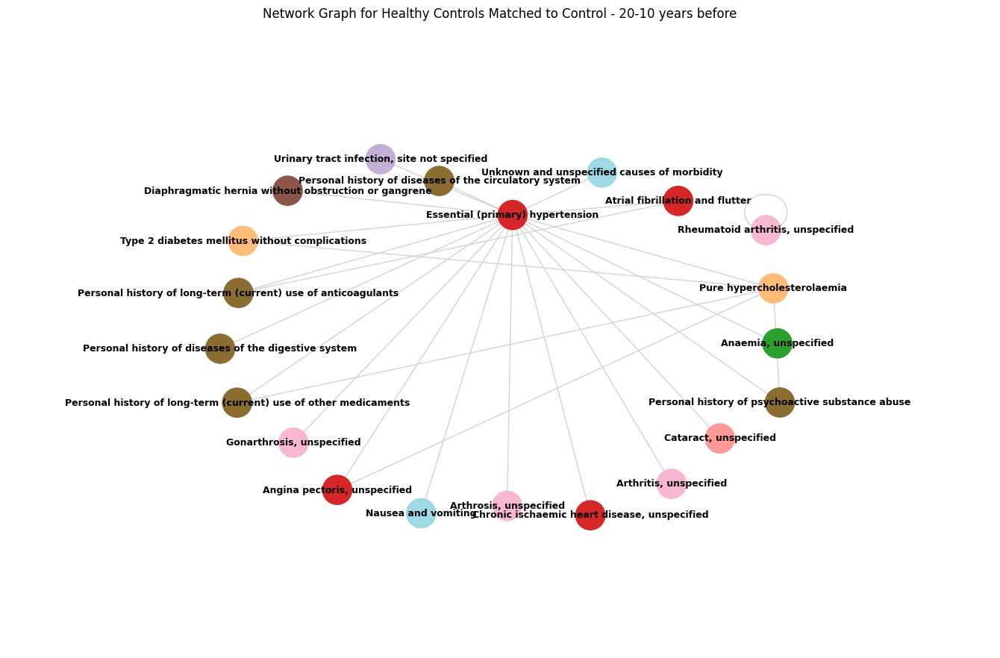

Plotting Network Graph for Healthy Controls Matched to Control - 20-15 years before with 75 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___20_15_years_before.png


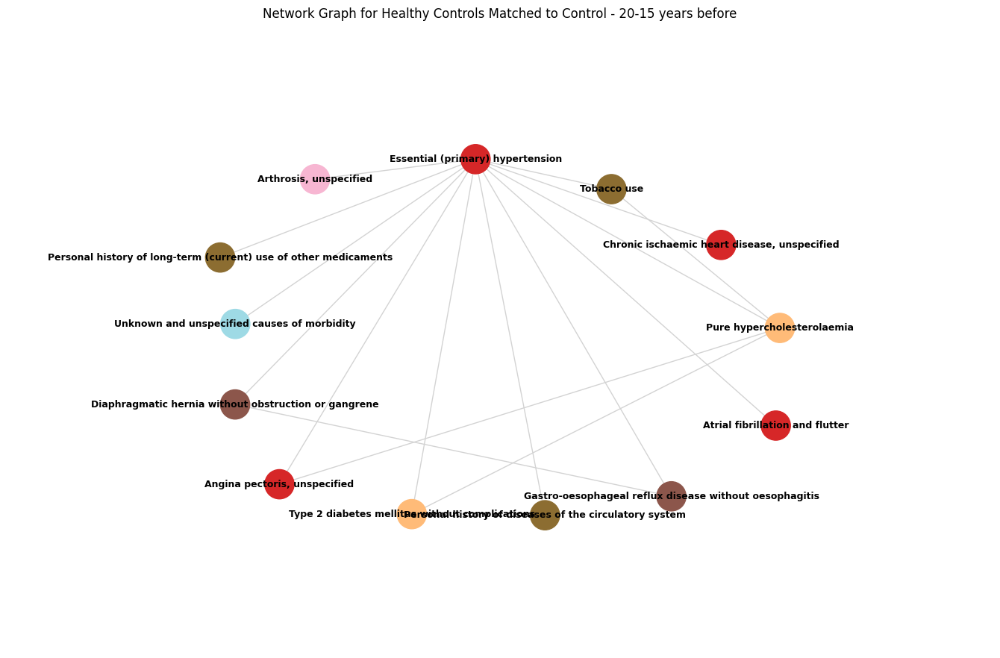

Plotting Network Graph for Healthy Controls Matched to Control - 20+ years before with 127 patterns
Graph saved as /Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs/Network_Graph_for_Healthy_Controls_Matched_to_Control___20+_years_before.png


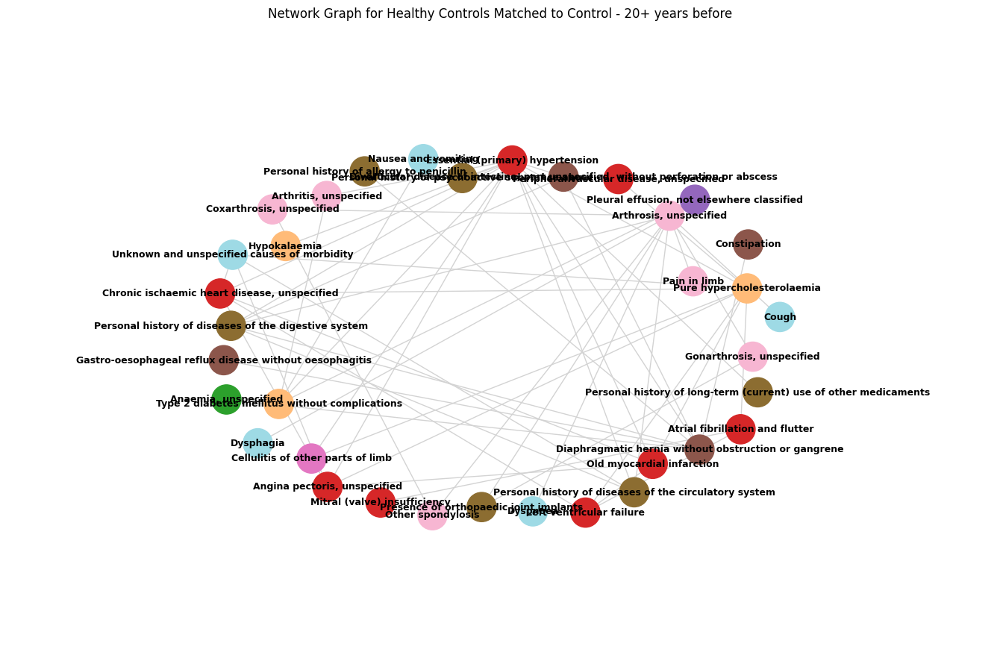

In [204]:

import os

def plot_network_graph_withmeasures_hc(data, title, min_support=0.01, icd10_color_map=None, save_path='/Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs'):
    G = nx.Graph()
    data = data[data['Support'] >= min_support]
    for pattern, support in data[['Pattern', 'Support']].values:
        for i in range(len(pattern)):
            for j in range(i + 1, len(pattern)):
                G.add_edge(pattern[i], pattern[j], weight=support)
    # Only plot and save if there are nodes in the graph
    if len(G.nodes()) > 0:
        # Adjust the layout and positioning to prevent labels from falling off
        pos = nx.spring_layout(G, k=10, seed=42)  # Seed ensures reproducibility of layout
        plt.figure(figsize=(12, 6))
        # Define global fixed scaling range for all edge widths
        min_width = 1
        max_width = 250
        global_min_support = 1000
        global_max_support = 100000
        edge_weights = [support for _, _, support in G.edges(data='weight')]
        if edge_weights:
            scaled_edge_weights = [
                min_width + (max_width - min_width) * (weight - global_min_support) / (global_max_support - global_min_support)
                for weight in edge_weights
            ]
            scaled_edge_weights = [max(min_width, min(width, max_width)) for width in scaled_edge_weights]
        else:
            scaled_edge_weights = []
        node_colors = [icd10_color_map.get(str(node), 'gray') for node in G.nodes()]
        ax = plt.gca()
        ax.margins(0.3)  # Add some padding around the plot to prevent clipping
        plt.subplots_adjust(left=0.1, right=1.2, top=1.5, bottom=0.1)  # Adjust margins
        nx.draw(G, pos, with_labels=False, node_size=800, node_color=node_colors, 
                font_size=9, font_weight="regular", edge_color="lightgray", width=scaled_edge_weights)
        # Draw the labels separately to avoid overlapping with nodes or edges
        labels = {node: str(node) for node in G.nodes()}
        nx.draw_networkx_labels(G, pos, labels=labels, font_size=9, font_weight='bold')
        plt.title(title, fontsize=12)
        # Create the directory if it doesn't exist
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        filename = f"{title.replace(' ', '_').replace('-', '_').replace('/', '_')}.png"
        save_filepath = os.path.join(save_path, filename)
        plt.savefig(save_filepath, format='png', bbox_inches='tight')
        print(f"Graph saved as {save_filepath}")
        plt.show()
        # Return computed values for analysis
        centrality_data = compute_centrality_measures(G)
        edge_support = extract_edge_support(G)
        node_color_data = extract_node_colors(G, icd10_color_map)
        return centrality_data, edge_support, node_color_data
    else:
        print(f"No nodes or edges in graph for {title}. Skipping save.")
        return None, None, None


def plot_all_graphs_hc(top_patterns_dict, icd10_color_map=None, min_support=0.01, save_path='/Users/cw3222/Documents/Imperial/BioBank/Paper_biobank_figures/NetworkGraphs'):
    results = {}  # Dictionary to store all computed results
    for diagnosis, timeframes in top_patterns_dict.items():
        for timeframe, data in timeframes.items():
            title = f"Network Graph for Healthy Controls Matched to {diagnosis} - {timeframe}"
            print(f"Plotting {title} with {len(data)} patterns")
            # Get the centrality data, edge support, and node colors
            centrality_data, edge_support, node_color_data = plot_network_graph_withmeasures_hc(
                data, title, min_support=min_support, icd10_color_map=icd10_color_map, save_path=save_path
            )
            # Store the results for this diagnosis and timeframe if the graph was not empty
            if centrality_data is not None:
                results[(diagnosis, timeframe)] = {
                    'centrality': centrality_data,
                    'edges': edge_support,
                    'node_colors': node_color_data
                }
    return results

results_networks_hc = plot_all_graphs_hc(top_patterns_dict_hc_sig, icd10_color_map=icd10_color_map, min_support=0.01)

<h1> Mapping Out Individual Conditions </h1>

In [205]:
import pandas as pd

def extract_conditions_from_networks(top_patterns_dict, min_support=0.01):
    """
    Extracts the unique conditions (ICD codes) from the network data, applying the same filtering 
    (based on min_support) as used in the network plot function. Each condition will be represented
    as a separate row in the resulting table.
    
    Args:
    - top_patterns_dict: Dictionary containing patterns for each diagnosis and timeframe.
    - min_support: The minimum support threshold to filter patterns before extraction.
    
    Returns:
    - conditions_df: DataFrame with columns: Diagnosis, Timeframe, Condition (one condition per row).
    """
    # List to hold all extracted data
    conditions_list = []

    # Loop through each diagnosis and timeframe
    for diagnosis, timeframes in top_patterns_dict.items():
        for timeframe, data in timeframes.items():
            # Filter the data to only include rows with support >= min_support
            data_filtered = data[data['Support'] >= min_support]
            
            # Extract the unique conditions (nodes) from the 'Pattern' column of the filtered data
            for pattern in data_filtered['Pattern']:
                for condition in pattern:  # Add each condition as a separate row
                    conditions_list.append({
                        'Diagnosis': diagnosis,
                        'Timeframe': timeframe,
                        'Condition': condition  # Each condition gets its own row
                    })
    
    # Convert the list to a pandas DataFrame
    conditions_df = pd.DataFrame(conditions_list)
    return conditions_df

In [206]:
# Extract the conditions in each network and generate a table
conditions_by_diagnosis_hc = extract_conditions_from_networks(top_patterns_dict_hc_sig)
conditions_by_diagnosis_ctrldis = extract_conditions_from_networks(top_patterns_dict_dem_sig)

In [207]:
def compare_conditions(conditions_hc_df, conditions_ctrl_dis_df):
    unique_to_ctrldis_list = []
    unique_to_hc_list = []
    all_diagnosis_timeframes = set(conditions_ctrl_dis_df[['Diagnosis', 'Timeframe']].apply(tuple, axis=1)) | \
                            set(conditions_hc_df[['Diagnosis', 'Timeframe']].apply(tuple, axis=1))
    for diagnosis, timeframe in all_diagnosis_timeframes:
        
        ctrldis_conditions = set(conditions_ctrl_dis_df[
            (conditions_ctrl_dis_df['Diagnosis'] == diagnosis) & 
            (conditions_ctrl_dis_df['Timeframe'] == timeframe)
        ]['Condition'])
        
        hc_conditions = set(conditions_hc_df[
            (conditions_hc_df['Diagnosis'] == diagnosis) & 
            (conditions_hc_df['Timeframe'] == timeframe)
        ]['Condition'])

        unique_to_ctrldis= ctrldis_conditions - hc_conditions
        for condition in unique_to_ctrldis:
            unique_to_ctrldis_list.append({
                'Diagnosis': diagnosis,
                'Timeframe': timeframe,
                'Condition': condition,
                'Unique_To': 'Cntrl Disease'
            })
        
        unique_to_hc = hc_conditions - ctrldis_conditions
        for condition in unique_to_hc:
            unique_to_hc_list.append({
                'Diagnosis': diagnosis,
                'Timeframe': timeframe,
                'Condition': condition,
                'Unique_To': 'Controls'
            })
    unique_to_ctrldis_df = pd.DataFrame(unique_to_ctrldis_list)
    unique_to_hc_df = pd.DataFrame(unique_to_hc_list)
    return unique_to_ctrldis_df, unique_to_hc_df

unique_to_ctrldis_df, unique_to_hc_df = compare_conditions(conditions_by_diagnosis_hc, conditions_by_diagnosis_ctrldis)

In [208]:
ctrl_dis_and_controls_combined = pd.concat([unique_to_ctrldis_df, unique_to_hc_df], axis=0)
ctrl_dis_and_controls_combined

,Diagnosis,Timeframe,Condition,Unique_To
0,CtrlDisease,20-7 years before,Mental and behavioural disorders due to use of...,Cntrl Disease
1,CtrlDisease,20-7 years before,Alcohol use,Cntrl Disease
2,CtrlDisease,20-7 years before,Personal history of psychoactive substance abuse,Cntrl Disease
3,CtrlDisease,20-7 years before,Personal history of diseases of the circulator...,Cntrl Disease
4,CtrlDisease,20-7 years before,"Gonarthrosis, unspecified",Cntrl Disease
...,...,...,...,...
773,Control,20-5 years before,Pain in limb,Controls
774,Control,20-5 years before,"Depressive episode, unspecified",Controls
775,Control,20-5 years before,Other specified soft tissue disorders,Controls
776,Control,20-5 years before,"Pleural effusion, not elsewhere classified",Controls


In [209]:
timeframe_order = [
    "20+ years before",
    "20-15 years before",
    "20-10 years before",
    "20-7 years before",
    "20-5 years before",
    "20-2 years before",
    "20 years before to diagnosis",
    "0-2 years after",
    "0-4 years after",
    "0-6 years after",
    "0-8 years after",
    "0-10 years after"
]

ctrl_dis_and_controls_combined['Timeframe'] = pd.Categorical(ctrl_dis_and_controls_combined['Timeframe'], categories=timeframe_order, ordered=True)
ctrl_dis_and_controls_combined = ctrl_dis_and_controls_combined.sort_values(by=['Diagnosis', 'Condition', 'Timeframe'])
ctrl_dis_and_controls_combined['Status'] = ctrl_dis_and_controls_combined.duplicated(subset=['Diagnosis', 'Condition'], keep='first')
ctrl_dis_and_controls_combined['Status'] = ctrl_dis_and_controls_combined['Status'].map({False: 'New', True: 'Recurring'})
ctrl_dis_and_controls_combined

,Diagnosis,Timeframe,Condition,Unique_To,Status
501,Control,20-15 years before,Abnormal results of liver function studies,Controls,New
559,Control,20-10 years before,Abnormal results of liver function studies,Controls,Recurring
478,Control,20-15 years before,Abnormal weight loss,Controls,New
538,Control,20-10 years before,Abnormal weight loss,Controls,Recurring
17,Control,20-7 years before,Abnormal weight loss,Controls,Recurring
...,...,...,...,...,...
113,CtrlDisease,0-2 years after,Volume depletion,Cntrl Disease,New
156,CtrlDisease,0-4 years after,Volume depletion,Cntrl Disease,Recurring
63,CtrlDisease,0-6 years after,Volume depletion,Cntrl Disease,Recurring
261,CtrlDisease,0-8 years after,Volume depletion,Cntrl Disease,Recurring


In [210]:
shared_conditions = ctrl_dis_and_controls_combined[ctrl_dis_and_controls_combined['Unique_To'].isin(['Controls', 'Cntrl Disease'])]['Condition'].value_counts()
shared_conditions = shared_conditions[shared_conditions > 1].index.tolist()

ctrl_dis_and_controls_combined['Unique_To'] = ctrl_dis_and_controls_combined.apply(
    lambda row: 'Shared' if row['Condition'] in shared_conditions else row['Unique_To'],
    axis=1
)
ctrl_dis_and_controls_combined['Unique_To'].value_counts()

Unique_To
Shared           1418
Controls           12
Cntrl Disease      10
Name: count, dtype: int64

In [211]:
code_mapping = icd_10.copy()
code_mapping.rename(columns= {'Title':'Condition'}, inplace = True)

In [212]:
code_mapping
chapter_mapping = {
    'A': 'Chapter 1: Certain infectious and parasitic diseases (A00-B99)',
    'B': 'Chapter 1: Certain infectious and parasitic diseases (A00-B99)',
    'C': 'Chapter 2: Neoplasms (C00-D49)',
    'D0-D4': 'Chapter 2: Neoplasms (C00-D49)',
    'D5-D8': 'Chapter 3: Diseases of the blood and blood-forming organs and certain disorders involving the immune mechanism (D50-D89)',
    'E': 'Chapter 4: Endocrine, nutritional and metabolic diseases (E00-E89)',
    'F': 'Chapter 5: Mental, Behavioral and Neurodevelopmental disorders (F01-F99)',
    'G': 'Chapter 6: Diseases of the nervous system (G00-G99)',
    'H0-H5': 'Chapter 7: Diseases of the eye and adnexa (H00-H59)',
    'H6-H9': 'Chapter 8: Diseases of the ear and mastoid process (H60-H95)',
    'I': 'Chapter 9: Diseases of the circulatory system (I00-I99)',
    'J': 'Chapter 10: Diseases of the respiratory system (J00-J99)',
    'K': 'Chapter 11: Diseases of the digestive system (K00-K95)',
    'L': 'Chapter 12: Diseases of the skin and subcutaneous tissue (L00-L99)',
    'M': 'Chapter 13: Diseases of the musculoskeletal system and connective tissue (M00-M99)',
    'N': 'Chapter 14: Diseases of the genitourinary system (N00-N99)',
    'O': 'Chapter 15: Pregnancy, childbirth and the puerperium (O00-O99)',
    'P': 'Chapter 16: Certain conditions originating in the perinatal period (P00-P96)',
    'Q': 'Chapter 17: Congenital malformations, deformations and chromosomal abnormalities (Q00-Q99)',
    'R': 'Chapter 18: Symptoms, signs and abnormal clinical and laboratory findings, not elsewhere classified (R00-R99)',
    'S': 'Chapter 19: Injury, poisoning and certain other consequences of external causes (S00-T88)',
    'T': 'Chapter 19: Injury, poisoning and certain other consequences of external causes (S00-T88)',
    'U': 'Chapter 22: Codes for special purposes (U00-U85)',
    'V': 'Chapter 20: External causes of morbidity and mortality (V00-Y99)',
    'W': 'Chapter 20: External causes of morbidity and mortality (V00-Y99)',
    'X': 'Chapter 20: External causes of morbidity and mortality (V00-Y99)',
    'Y': 'Chapter 20: External causes of morbidity and mortality (V00-Y99)',
    'Z': 'Chapter 21: Factors influencing health status and contact with health services (Z00-Z99)'
}

def get_chapter(condition, code_mapping, chapter_mapping):
    """ 
    Get the ICD-10 chapter for a given condition. 
    Args:
        condition (str): The condition to look for.
        code_mapping (DataFrame): DataFrame with 'Code' and 'Condition' columns.
        chapter_mapping (dict): ICD-10 chapter mapping.
    Returns:
        str: The chapter name or 'Unknown' if not found.
    """
    # Find the corresponding 'Code' for the given 'Condition' in the code_mapping DataFrame
    matching_code = code_mapping.loc[code_mapping['Condition'] == condition, 'Code']
    
    if not matching_code.empty:
        block_start = matching_code.iloc[0].split('-')[0]  # Handles ranges like 'A00-A09'
        first_char = block_start[0]  # First character of the block (A, B, C, etc.)
        
        if first_char == 'H':  # Handle H00-H59 and H60-H95
            if '00' <= block_start[1:3] <= '59':
                return chapter_mapping.get('H0-H5', 'Unknown')
            elif '60' <= block_start[1:3] <= '99':
                return chapter_mapping.get('H6-H9', 'Unknown')
        
        elif first_char == 'D':  # Handle D00-D49 (Chapter 2) and D50-D89 (Chapter 3)
            if '00' <= block_start[1:3] <= '49':
                return chapter_mapping.get('D0-D4', 'Unknown')
            elif '50' <= block_start[1:3] <= '89':
                return chapter_mapping.get('D5-D8', 'Unknown')
        
        else:
            # For all other chapters, look up using the first letter
            return chapter_mapping.get(first_char, 'Unknown')
    
    return 'Unknown'

In [213]:
unique_to_ctrldis_df['Chapter'] = unique_to_ctrldis_df['Condition'].apply(lambda condition: get_chapter(condition, code_mapping, chapter_mapping))

ctrl_dis_and_controls_combined['Chapter'] = ctrl_dis_and_controls_combined['Condition'].apply(lambda condition: get_chapter(condition, code_mapping, chapter_mapping))


In [214]:
unique_to_ctrldis_df['Chapter Number'] = unique_to_ctrldis_df['Chapter'].str.extract(r'Chapter (\d+)').astype(int)
ctrl_dis_and_controls_combined['Chapter Number'] = ctrl_dis_and_controls_combined['Chapter'].str.extract(r'Chapter (\d+)').astype(int)
ctrl_dis_and_controls_combined

,Diagnosis,Timeframe,Condition,Unique_To,Status,Chapter,Chapter Number
501,Control,20-15 years before,Abnormal results of liver function studies,Shared,New,"Chapter 18: Symptoms, signs and abnormal clini...",18
559,Control,20-10 years before,Abnormal results of liver function studies,Shared,Recurring,"Chapter 18: Symptoms, signs and abnormal clini...",18
478,Control,20-15 years before,Abnormal weight loss,Shared,New,"Chapter 18: Symptoms, signs and abnormal clini...",18
538,Control,20-10 years before,Abnormal weight loss,Shared,Recurring,"Chapter 18: Symptoms, signs and abnormal clini...",18
17,Control,20-7 years before,Abnormal weight loss,Shared,Recurring,"Chapter 18: Symptoms, signs and abnormal clini...",18
...,...,...,...,...,...,...,...
113,CtrlDisease,0-2 years after,Volume depletion,Shared,New,"Chapter 4: Endocrine, nutritional and metaboli...",4
156,CtrlDisease,0-4 years after,Volume depletion,Shared,Recurring,"Chapter 4: Endocrine, nutritional and metaboli...",4
63,CtrlDisease,0-6 years after,Volume depletion,Shared,Recurring,"Chapter 4: Endocrine, nutritional and metaboli...",4
261,CtrlDisease,0-8 years after,Volume depletion,Shared,Recurring,"Chapter 4: Endocrine, nutritional and metaboli...",4


In [215]:
ctrl_dis_and_controls_combined["Condition"] = ctrl_dis_and_controls_combined["Condition"].str.replace(r",\s*unspecified\b", "", regex=True).str.strip()

<h3> Map the diagnoses to their corresponding chapters. </h3>

In [216]:
ctrldis_or_both_df_filtered = ctrl_dis_and_controls_combined.copy()
ctrldis_or_both_df_filtered.sort_values(by = 'Timeframe', ascending=False, inplace = True)

In [217]:
timeframe_mapping_tofig = {
    "20-15 years before": "20-15 years before",
    "20-10 years before": "15-10 years before",
    "20-7 years before": "10-7 years before",
    "20-5 years before": "7-5 years before",
    "20-2 years before": "5-2 years before",
    "20 years before to diagnosis": "2 years before to diagnosis"
}

# Replace the old timeframes with the new ones
ctrldis_or_both_df_filtered['Timeframe'] = ctrldis_or_both_df_filtered['Timeframe'].replace(timeframe_mapping_tofig)
ctrldis_or_both_df_filtered['Unique_To'].value_counts()

/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/1415535858.py:11: FutureWarning:

The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.



Unique_To
Shared           1418
Controls           12
Cntrl Disease      10
Name: count, dtype: int64

<h3> Unique Individual Conditions Plot </h3>

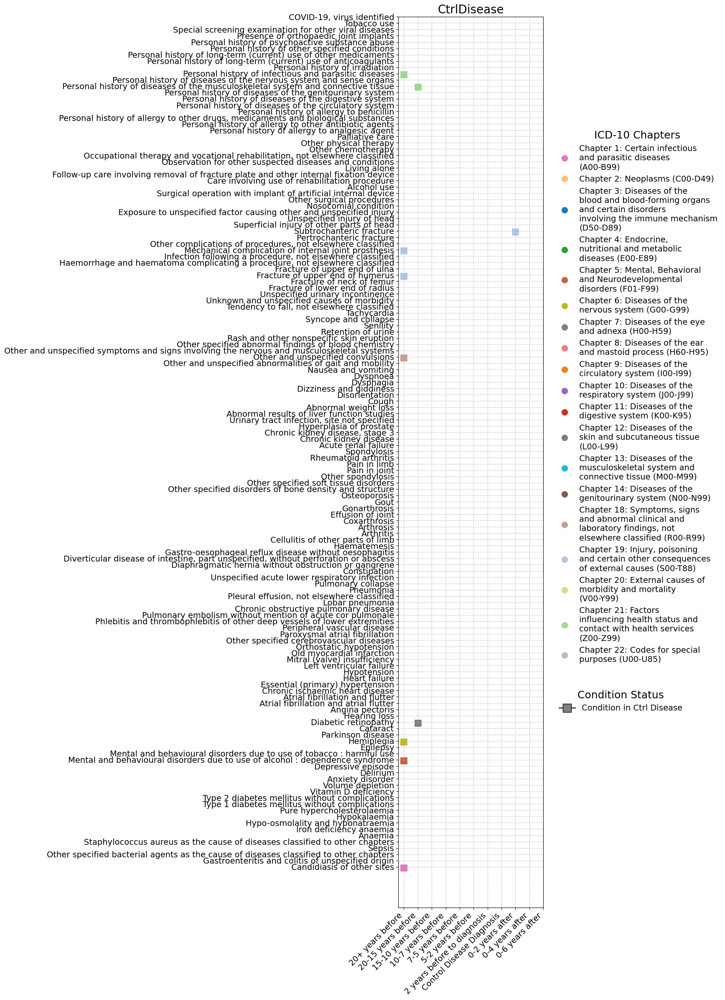

In [218]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines  # Import to create proxy artists
import textwrap  # Import textwrap for wrapping y-axis labels

# Define the chapter color mapping
chapter_colors = {
    'Chapter 1: Certain infectious and parasitic diseases (A00-B99)': '#e377c2',
    'Chapter 2: Neoplasms (C00-D49)': '#ffbb78',
    'Chapter 3: Diseases of the blood and blood-forming organs and certain disorders involving the immune mechanism (D50-D89)': '#1f77b4',
    'Chapter 4: Endocrine, nutritional and metabolic diseases (E00-E89)': '#2ca02c',
    'Chapter 5: Mental, Behavioral and Neurodevelopmental disorders (F01-F99)': '#C9613C',
    'Chapter 6: Diseases of the nervous system (G00-G99)': '#bcbd22',
    'Chapter 7: Diseases of the eye and adnexa (H00-H59)': '#7f7f7f',
    'Chapter 8: Diseases of the ear and mastoid process (H60-H95)': '#F47A7A',
    'Chapter 9: Diseases of the circulatory system (I00-I99)': '#ff7f0e',
    'Chapter 10: Diseases of the respiratory system (J00-J99)': '#9467bd',
    'Chapter 11: Diseases of the digestive system (K00-K95)': '#d62728',
    'Chapter 12: Diseases of the skin and subcutaneous tissue (L00-L99)': '#7f7f7f',
    'Chapter 13: Diseases of the musculoskeletal system and connective tissue (M00-M99)': '#17becf',
    'Chapter 14: Diseases of the genitourinary system (N00-N99)': '#8c564b',
    'Chapter 18: Symptoms, signs and abnormal clinical and laboratory findings, not elsewhere classified (R00-R99)': '#c49c94',
    'Chapter 19: Injury, poisoning and certain other consequences of external causes (S00-T88)': '#aec7e8',
    'Chapter 20: External causes of morbidity and mortality (V00-Y99)': '#dbdb8d',
    'Chapter 21: Factors influencing health status and contact with health services (Z00-Z99)': '#98df8a',
    'Chapter 22: Codes for special purposes (U00-U85)': '#c5b0d5',
}

# Group Conditions by Chapter
chapter_order = list(chapter_colors.keys())
ctrldis_or_both_df_filtered['Chapter_Index'] = ctrldis_or_both_df_filtered['Chapter'].apply(lambda x: chapter_order.index(x))

# Sort by Chapter Index and then by Condition
sorted_conditions = (
    ctrldis_or_both_df_filtered
    .sort_values(['Chapter_Index', 'Condition'])
    ['Condition']
    .unique()
)

# Timeframe order
timeframe_order = [
    "20+ years before",
    "20-15 years before",
    "15-10 years before",
    "10-7 years before",
    "7-5 years before",
    "5-2 years before",
    "2 years before to diagnosis",
    "Control Disease Diagnosis",
    "0-2 years after",
    "0-4 years after",
    "0-6 years after"
]

fig, ax = plt.subplots(1, 1, figsize=(12, 15))

def plot_cntrl_disease(df, ax, title):
    offset = 0.3
    cntrl_offset = -offset / 2

    for timeframe in timeframe_order:
        cntrl_df = df[
            (df['Unique_To'] == 'Cntrl Disease') &
            (df['Timeframe'] == timeframe)
        ]
        if not cntrl_df.empty:
            condition_counts = cntrl_df['Condition'].value_counts()
            for condition, count in condition_counts.items():
                y_position = sorted_conditions.tolist().index(condition) + cntrl_offset
                for _, row in cntrl_df[cntrl_df['Condition'] == condition].iterrows():
                    chapter = row['Chapter']
                    color = chapter_colors.get(chapter, 'black')

                    ax.scatter(
                        timeframe_order.index(timeframe), y_position,
                        s=count * 100, color=color,
                        edgecolor=color, marker='s',
                        linewidth=2
                    )

    ax.set_title(title, fontsize=20)
    ax.set_xticks(range(len(timeframe_order)))
    ax.set_xticklabels(timeframe_order, rotation=45, ha='right', fontsize=14)
    wrapped_labels = [textwrap.fill(label, width=100) for label in sorted_conditions]
    ax.set_yticks(np.arange(len(sorted_conditions)))
    ax.set_yticklabels(wrapped_labels, fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.7)

# Plot only CtrlDisease
plot_cntrl_disease(
    ctrldis_or_both_df_filtered[ctrldis_or_both_df_filtered['Diagnosis'] == "CtrlDisease"],
    ax,
    "CtrlDisease"
)

# Chapter legend
chapter_handles = [
    mlines.Line2D([], [], color=color, marker='o', linestyle='None', markersize=10, label=chapter)
    for chapter, color in chapter_colors.items()
]

condition_status_handle = mlines.Line2D([], [], marker='s', color='black', linestyle='-', markersize=15,
                                        label='Condition in Ctrl Disease', markerfacecolor='grey')

fig.subplots_adjust(bottom=0.25)
wrapped_title = textwrap.fill("ICD-10 Chapters", width=40)
chapter_legend = fig.legend(
    handles=chapter_handles,
    loc='upper right', bbox_to_anchor=(1.45, 1.6),
    fontsize=14, ncol=1, frameon=False, title=wrapped_title
)
chapter_legend.get_title().set_fontsize(18)

for label in chapter_legend.get_texts():
    label.set_text(textwrap.fill(label.get_text(), width=30))

status_legend = fig.legend(
    handles=[condition_status_handle],
    loc='lower right', bbox_to_anchor=(1.38, 0.65),
    fontsize=14, ncol=1, frameon=False, title="Condition Status"
)
status_legend.get_title().set_fontsize(18)

plt.tight_layout(rect=[0, 0.2, 1.1, 1.8])
plt.show()

In [219]:
dementia_or_both_df_filtered_removed_dementia_diag = pd.read_csv('/Users/cw3222/Documents/Imperial/BioBank/Paper/dementia_or_both_df_filtered_removed_dementia_diag.csv')

In [220]:
dementia_or_both_df_filtered_removed_dementia_diag_merged_ctrldis = pd.concat([dementia_or_both_df_filtered_removed_dementia_diag, 
    ctrldis_or_both_df_filtered
], axis = 0)

In [221]:
combined_withctrldis = dementia_or_both_df_filtered_removed_dementia_diag_merged_ctrldis.loc[dementia_or_both_df_filtered_removed_dementia_diag_merged_ctrldis['Condition'].isin(dementia_or_both_df_filtered_removed_dementia_diag['Condition'])]
combined_withctrldis

,Diagnosis,Timeframe,Condition,Unique_To,Status,Chapter,Chapter Number,Chapter_Index
0,Alzheimer's Disease,10-7 years before,Medical care,Shared,Recurring,Chapter 21: Factors influencing health status ...,21,16
1,Vascular Dementia,10-7 years before,Gastroduodenitis,Shared,Recurring,Chapter 11: Diseases of the digestive system (...,11,9
2,Vascular Dementia,10-7 years before,Arthritis,Shared,Recurring,Chapter 13: Diseases of the musculoskeletal sy...,13,11
3,Vascular Dementia,10-7 years before,Arthrosis,Shared,Recurring,Chapter 13: Diseases of the musculoskeletal sy...,13,11
4,Vascular Dementia,10-7 years before,Personal history of diseases of the circulator...,Shared,Recurring,Chapter 21: Factors influencing health status ...,21,16
...,...,...,...,...,...,...,...,...
681,Control,20+ years before,Personal history of diseases of the circulator...,Shared,New,Chapter 21: Factors influencing health status ...,21,17
549,CtrlDisease,20+ years before,Retention of urine,Shared,New,"Chapter 18: Symptoms, signs and abnormal clini...",18,14
673,Control,20+ years before,Pulmonary embolism without mention of acute co...,Shared,New,Chapter 9: Diseases of the circulatory system ...,9,8
550,CtrlDisease,20+ years before,Peripheral vascular disease,Shared,New,Chapter 9: Diseases of the circulatory system ...,9,8


/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/1637047831.py:117: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/var/folders/x8/q88hgqyj0b13dzxlmfyt_txw0000gp/T/ipykernel_56689/1637047831.py:117: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



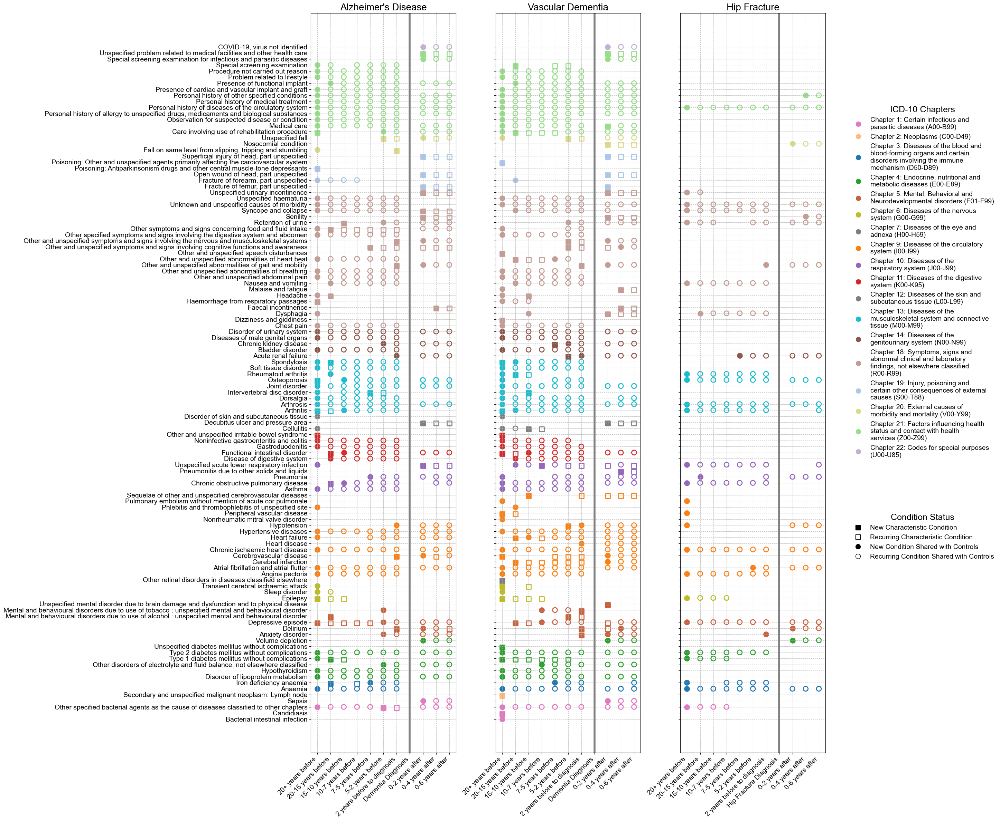

In [287]:
#the mapping for the AD and VD for the paper 
import matplotlib as mpl

mpl.rcParams['font.family'] = 'Arial'  # or 'sans-serif'
mpl.rcParams['font.size'] = 14 

chapter_colors = {
    'Chapter 1: Certain infectious and parasitic diseases (A00-B99)': '#e377c2',
    'Chapter 2: Neoplasms (C00-D49)': '#ffbb78',
    'Chapter 3: Diseases of the blood and blood-forming organs and certain disorders involving the immune mechanism (D50-D89)': '#1f77b4',
    'Chapter 4: Endocrine, nutritional and metabolic diseases (E00-E89)': '#2ca02c',
    'Chapter 5: Mental, Behavioral and Neurodevelopmental disorders (F01-F99)': '#C9613C',
    'Chapter 6: Diseases of the nervous system (G00-G99)': '#bcbd22',
    'Chapter 7: Diseases of the eye and adnexa (H00-H59)': '#7f7f7f',
    # 'Chapter 8: Diseases of the ear and mastoid process (H60-H95)': '#F47A7A',
    'Chapter 9: Diseases of the circulatory system (I00-I99)': '#ff7f0e',
    'Chapter 10: Diseases of the respiratory system (J00-J99)': '#9467bd',
    'Chapter 11: Diseases of the digestive system (K00-K95)': '#d62728',
    'Chapter 12: Diseases of the skin and subcutaneous tissue (L00-L99)': '#7f7f7f',
    'Chapter 13: Diseases of the musculoskeletal system and connective tissue (M00-M99)': '#17becf',
    'Chapter 14: Diseases of the genitourinary system (N00-N99)': '#8c564b',
    # 'Chapter 15: Pregnancy, childbirth and the puerperium (O00-O99)': '#e7969c',
    # 'Chapter 16: Certain conditions originating in the perinatal period (P00-P96)': '#9edae5',
    # 'Chapter 17: Congenital malformations, deformations and chromosomal abnormalities (Q00-Q99)': '#f7b6d2',
    'Chapter 18: Symptoms, signs and abnormal clinical and laboratory findings, not elsewhere classified (R00-R99)': '#c49c94',
    'Chapter 19: Injury, poisoning and certain other consequences of external causes (S00-T88)': '#aec7e8',
    'Chapter 20: External causes of morbidity and mortality (V00-Y99)': '#dbdb8d',
    'Chapter 21: Factors influencing health status and contact with health services (Z00-Z99)': '#98df8a',
    'Chapter 22: Codes for special purposes (U00-U85)': '#c5b0d5',
}

# **New Section: Group Conditions by Chapter**
chapter_order = list(chapter_colors.keys())  # Maintain the order of chapters
combined_withctrldis['Chapter_Index'] = combined_withctrldis['Chapter'].apply(lambda x: chapter_order.index(x))

# Sort by Chapter Index and then by Condition
sorted_conditions = (
    combined_withctrldis
    .sort_values(['Chapter_Index', 'Condition'])
    ['Condition']
    .unique()
)

# Plotting
timeframe_order = [
    "20+ years before",
    "20-15 years before",
    "15-10 years before",
    "10-7 years before",
    "7-5 years before",
    "5-2 years before",
    "2 years before to diagnosis",
    "Dementia Diagnosis",
    "0-2 years after",
    "0-4 years after",
    "0-6 years after"
    # "6-8 years after"
]

fig, axes = plt.subplots(1, 3, figsize=(22, 15), sharey=True)

def plot_diagnosis_group(df, ax, title):
    offset = 0.3  
    dementia_offset = -offset / 2  
    cntrl_disease_offset = offset / 2  
    
    for timeframe in timeframe_order:
        # Filter relevant conditions (Dementia Only, Shared, Cntrl Disease)
        plot_df = df[
            (df['Unique_To'].isin(['Dementia Only', 'Shared', 'Cntrl Disease'])) &
            (df['Timeframe'] == timeframe)
        ]
        
        if not plot_df.empty:
            condition_counts = plot_df['Condition'].value_counts()
            for condition, count in condition_counts.items():
                for _, row in plot_df[plot_df['Condition'] == condition].iterrows():
                    unique_to = row['Unique_To']
                    status = row['Status']
                    chapter = row['Chapter']
                    edge_color = chapter_colors[chapter]
                    fill_style = 'full' if status == 'New' else 'none'

                    # Set y_position and marker based on category
                    base_index = sorted_conditions.tolist().index(condition)
                    
                    if unique_to == 'Dementia Only':
                        y_position = base_index + dementia_offset
                        marker_style = 's'
                    elif unique_to == 'Cntrl Disease':
                        y_position = base_index + cntrl_disease_offset
                        marker_style = 's'
                    else:  # Shared
                        y_position = base_index
                        marker_style = 'o'

                    ax.scatter(
                        timeframe_order.index(timeframe), y_position,
                        s=count * 100,
                        color=chapter_colors[chapter] if fill_style == 'full' else 'none',
                        edgecolor=edge_color,
                        marker=marker_style,
                        linewidth=2,
                        facecolors='none' if fill_style == 'none' else chapter_colors[chapter]
                    )

    ax.set_title(title, fontsize=20)
    ax.set_xticks(range(len(timeframe_order)))
    ax.set_xticklabels(timeframe_order, rotation=45, ha='right', fontsize = 14)
    wrapped_labels = [textwrap.fill(label, width=100) for label in sorted_conditions]
    ax.set_yticks(np.arange(len(sorted_conditions)))
    ax.set_yticklabels(wrapped_labels, fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.7)
    
    xticks = timeframe_order.copy()
    xticks[xticks.index("Dementia Diagnosis")] = "Hip Fracture Diagnosis"
    axes[2].set_xticklabels(xticks, rotation=45, ha='right', fontsize=14)
    
    x_position_diag = timeframe_order.index("Dementia Diagnosis")
    ax.axvline(x=x_position_diag, color='grey', linestyle='solid', linewidth=4)


# Plot each diagnosis group
plot_diagnosis_group(combined_withctrldis[combined_withctrldis['Diagnosis'] == "Alzheimer's Disease"], axes[0], "Alzheimer's Disease")
plot_diagnosis_group(combined_withctrldis[combined_withctrldis['Diagnosis'] == "Vascular Dementia"], axes[1], "Vascular Dementia")
plot_diagnosis_group(combined_withctrldis[combined_withctrldis['Diagnosis'] == "CtrlDisease"], axes[2], "Hip Fracture")

# Legends
chapter_handles = [
    mlines.Line2D([], [], color=color, marker='o', linestyle='None', markersize=10, label=chapter) 
    for chapter, color in chapter_colors.items()
]

new_handle_dementia = mlines.Line2D([], [], marker='s', color='black', linestyle='-', markersize=15, label='Condition Characteristic to Cohort', markerfacecolor='grey')
recurring_handle_dementia = mlines.Line2D([], [], marker='s', color='black', linestyle='-', markersize=15, label='Recurring Characteristic Condition', markerfacecolor='none')
new_handle_shared = mlines.Line2D([], [], marker='o', color='black', linestyle='-', markersize=15, label='Condition Shared with Controls', markerfacecolor='grey')
recurring_handle_shared = mlines.Line2D([], [], marker='o', color='black', linestyle='-', markersize=15, label='Recurring Condition Shared with Controls', markerfacecolor='none')

fig.subplots_adjust(bottom=0.25)
wrapped_title = textwrap.fill("ICD-10 Chapters", width=40)
chapter_legend = fig.legend(
    handles=chapter_handles, loc='upper right', bbox_to_anchor=(1.32, 1.6),fontsize=14, ncol=1, frameon=False, title=wrapped_title
)
chapter_legend.get_title().set_fontsize(18)

for label in chapter_legend.get_texts():
    label.set_text(textwrap.fill(label.get_text(), width=38)) 

def wrap_label(label, width=40):
    return "\n".join(textwrap.wrap(label, width))
status_elements = [
    mlines.Line2D([], [], color="black", marker='s', linestyle='None', markersize=10, markerfacecolor='black',
                    label=wrap_label("New Characteristic Condition")),
    mlines.Line2D([], [], color="black", marker='s', linestyle='None', markersize=10, markerfacecolor='none',
                    label=wrap_label("Recurring Characteristic Condition")),
    mlines.Line2D([], [], color="black", marker='o', linestyle='None', markersize=10, markerfacecolor='black',
                    label=wrap_label("New Condition Shared with Controls")),
    mlines.Line2D([], [], color="black", marker='o', linestyle='None', markersize=10, markerfacecolor='none',
                    label=wrap_label("Recurring Condition Shared with Controls")),
]

status_legend = fig.legend(
    handles=status_elements,
    loc='lower right',
    bbox_to_anchor=(1.32, 0.7),
    fontsize=14,
    title="Condition Status",
    frameon=False,
    title_fontsize=14
)

status_legend.get_title().set_fontsize(18)
plt.tight_layout(rect=[0, 0.2, 1.1, 1.8]) 
plt.show()